Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

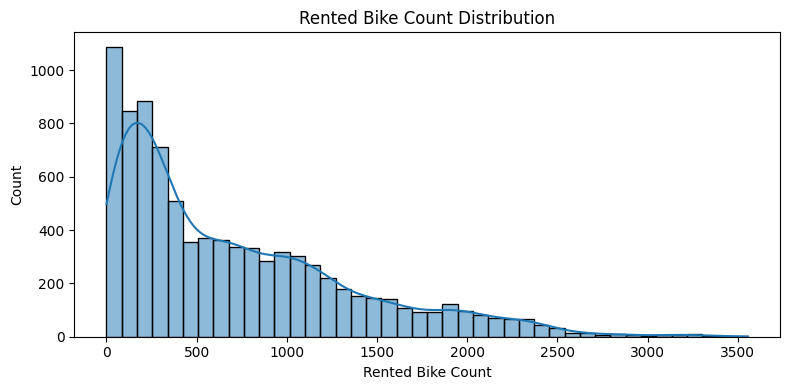

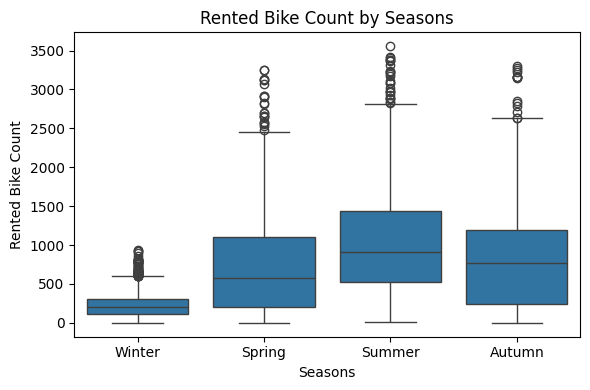

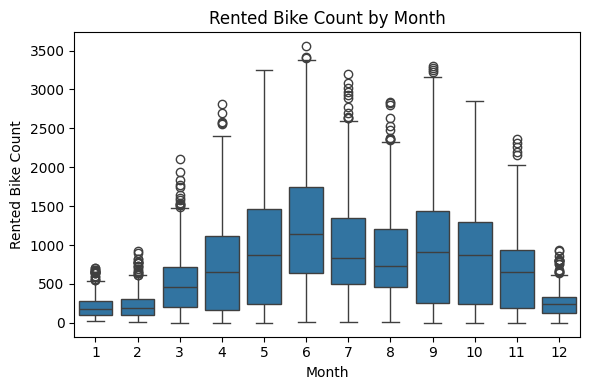

C:\Users\anavn\AppData\Local\Temp\ipykernel_20820\3212511358.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


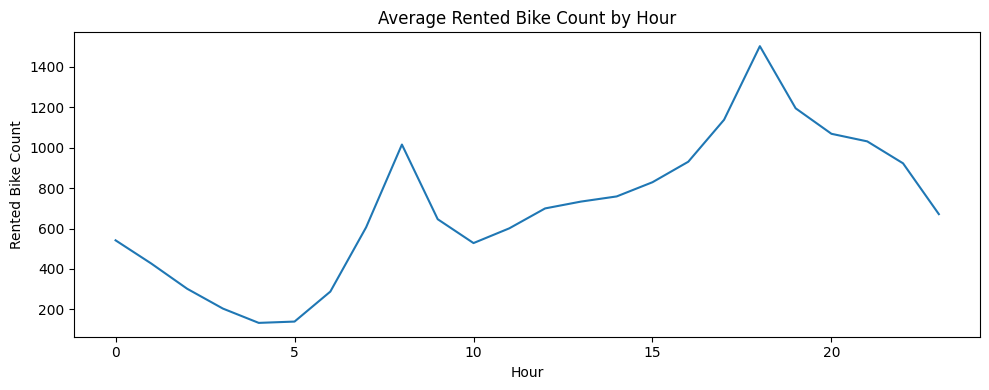

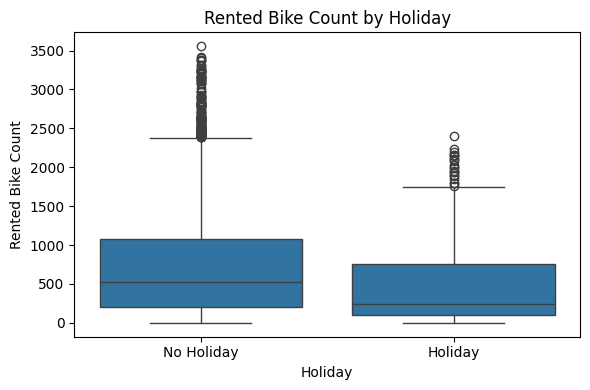

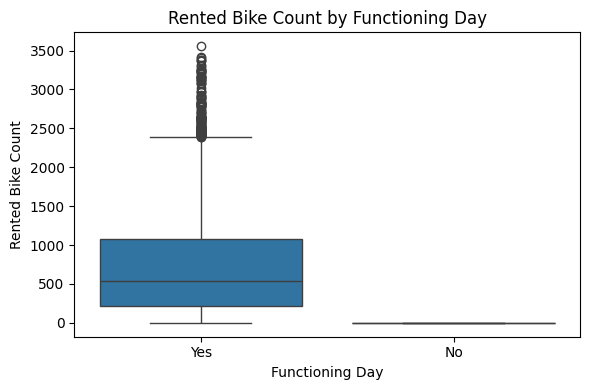

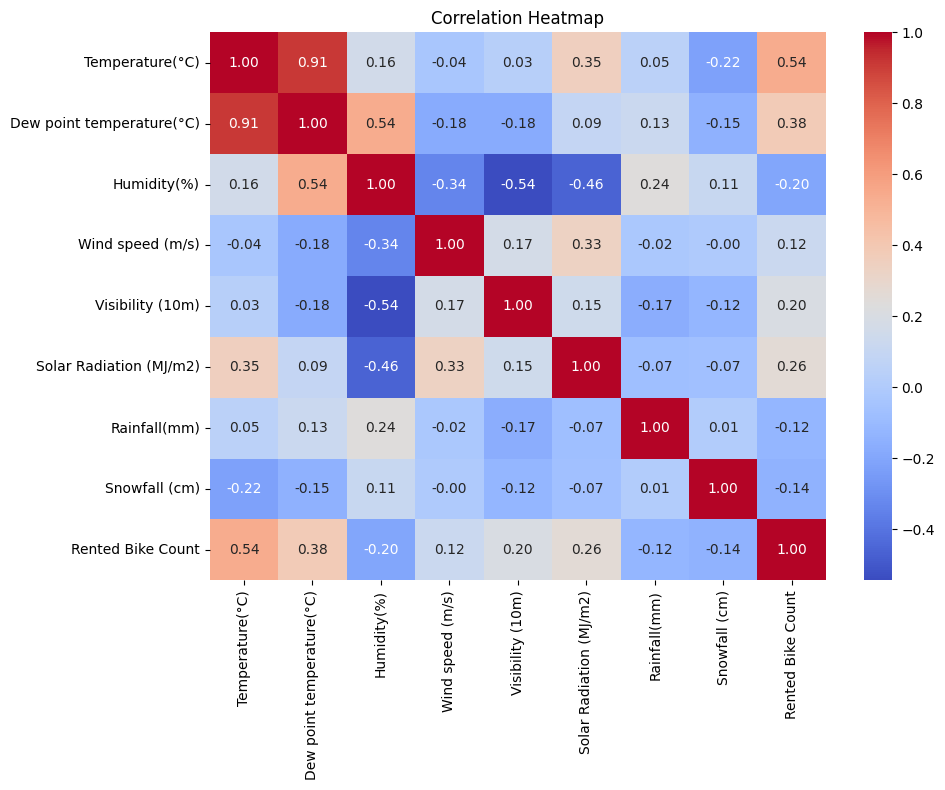

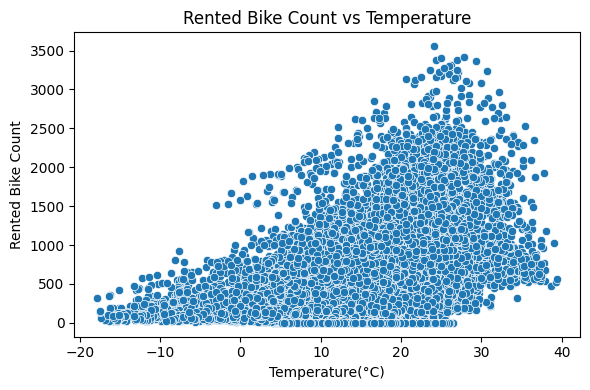

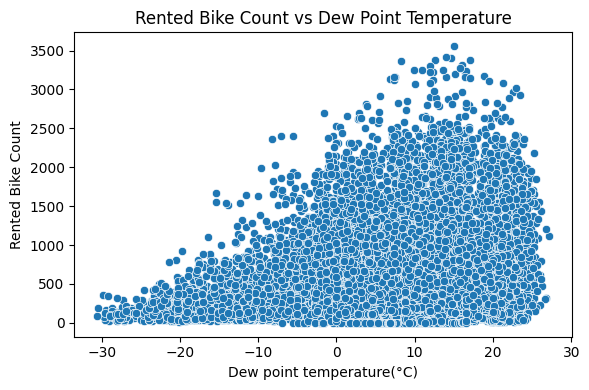

C:\Users\anavn\AppData\Local\Temp\ipykernel_20820\3212511358.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


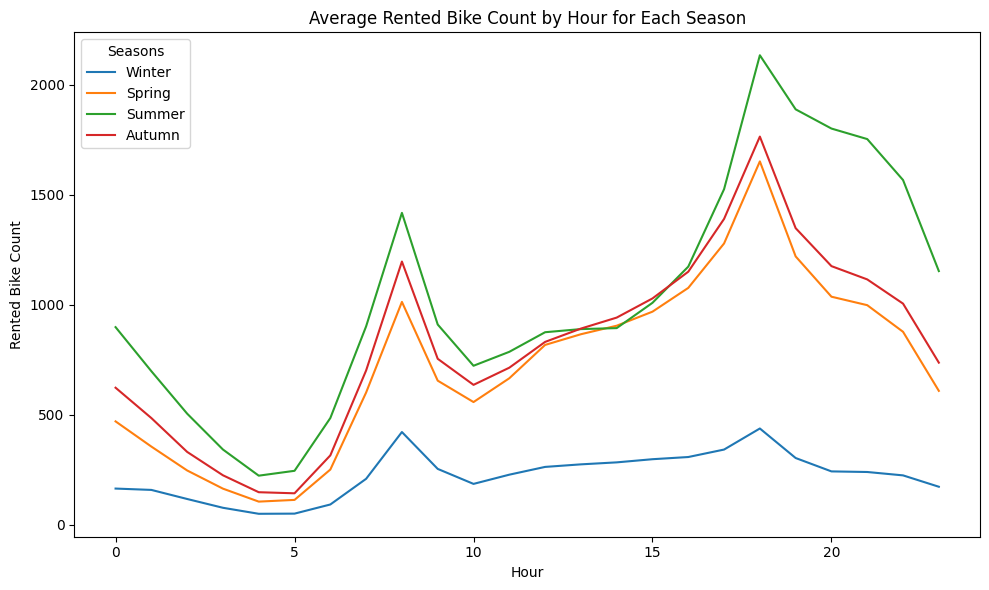

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 30), features: 30


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Simple Deep LSTM: input_dim=30, hidden=[256,128,64]
Epoch 1/100: train 0.3962 | val 0.3764
Epoch 2/100: train 0.1986 | val 0.3047
Epoch 3/100: train 0.1620 | val 0.2108
Epoch 4/100: train 0.1331 | val 0.2180
Epoch 5/100: train 0.1176 | val 0.1949
Epoch 6/100: train 0.1011 | val 0.1646
Epoch 7/100: train 0.0871 | val 0.1711
Epoch 8/100: train 0.0781 | val 0.1321
Epoch 9/100: train 0.0715 | val 0.1423
Epoch 10/100: train 0.0613 | val 0.1166
Epoch 11/100: train 0.0559 | val 0.0919
Epoch 12/100: train 0.0507 | val 0.0944
Epoch 13/100: train 0.0444 | val 0.0924
Epoch 14/100: train 0.0417 | val 0.0715
Epoch 15/100: train 0.0383 | val 0.0798
Epoch 16/100: train 0.0364 | val 0.0684
Epoch 17/100: train 0.0361 | val 0.0658
Epoch 18/100: train 0.0337 | val 0.0695
Epoch 19/100: train 0.0329 | val 0.0641
Epoch 20/100: train 0.0332 | val 0.0585
Epoch 21/100: train 0.0315 | val 0.0623
Epoch 22/100: train 0.0300 | val 0.0730
Epoch 23/100: train 0.0315 | val 0.0659
Epoch 24/100: train 0.0291 | val 0.05

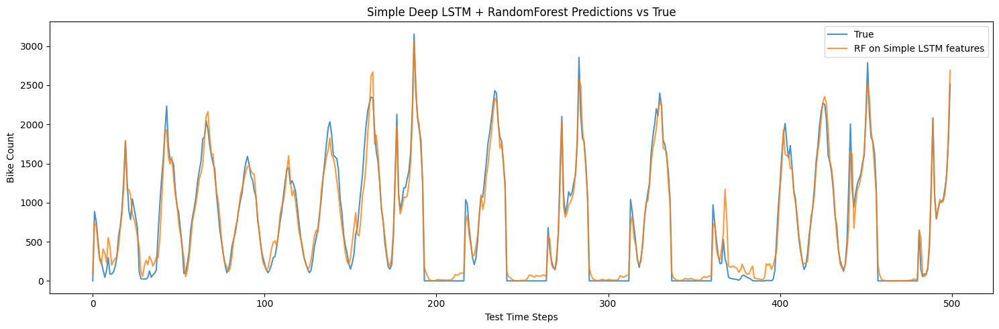

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 30
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):
        X_seq.append(X[i:i + seq_len])
        y_seq.append(y[i + seq_len - 1])
    return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

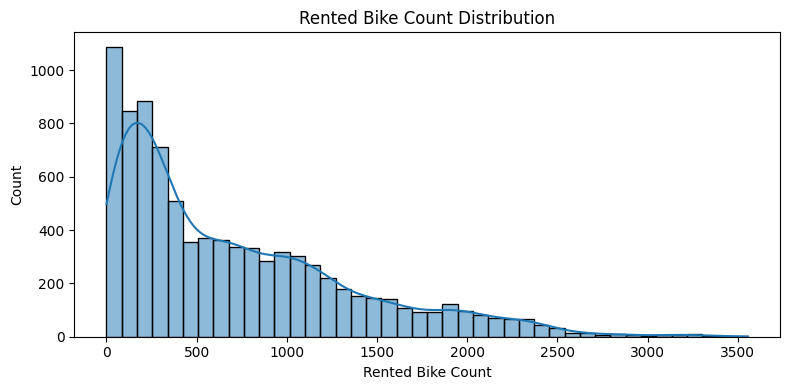

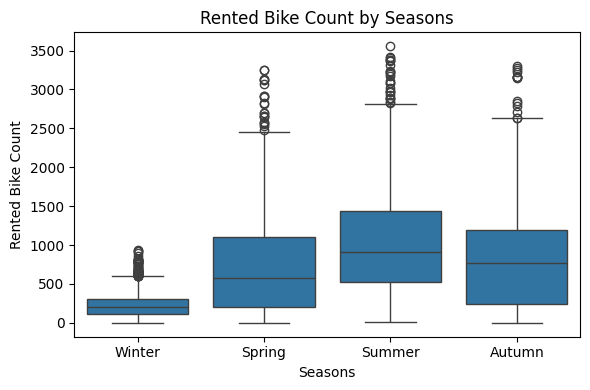

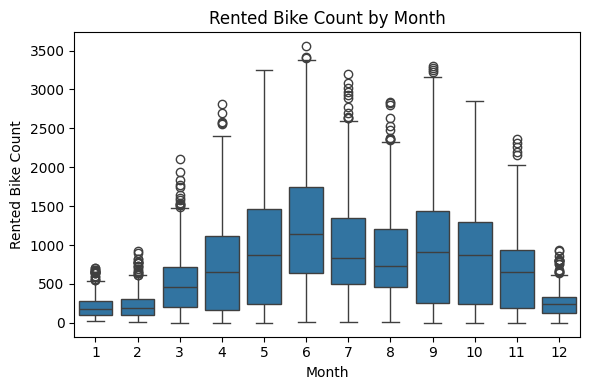

C:\Users\anavn\AppData\Local\Temp\ipykernel_20820\3746603527.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


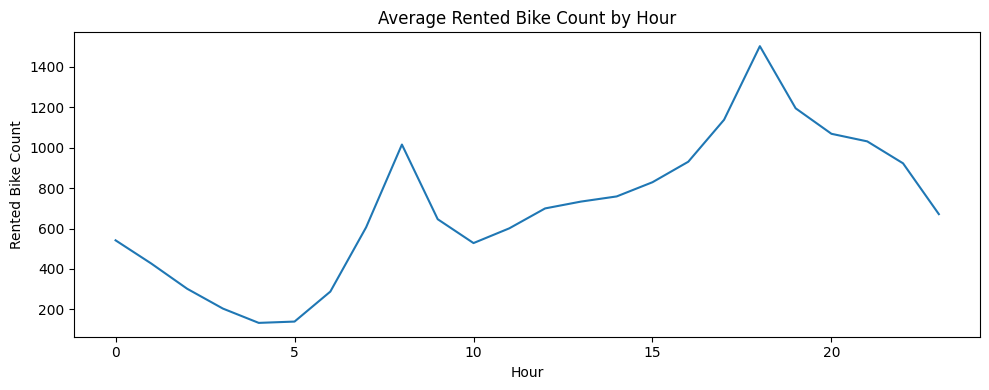

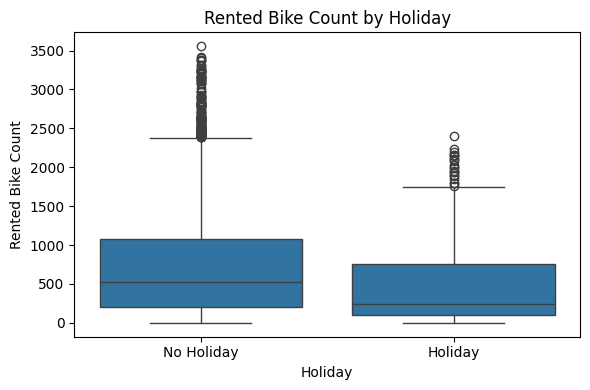

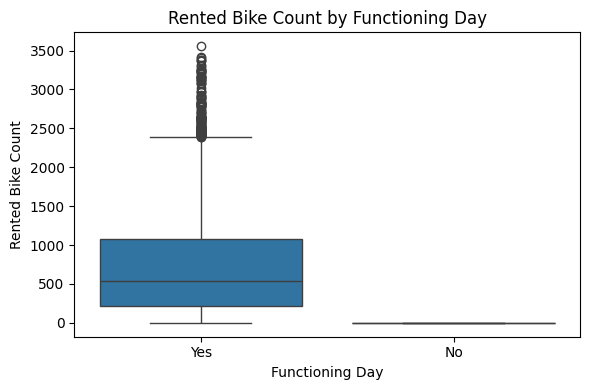

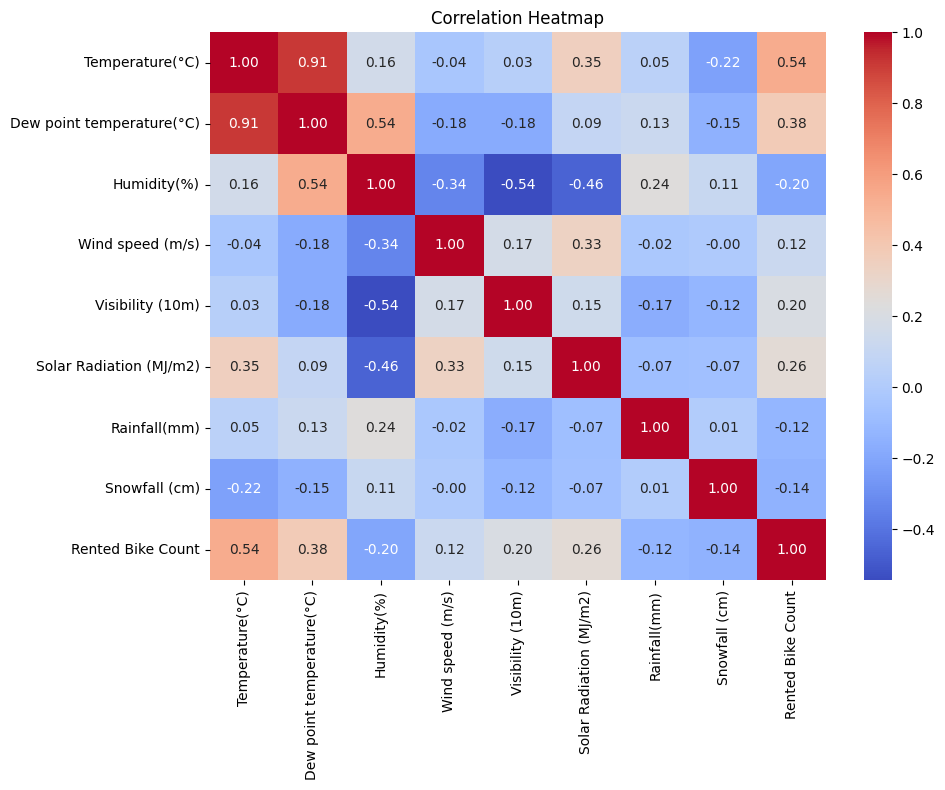

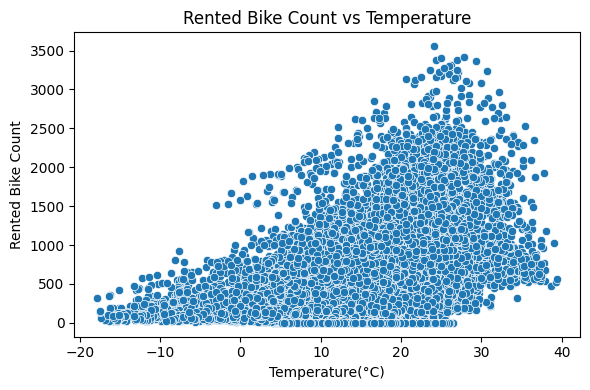

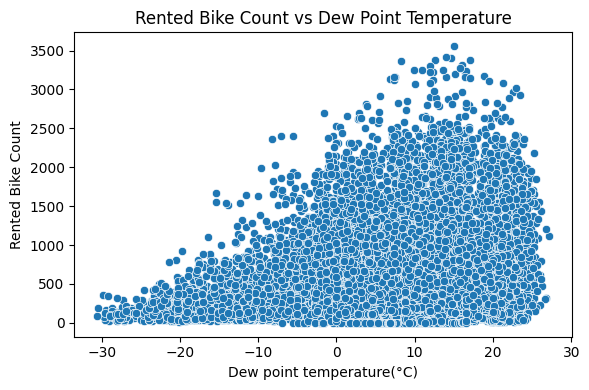

C:\Users\anavn\AppData\Local\Temp\ipykernel_20820\3746603527.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


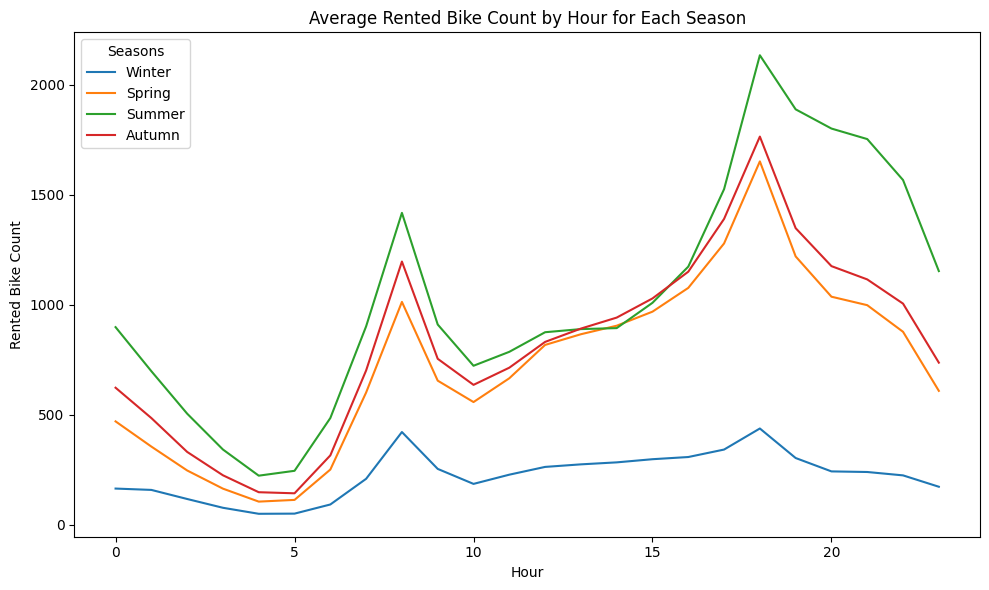

Training on 5933 train sequences, 1047 val sequences
Sequence shape: (5933, 24, 30), features: 30
Simple Deep LSTM: input_dim=30, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4130 | val 0.3890
Epoch 2/100: train 0.2163 | val 0.3076
Epoch 3/100: train 0.1762 | val 0.2817
Epoch 4/100: train 0.1489 | val 0.2814
Epoch 5/100: train 0.1317 | val 0.2571
Epoch 6/100: train 0.1270 | val 0.2307
Epoch 7/100: train 0.1152 | val 0.2226
Epoch 8/100: train 0.1059 | val 0.2187
Epoch 9/100: train 0.0958 | val 0.2482
Epoch 10/100: train 0.0900 | val 0.2127
Epoch 11/100: train 0.0818 | val 0.2180
Epoch 12/100: train 0.0785 | val 0.2013
Epoch 13/100: train 0.0752 | val 0.2046
Epoch 14/100: train 0.0683 | val 0.1920
Epoch 15/100: train 0.0635 | val 0.2238
Epoch 16/100: train 0.0583 | val 0.2102
Epoch 17/100: train 0.0557 | val 0.2110
Epoch 18/100: train 0.0548 | val 0.2193
Epoch 19/100: train 0.0542 | val 0.2084
Epoch 20/100: train 0.0532 | val 0.2150
Epoch 21/100: train 0.0462 | val 0.1949
Epoch 22/100: train 0.0465 | val 0.1829
Epoch 23/100: train 0.0434 | val 0.2274
Epoch 24/100: train 0.0414 | val 0.2030
Epoch 25/100: train 0.0434 | val 0.1910
Epoch 26/

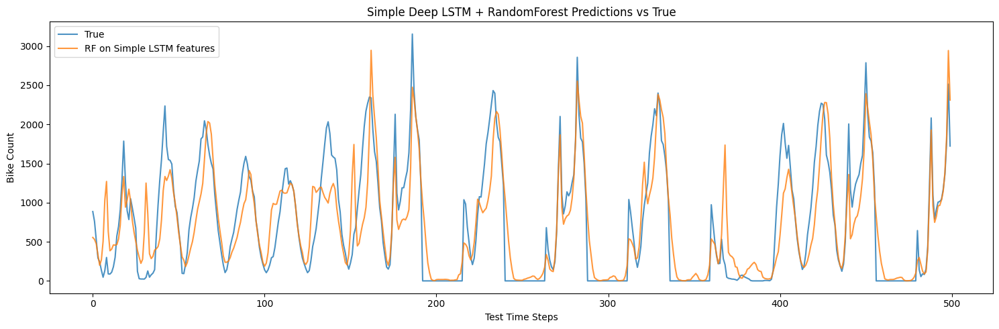

In [3]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 30
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len - 1):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

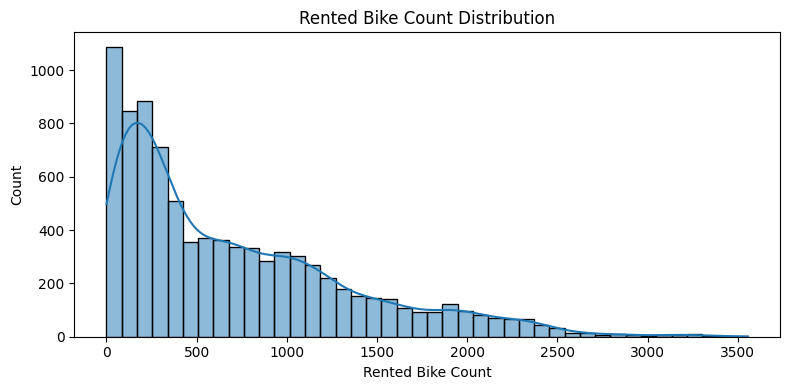

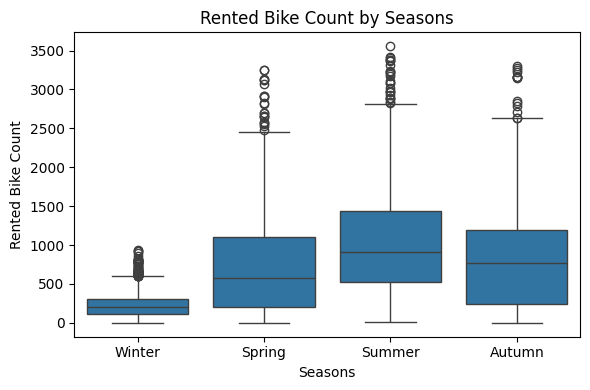

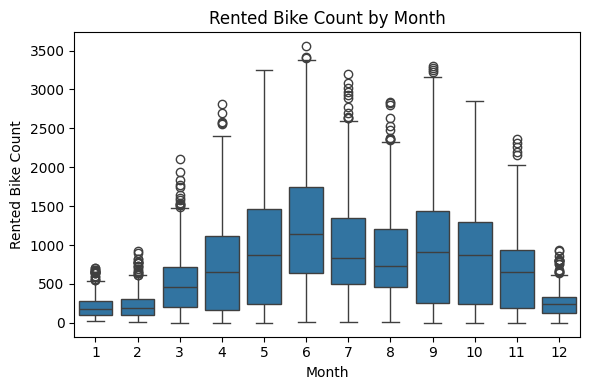

C:\Users\anavn\AppData\Local\Temp\ipykernel_30068\3043624768.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


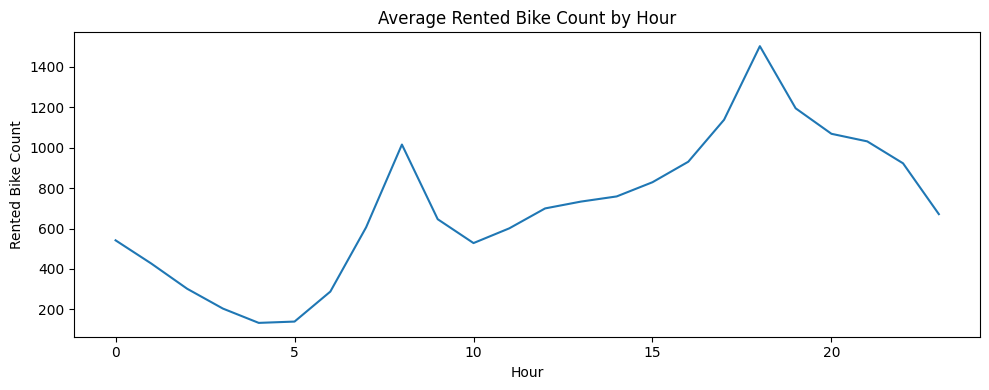

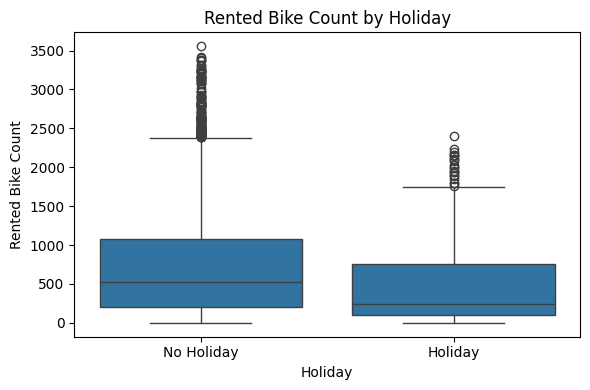

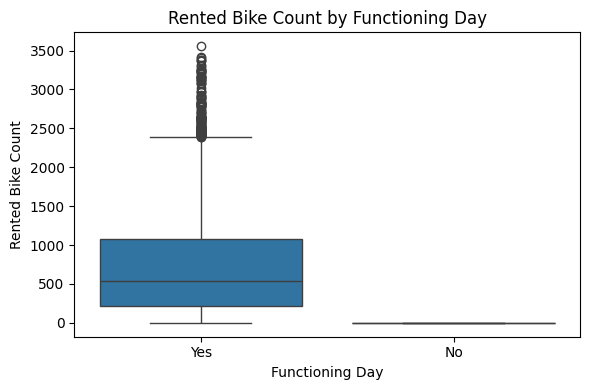

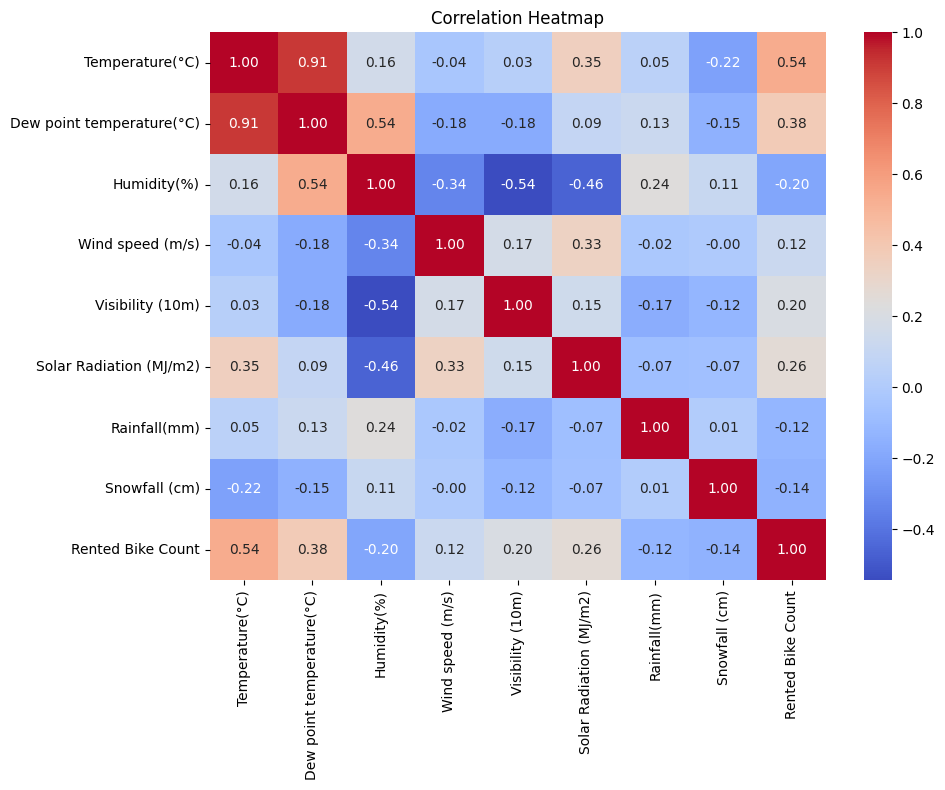

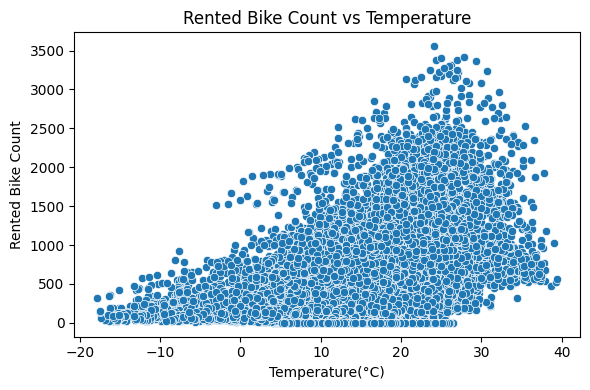

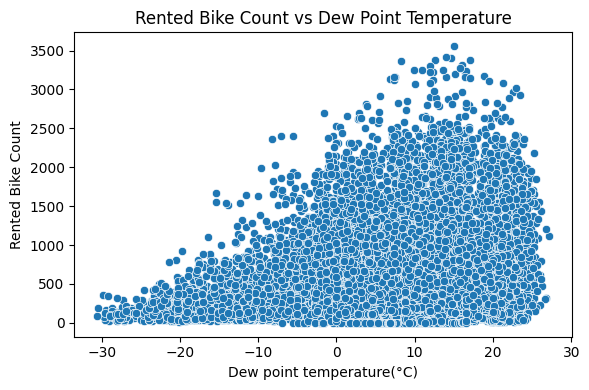

C:\Users\anavn\AppData\Local\Temp\ipykernel_30068\3043624768.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


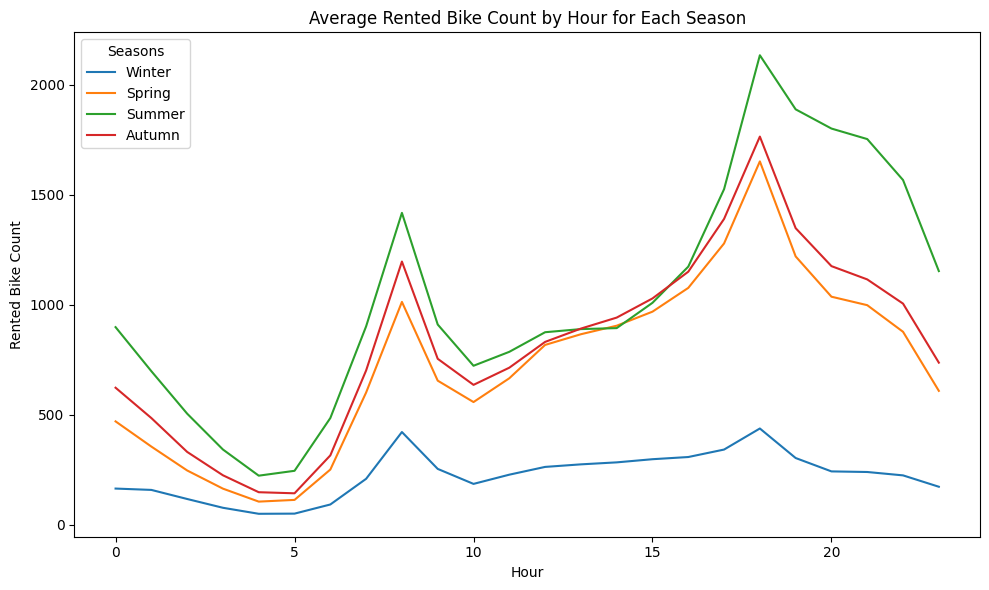

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 30), features: 30
Simple Deep LSTM: input_dim=30, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4061 | val 0.4052
Epoch 2/100: train 0.2163 | val 0.3215
Epoch 3/100: train 0.1764 | val 0.2490
Epoch 4/100: train 0.1527 | val 0.2666
Epoch 5/100: train 0.1379 | val 0.2242
Epoch 6/100: train 0.1224 | val 0.2286
Epoch 7/100: train 0.1094 | val 0.2809
Epoch 8/100: train 0.1027 | val 0.2996
Epoch 9/100: train 0.0956 | val 0.2370
Epoch 10/100: train 0.0848 | val 0.2628
Epoch 11/100: train 0.0816 | val 0.1937
Epoch 12/100: train 0.0757 | val 0.2171
Epoch 13/100: train 0.0699 | val 0.2277
Epoch 14/100: train 0.0661 | val 0.1900
Epoch 15/100: train 0.0628 | val 0.1870
Epoch 16/100: train 0.0570 | val 0.1976
Epoch 17/100: train 0.0556 | val 0.1898
Epoch 18/100: train 0.0520 | val 0.1724
Epoch 19/100: train 0.0501 | val 0.1630
Epoch 20/100: train 0.0483 | val 0.1747
Epoch 21/100: train 0.0461 | val 0.1801
Epoch 22/100: train 0.0435 | val 0.1861
Epoch 23/100: train 0.0405 | val 0.1696
Epoch 24/100: train 0.0400 | val 0.1819
Epoch 25/100: train 0.0388 | val 0.1632
Epoch 26/

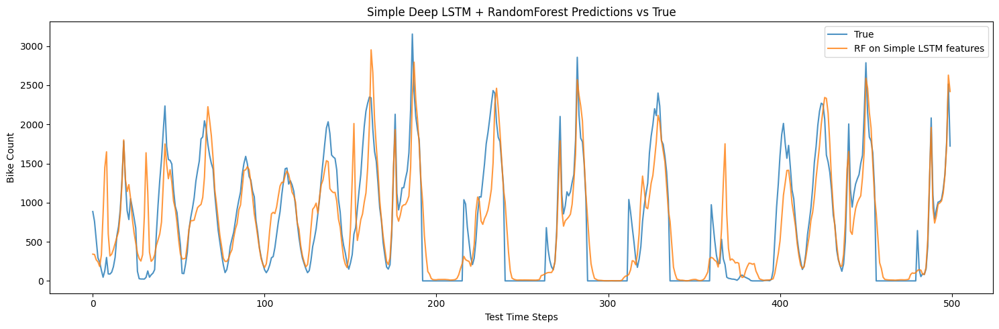

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 30
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

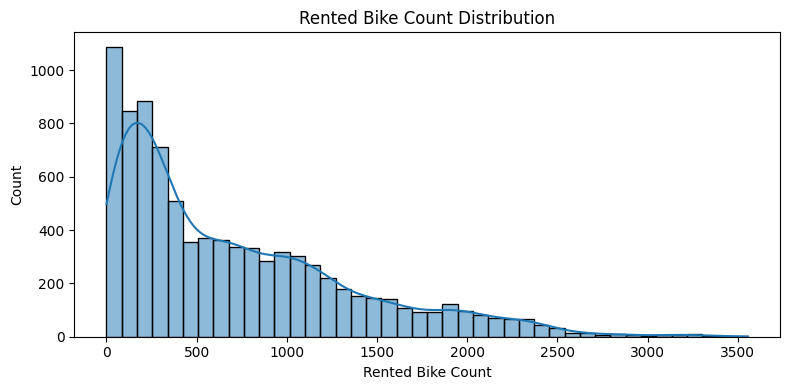

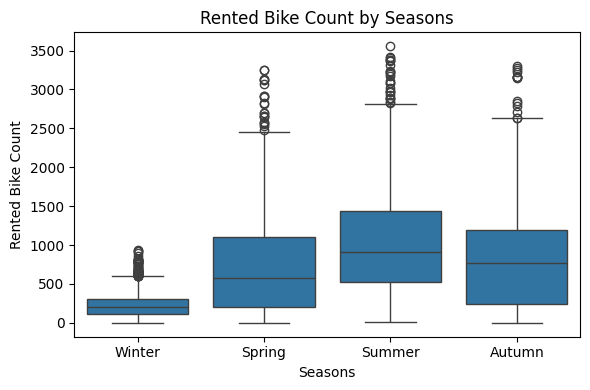

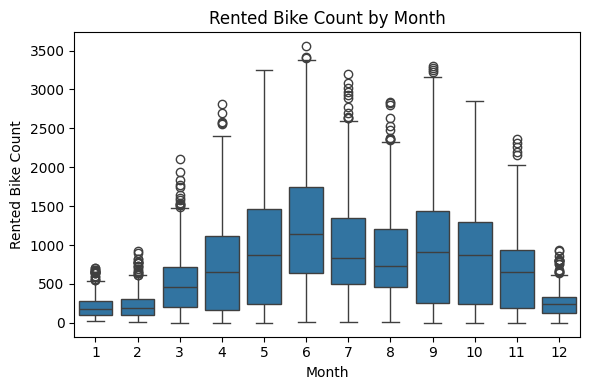

C:\Users\anavn\AppData\Local\Temp\ipykernel_34720\3694990460.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


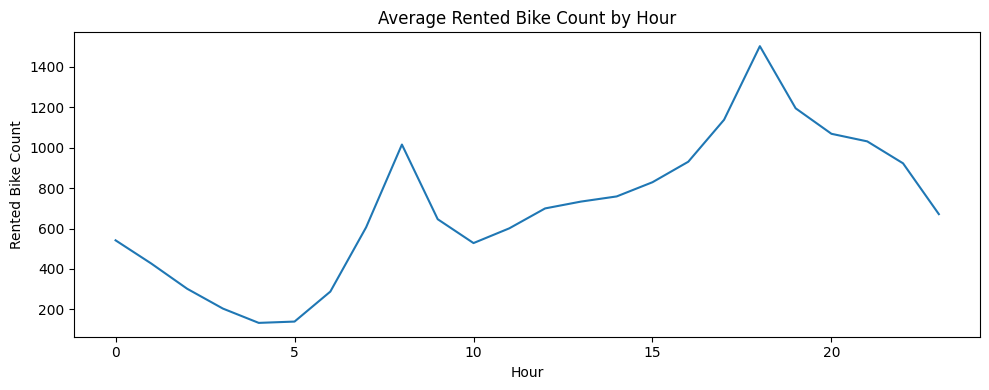

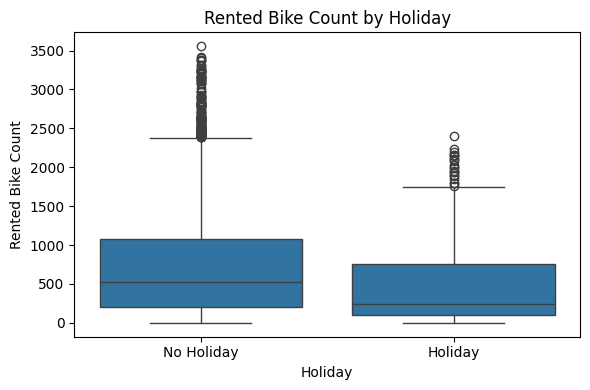

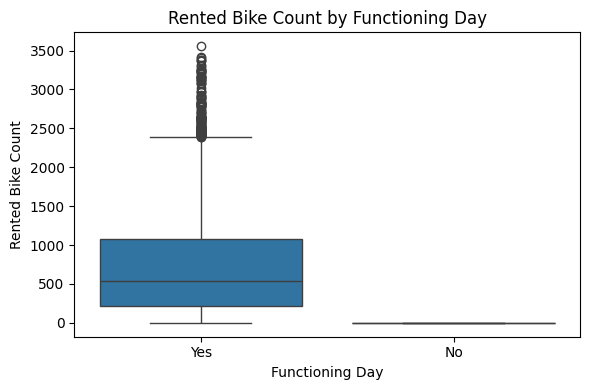

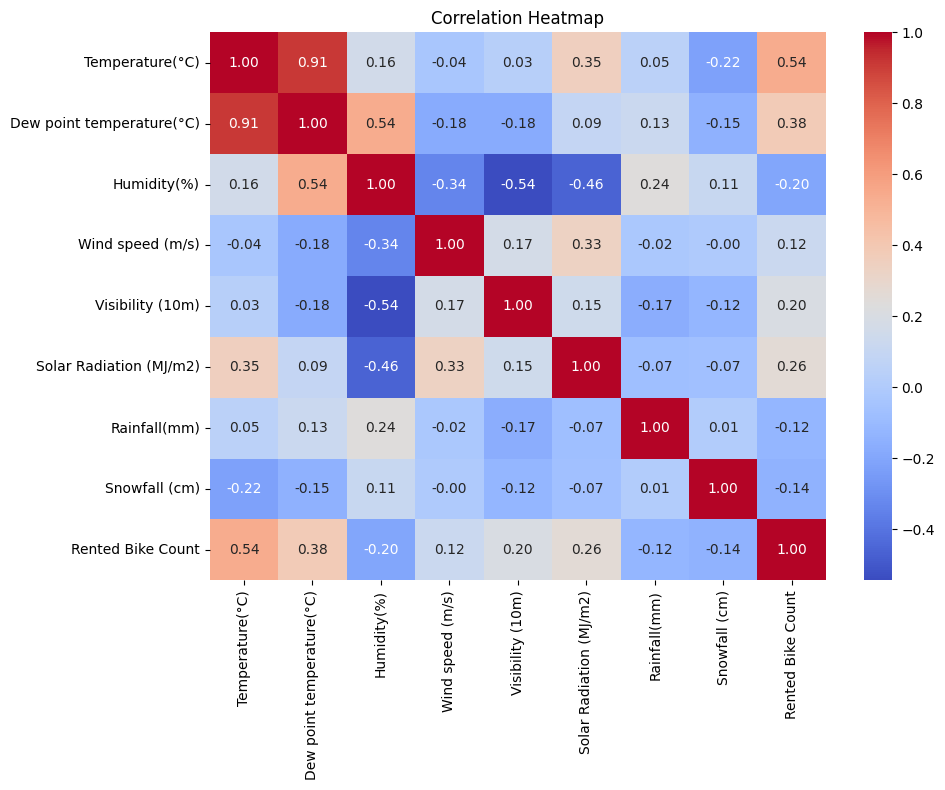

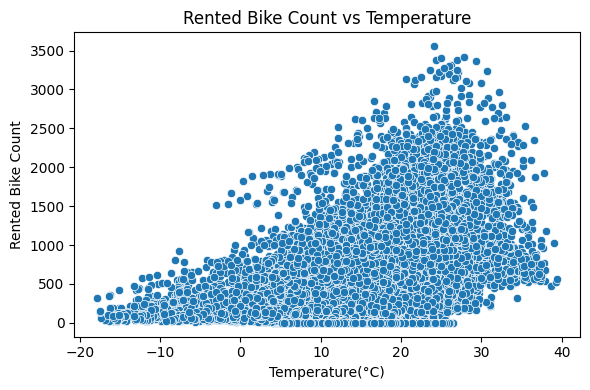

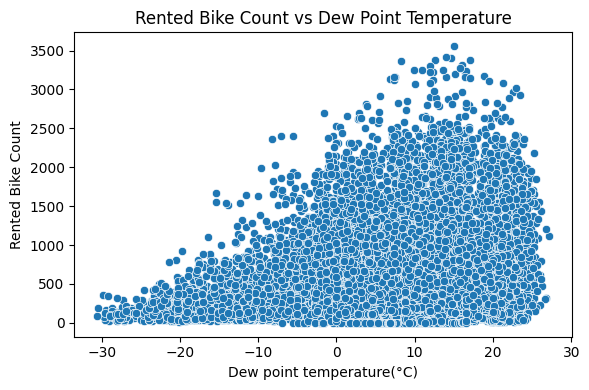

C:\Users\anavn\AppData\Local\Temp\ipykernel_34720\3694990460.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


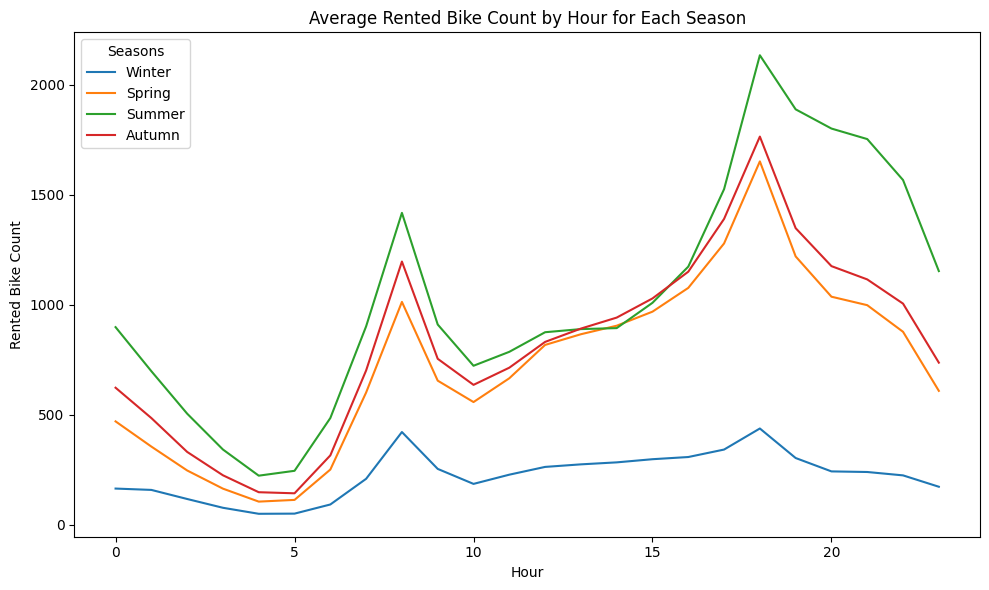

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15
Simple Deep LSTM: input_dim=15, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4082 | val 0.3939
Epoch 2/100: train 0.2290 | val 0.3174
Epoch 3/100: train 0.1967 | val 0.2505
Epoch 4/100: train 0.1786 | val 0.2309
Epoch 5/100: train 0.1603 | val 0.2134
Epoch 6/100: train 0.1494 | val 0.2046
Epoch 7/100: train 0.1371 | val 0.1982
Epoch 8/100: train 0.1297 | val 0.1785
Epoch 9/100: train 0.1195 | val 0.1769
Epoch 10/100: train 0.1162 | val 0.1713
Epoch 11/100: train 0.1059 | val 0.1504
Epoch 12/100: train 0.1013 | val 0.1662
Epoch 13/100: train 0.0954 | val 0.1342
Epoch 14/100: train 0.0865 | val 0.1373
Epoch 15/100: train 0.0856 | val 0.1280
Epoch 16/100: train 0.0782 | val 0.1279
Epoch 17/100: train 0.0730 | val 0.1185
Epoch 18/100: train 0.0711 | val 0.1234
Epoch 19/100: train 0.0682 | val 0.1131
Epoch 20/100: train 0.0655 | val 0.1188
Epoch 21/100: train 0.0629 | val 0.1096
Epoch 22/100: train 0.0593 | val 0.1271
Epoch 23/100: train 0.0610 | val 0.1079
Epoch 24/100: train 0.0614 | val 0.1114
Epoch 25/100: train 0.0577 | val 0.1214
Epoch 26/

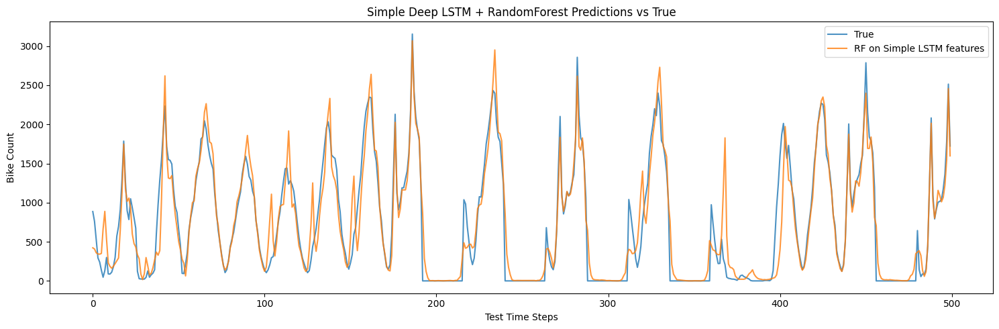

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

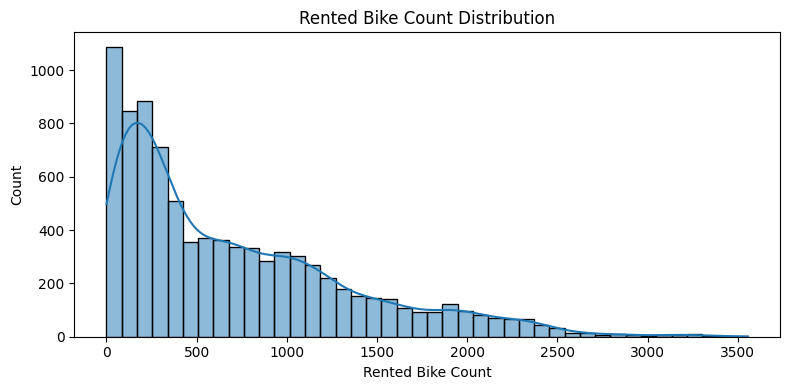

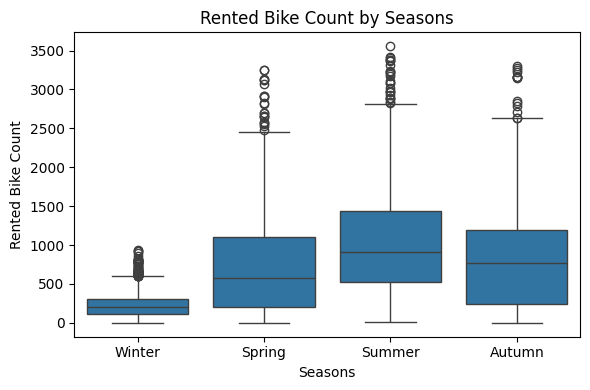

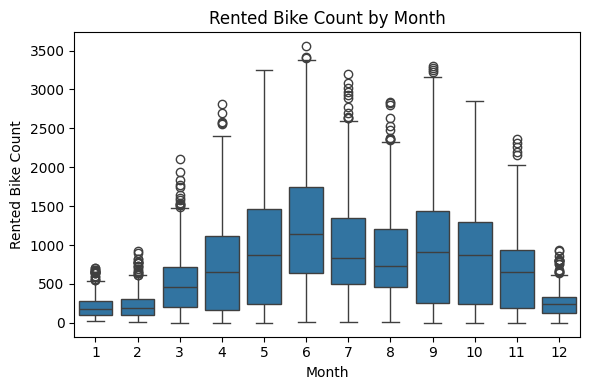

C:\Users\anavn\AppData\Local\Temp\ipykernel_10756\2311772383.py:83: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


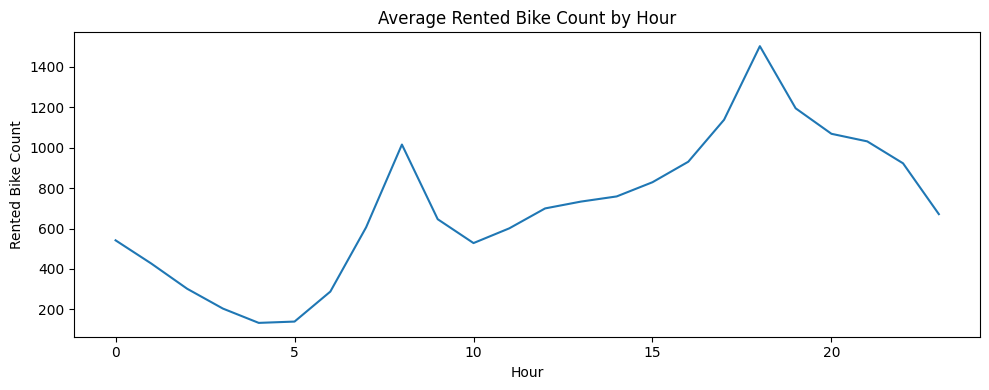

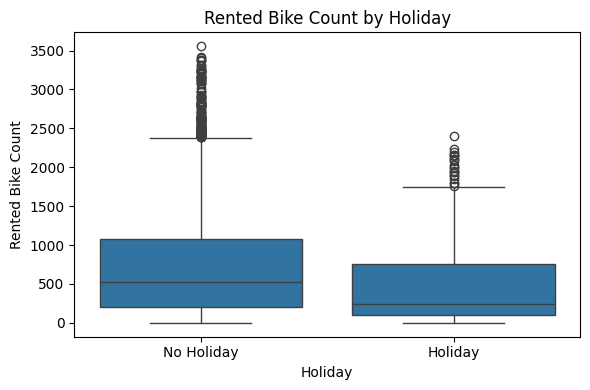

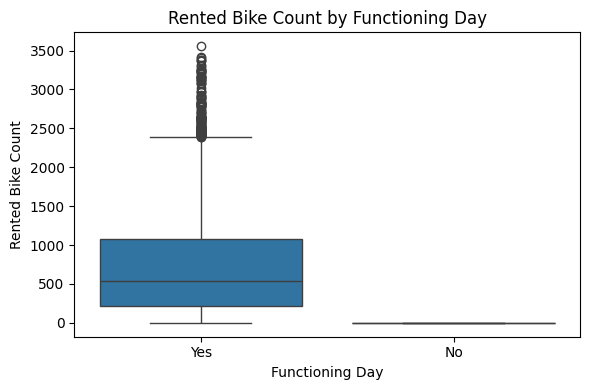

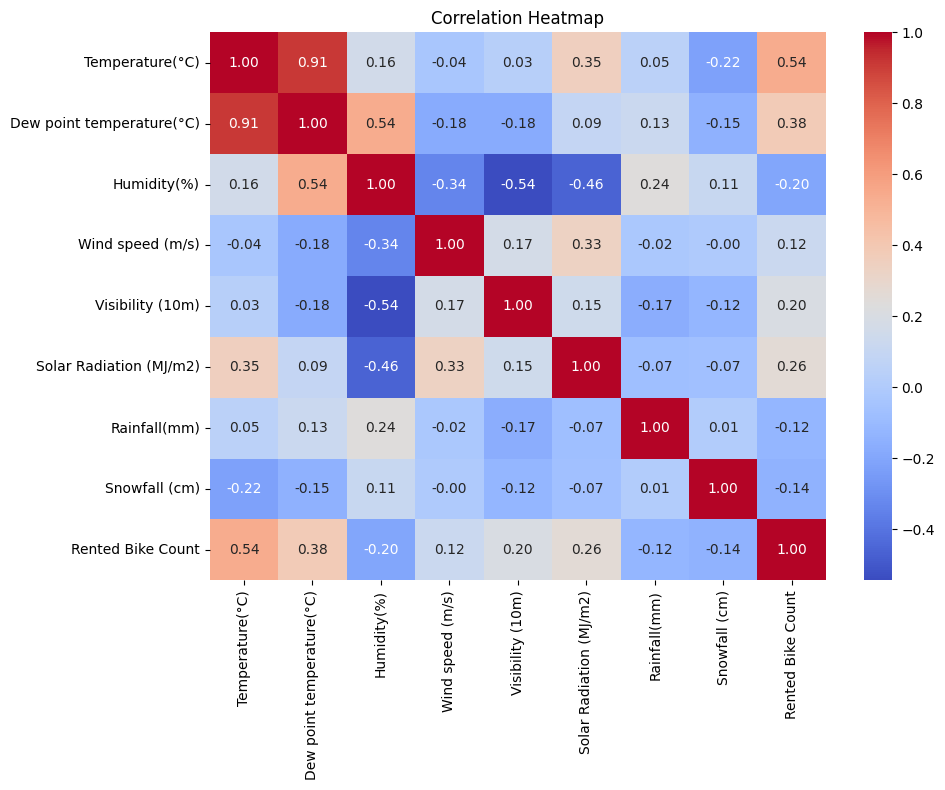

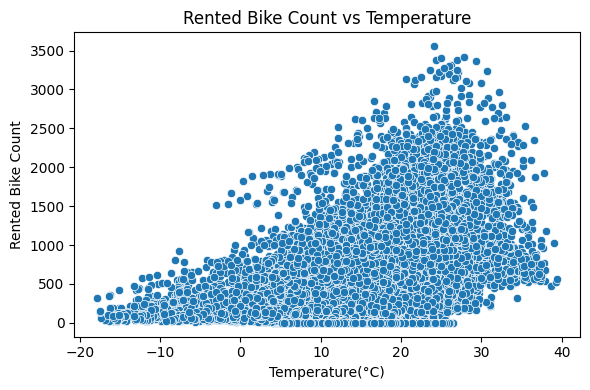

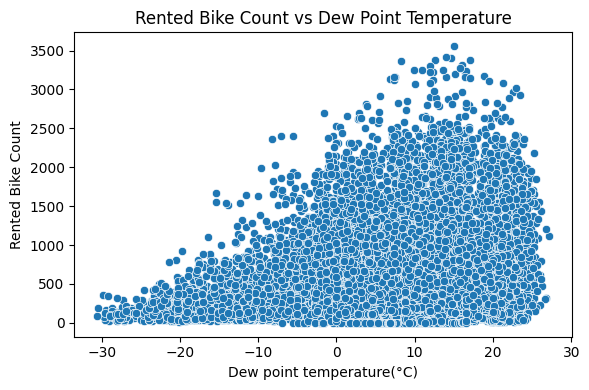

C:\Users\anavn\AppData\Local\Temp\ipykernel_10756\2311772383.py:131: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


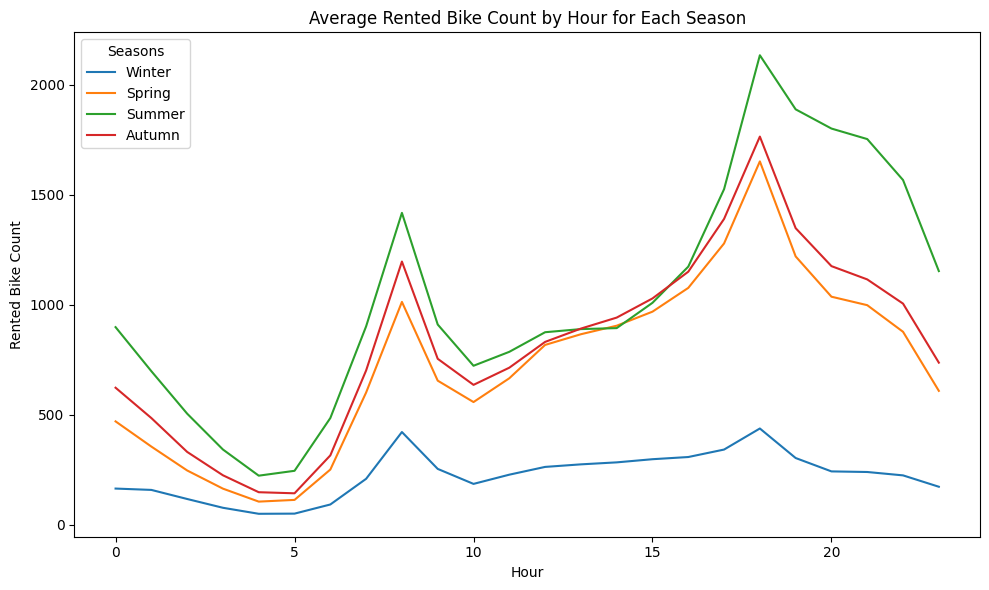

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15
Simple Deep LSTM: input_dim=15, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4159 | val 0.4223
Epoch 2/100: train 0.2312 | val 0.3086
Epoch 3/100: train 0.1935 | val 0.2648
Epoch 4/100: train 0.1725 | val 0.2424
Epoch 5/100: train 0.1619 | val 0.2080
Epoch 6/100: train 0.1454 | val 0.2023
Epoch 7/100: train 0.1404 | val 0.1987
Epoch 8/100: train 0.1356 | val 0.1863
Epoch 9/100: train 0.1248 | val 0.2003
Epoch 10/100: train 0.1160 | val 0.1537
Epoch 11/100: train 0.1080 | val 0.1542
Epoch 12/100: train 0.1010 | val 0.1572
Epoch 13/100: train 0.0955 | val 0.1332
Epoch 14/100: train 0.0905 | val 0.1505
Epoch 15/100: train 0.0890 | val 0.1256
Epoch 16/100: train 0.0827 | val 0.1187
Epoch 17/100: train 0.0814 | val 0.1251
Epoch 18/100: train 0.0755 | val 0.1392
Epoch 19/100: train 0.0736 | val 0.1099
Epoch 20/100: train 0.0690 | val 0.1140
Epoch 21/100: train 0.0687 | val 0.1243
Epoch 22/100: train 0.0651 | val 0.1123
Epoch 23/100: train 0.0637 | val 0.1081
Epoch 24/100: train 0.0635 | val 0.1156
Epoch 25/100: train 0.0620 | val 0.1140
Epoch 26/

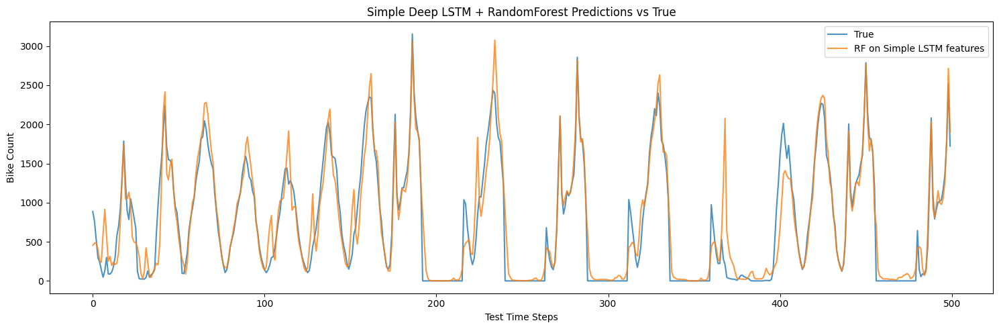

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# Load data and EDA
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# Feature engineering 
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)


    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# Chronological train / test split 
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# Feature selection and Scaling
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)
  
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     
        y_seq.append(y[i + seq_len])       
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split 
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# Simple Deep LSTM Model
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# Training with early stopping 
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# Extract LSTM features for RF 
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# RandomForest on LSTM features 
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# Evaluation on TEST set 
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)
mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

#  Plot predictions 
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()



new try

Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

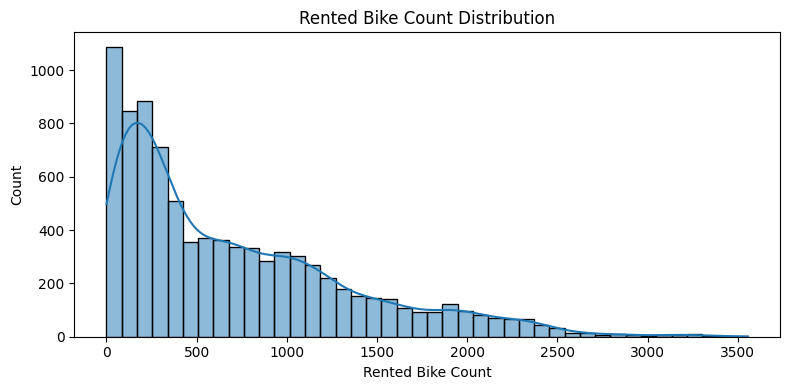

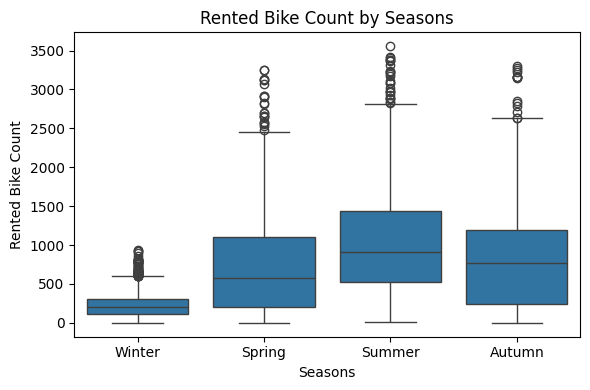

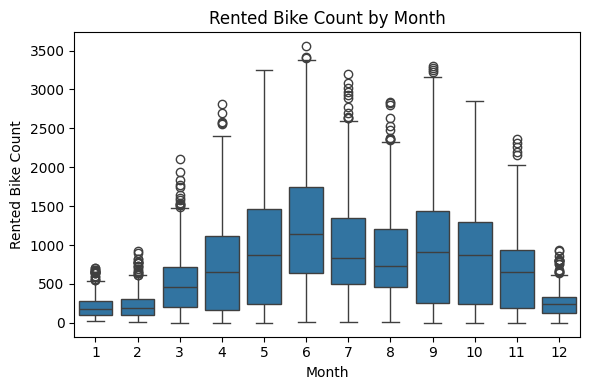

C:\Users\anavn\AppData\Local\Temp\ipykernel_17696\3059936939.py:83: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


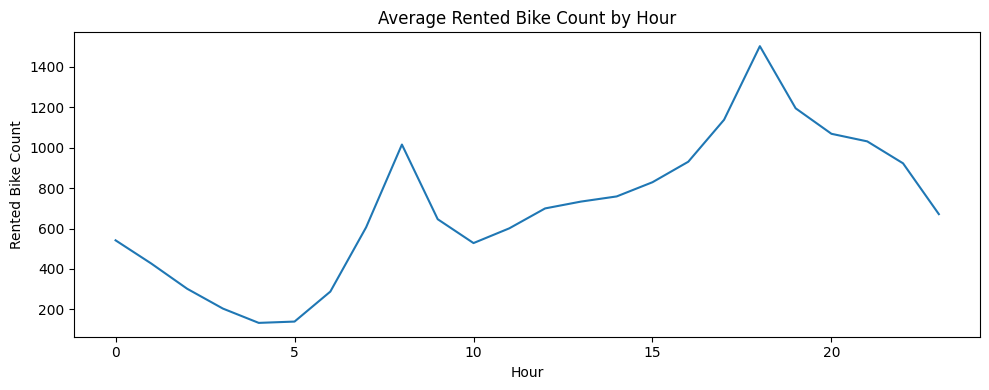

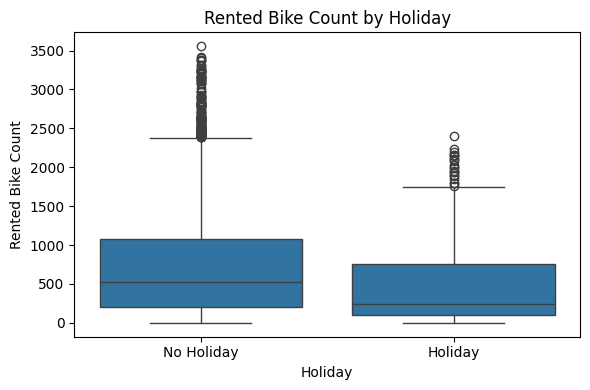

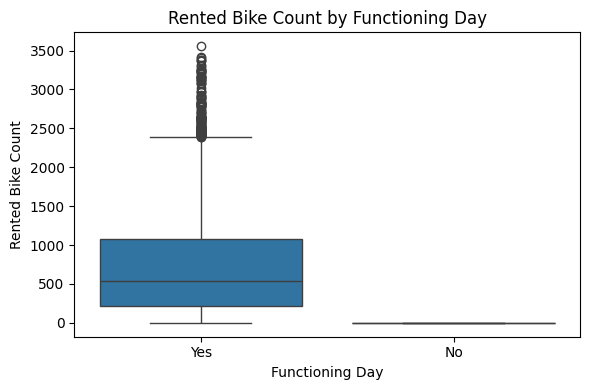

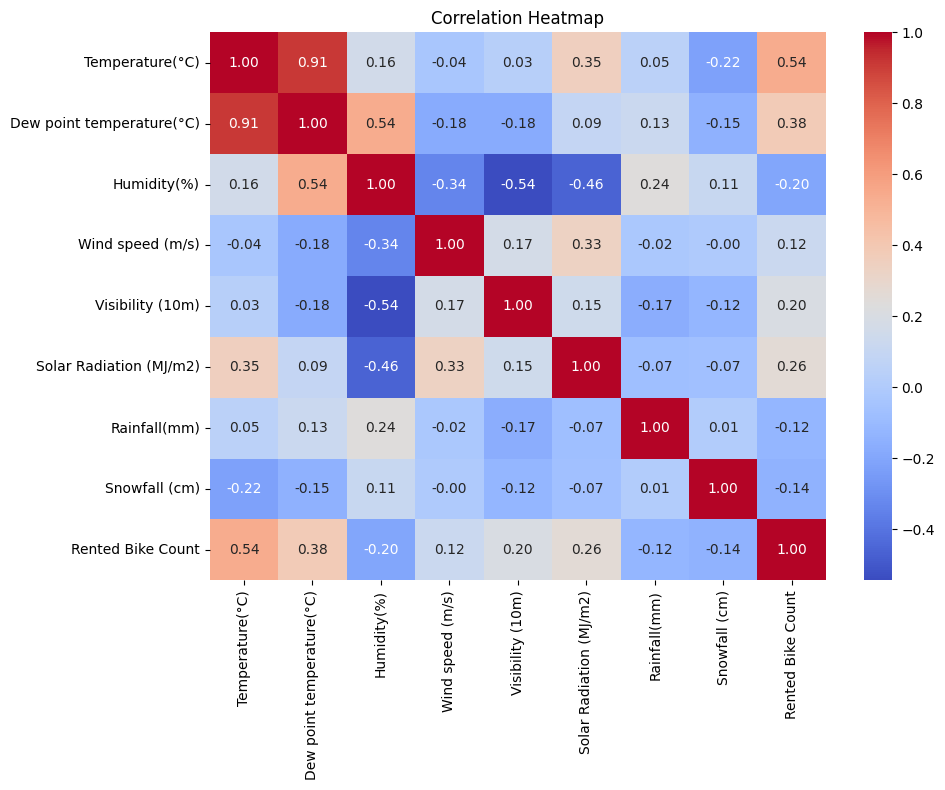

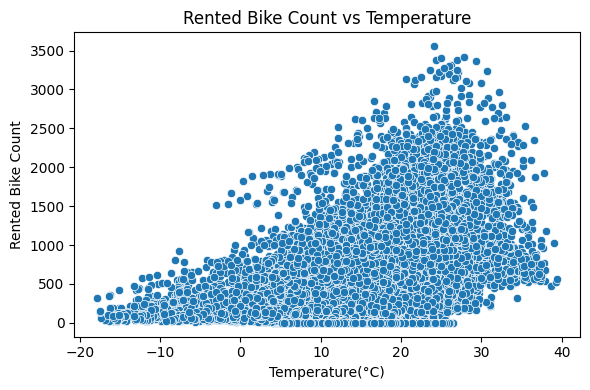

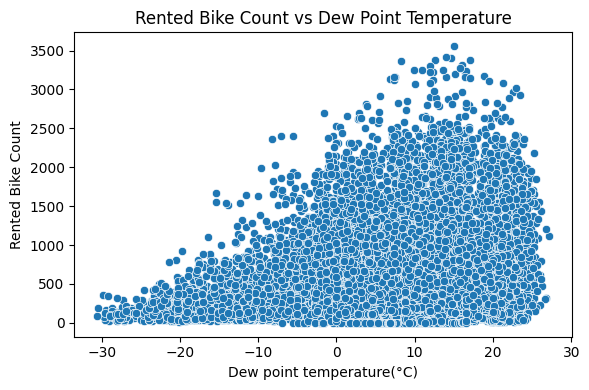

C:\Users\anavn\AppData\Local\Temp\ipykernel_17696\3059936939.py:131: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


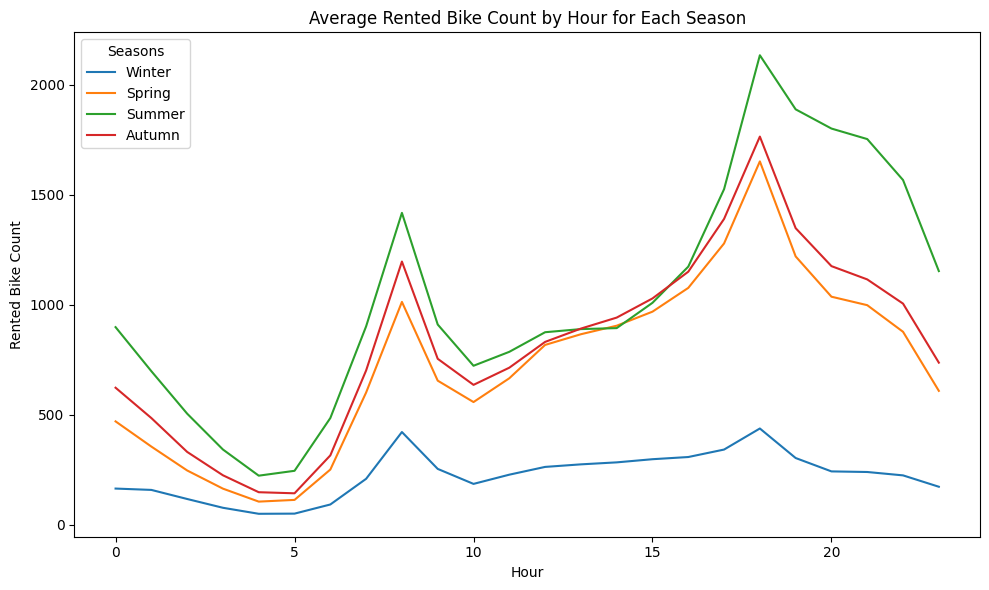

Features before manual removal: 33
Features after manual removal: 31
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15
Simple Deep LSTM: input_dim=15, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4180 | val 0.4249
Epoch 2/100: train 0.2286 | val 0.2989
Epoch 3/100: train 0.1988 | val 0.2486
Epoch 4/100: train 0.1793 | val 0.2254
Epoch 5/100: train 0.1662 | val 0.2193
Epoch 6/100: train 0.1503 | val 0.2074
Epoch 7/100: train 0.1394 | val 0.1929
Epoch 8/100: train 0.1305 | val 0.1876
Epoch 9/100: train 0.1242 | val 0.1519
Epoch 10/100: train 0.1125 | val 0.1493
Epoch 11/100: train 0.1030 | val 0.1366
Epoch 12/100: train 0.0943 | val 0.1292
Epoch 13/100: train 0.0861 | val 0.1365
Epoch 14/100: train 0.0806 | val 0.1172
Epoch 15/100: train 0.0783 | val 0.1242
Epoch 16/100: train 0.0740 | val 0.1134
Epoch 17/100: train 0.0707 | val 0.1110
Epoch 18/100: train 0.0703 | val 0.1303
Epoch 19/100: train 0.0680 | val 0.1154
Epoch 20/100: train 0.0626 | val 0.1196
Epoch 21/100: train 0.0636 | val 0.1107
Epoch 22/100: train 0.0607 | val 0.1136
Epoch 23/100: train 0.0604 | val 0.1125
Epoch 24/100: train 0.0580 | val 0.1095
Epoch 25/100: train 0.0594 | val 0.1118
Epoch 26/

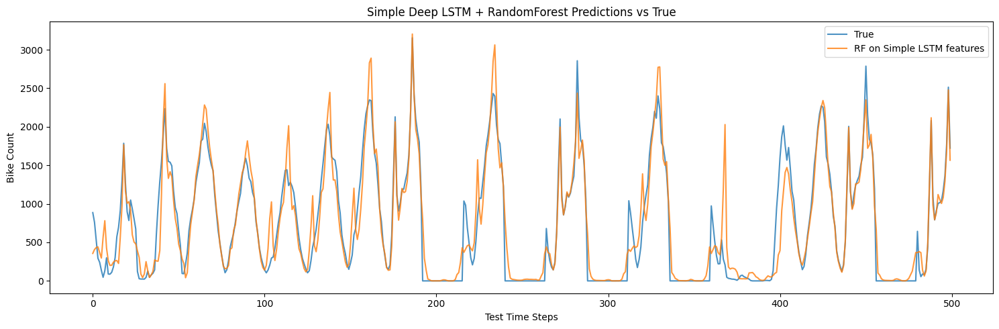

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# Load data and EDA
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# Feature engineering 
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)


    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features before manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}") 
# Chronological train / test split 
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# Feature selection and Scaling
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)
  
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     
        y_seq.append(y[i + seq_len])       
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split 
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# Simple Deep LSTM Model
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# Training with early stopping 
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# Extract LSTM features for RF 
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# RandomForest on LSTM features 
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# Evaluation on TEST set 
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)
mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

#  Plot predictions 
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()



latest try

Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

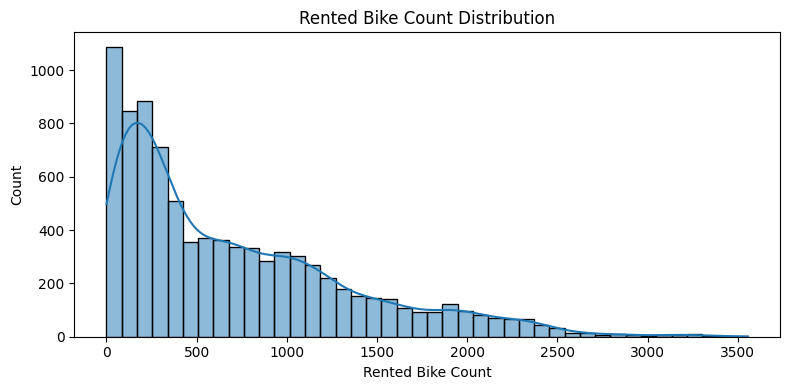

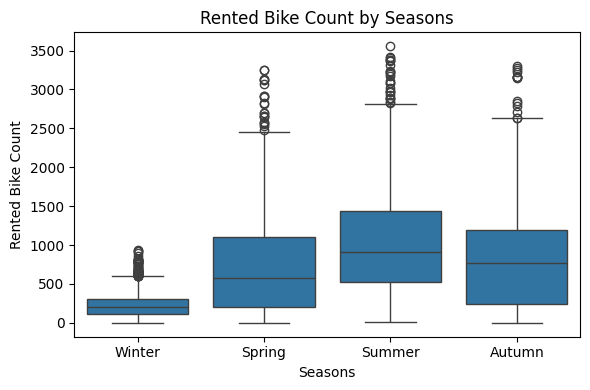

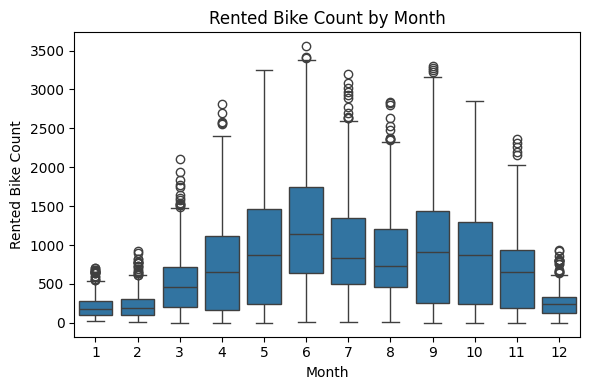

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\3212511358.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


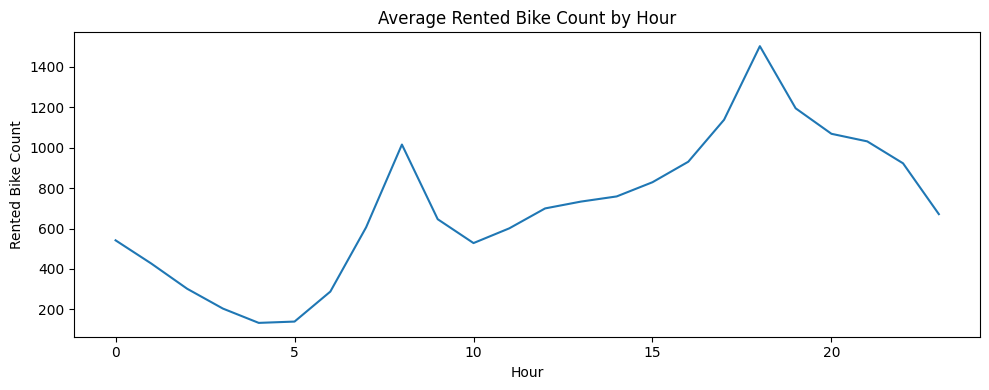

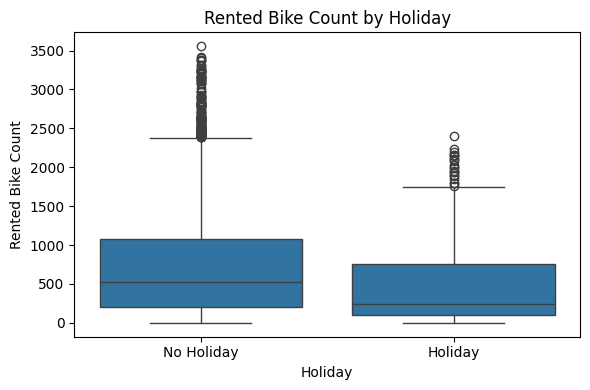

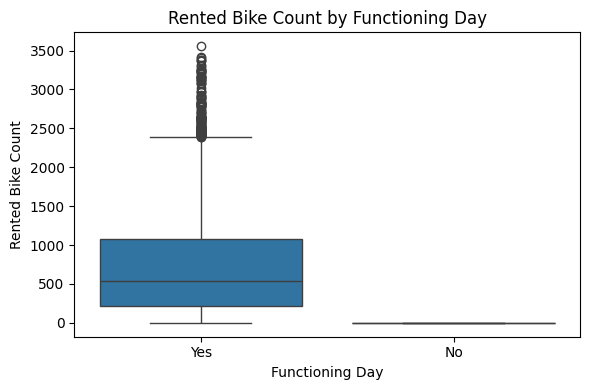

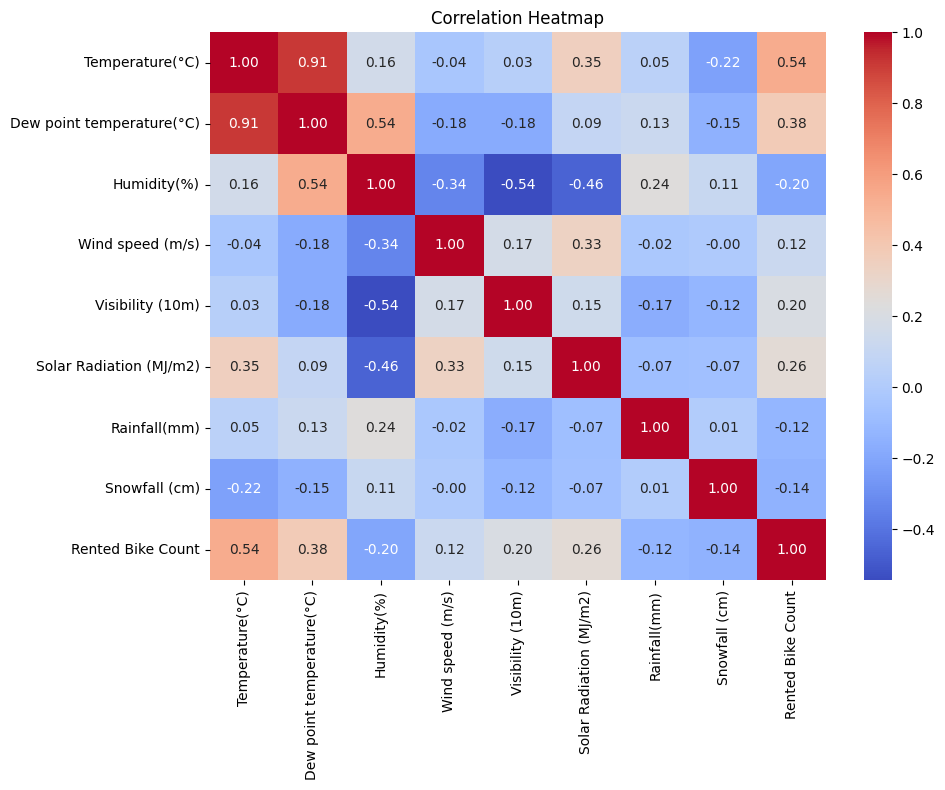

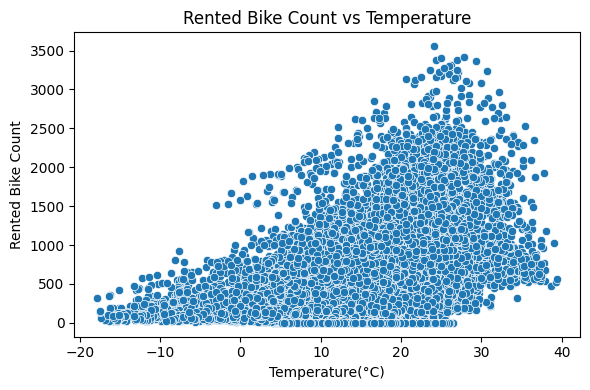

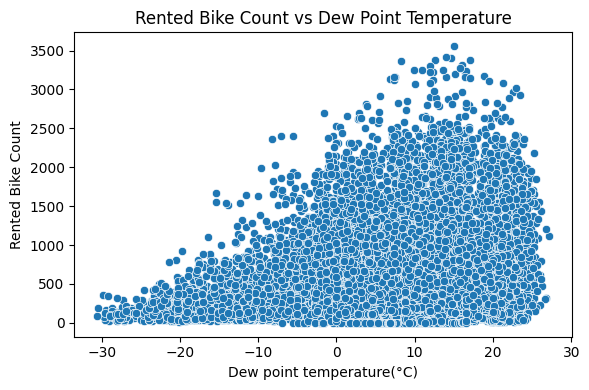

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\3212511358.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


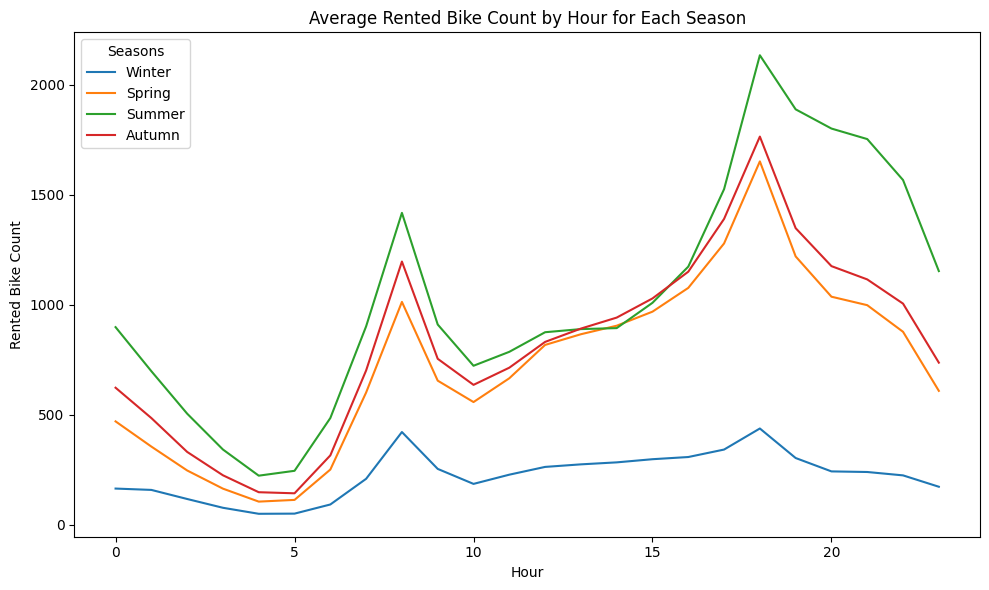

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 30), features: 30
Simple Deep LSTM: input_dim=30, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4043 | val 0.3717
Epoch 2/100: train 0.2004 | val 0.3033
Epoch 3/100: train 0.1605 | val 0.2335
Epoch 4/100: train 0.1325 | val 0.1868
Epoch 5/100: train 0.1113 | val 0.1787
Epoch 6/100: train 0.1008 | val 0.1593
Epoch 7/100: train 0.0865 | val 0.1943
Epoch 8/100: train 0.0771 | val 0.1494
Epoch 9/100: train 0.0658 | val 0.1253
Epoch 10/100: train 0.0603 | val 0.1261
Epoch 11/100: train 0.0525 | val 0.1031
Epoch 12/100: train 0.0462 | val 0.0983
Epoch 13/100: train 0.0431 | val 0.0921
Epoch 14/100: train 0.0399 | val 0.0828
Epoch 15/100: train 0.0384 | val 0.1032
Epoch 16/100: train 0.0359 | val 0.0724
Epoch 17/100: train 0.0348 | val 0.0684
Epoch 18/100: train 0.0330 | val 0.0685
Epoch 19/100: train 0.0309 | val 0.0681
Epoch 20/100: train 0.0304 | val 0.0643
Epoch 21/100: train 0.0312 | val 0.0591
Epoch 22/100: train 0.0286 | val 0.0780
Epoch 23/100: train 0.0300 | val 0.0580
Epoch 24/100: train 0.0274 | val 0.0614
Epoch 25/100: train 0.0266 | val 0.0594
Epoch 26/

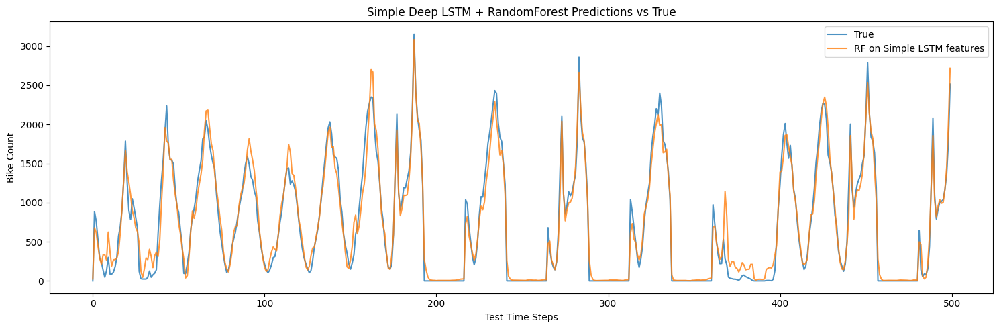

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 30
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):
        X_seq.append(X[i:i + seq_len])
        y_seq.append(y[i + seq_len - 1])
    return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

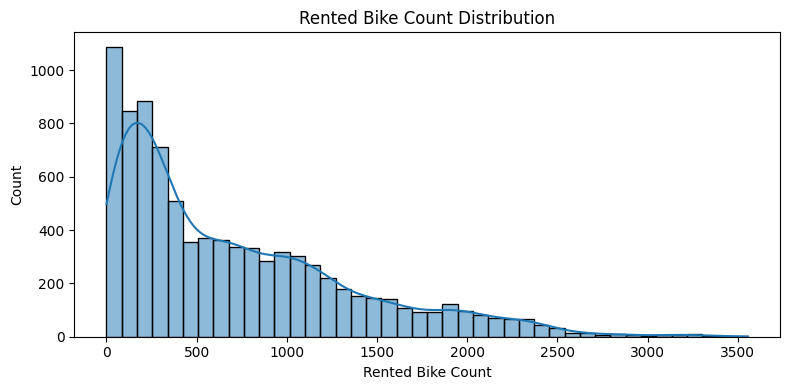

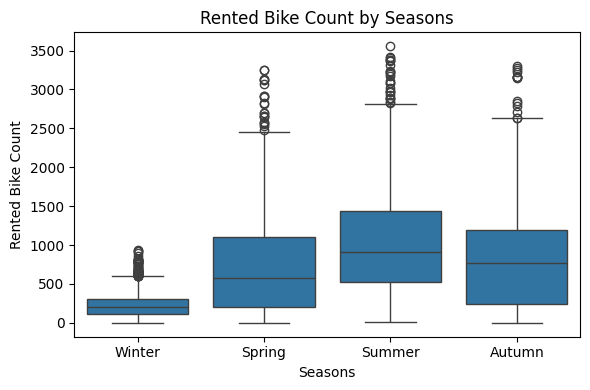

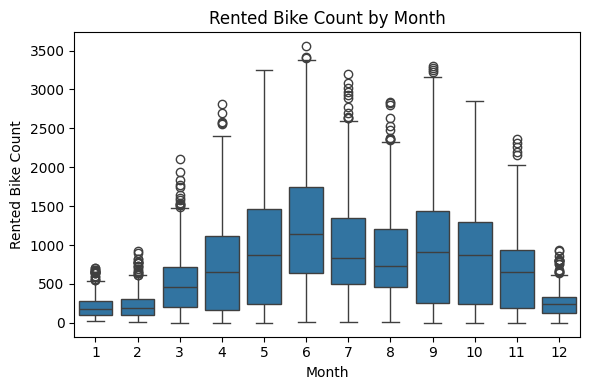

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\795746742.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


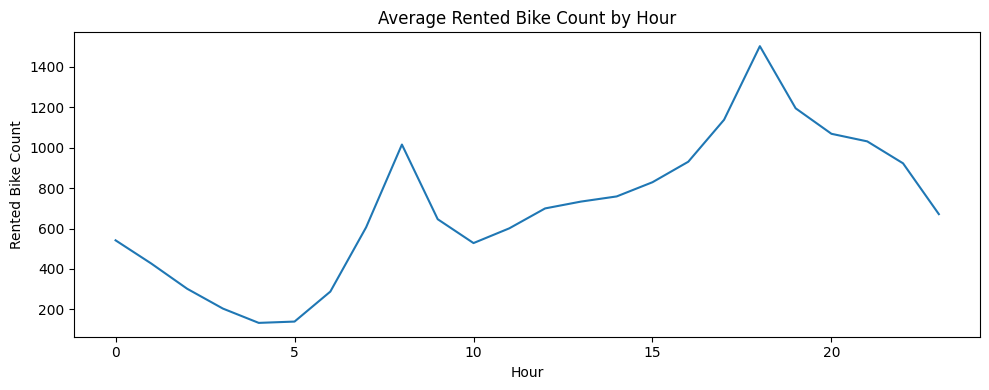

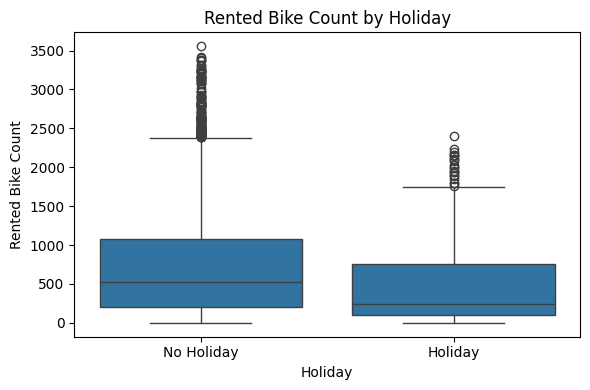

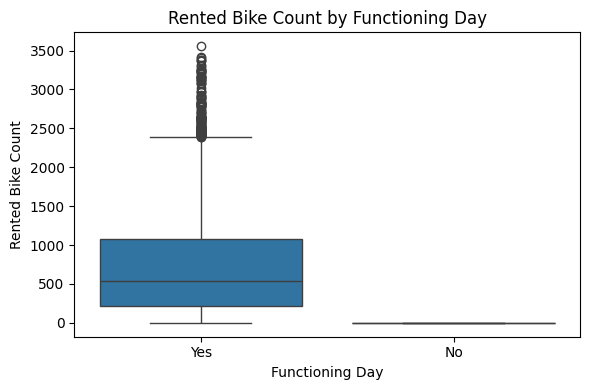

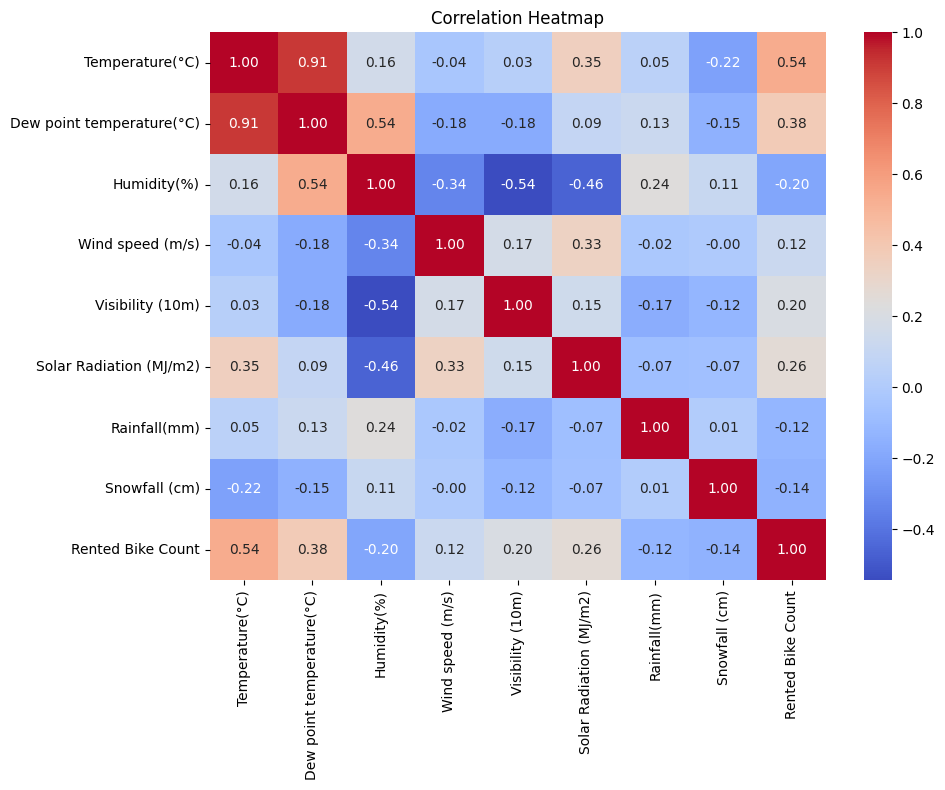

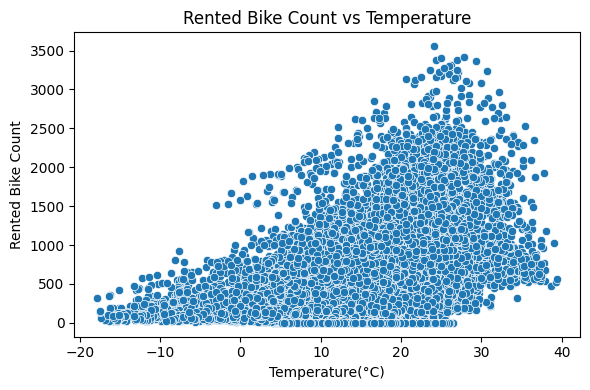

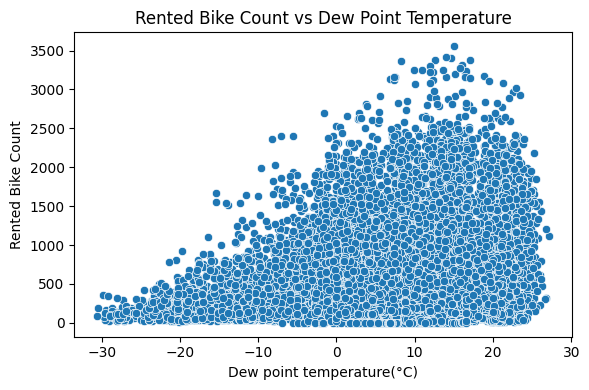

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\795746742.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


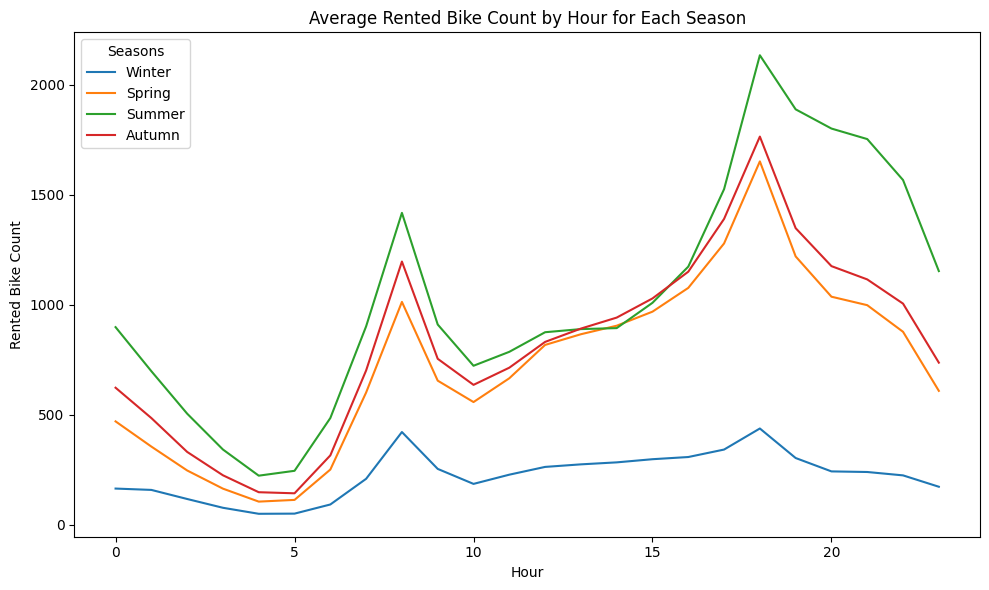

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 30), features: 30
Simple Deep LSTM: input_dim=30, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.3916 | val 0.3833
Epoch 2/100: train 0.2130 | val 0.2821
Epoch 3/100: train 0.1716 | val 0.2864
Epoch 4/100: train 0.1506 | val 0.2338
Epoch 5/100: train 0.1324 | val 0.2827
Epoch 6/100: train 0.1212 | val 0.2378
Epoch 7/100: train 0.1168 | val 0.3253
Epoch 8/100: train 0.1064 | val 0.2724
Epoch 9/100: train 0.1012 | val 0.2875
Epoch 10/100: train 0.0910 | val 0.2396
Epoch 11/100: train 0.0846 | val 0.2376
Epoch 12/100: train 0.0806 | val 0.2460
Epoch 13/100: train 0.0706 | val 0.2657
Epoch 14/100: train 0.0653 | val 0.2359
Early stopping at epoch 14

=== Simple Deep LSTM features + RandomForest TEST Results ===
Test MSE: 76396.1316
Test RMSE: 276.3985
Test MAE: 185.6795
Test MAPE: 51.52%
Test SMAPE: 49.75%
Test R2: 0.7954


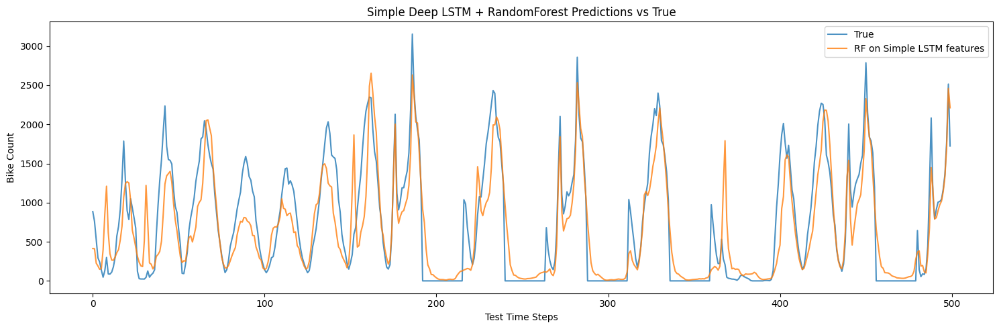

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 30
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):
        X_seq.append(X[i:i + seq_len])
        y_seq.append(y[i + seq_len])
    return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

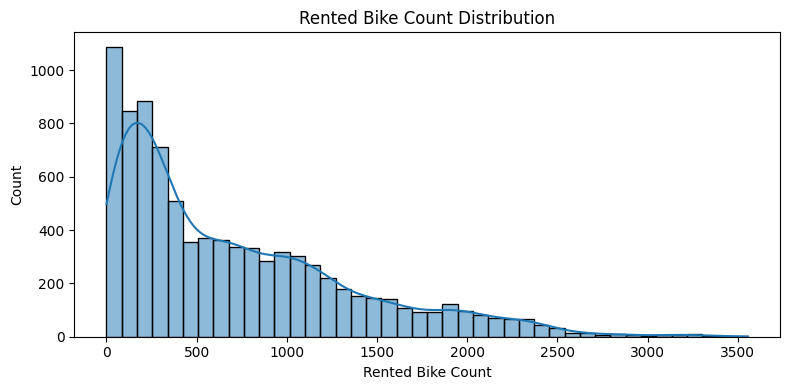

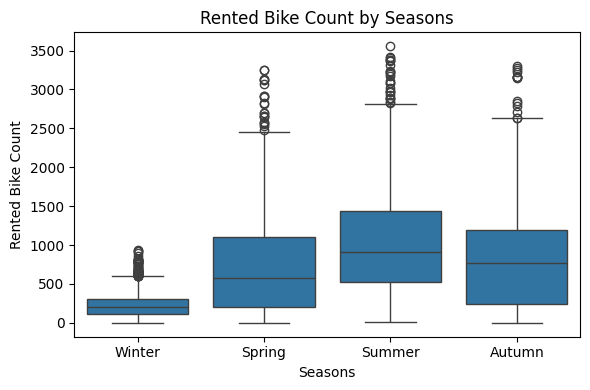

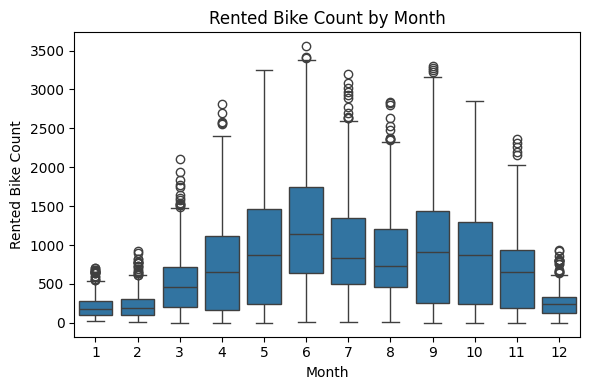

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\1077485668.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


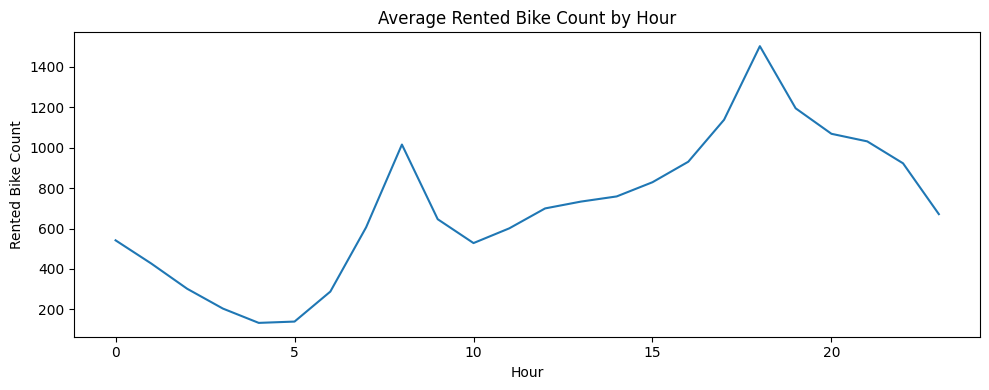

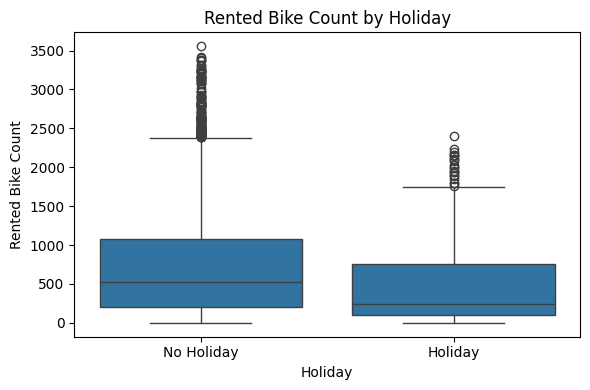

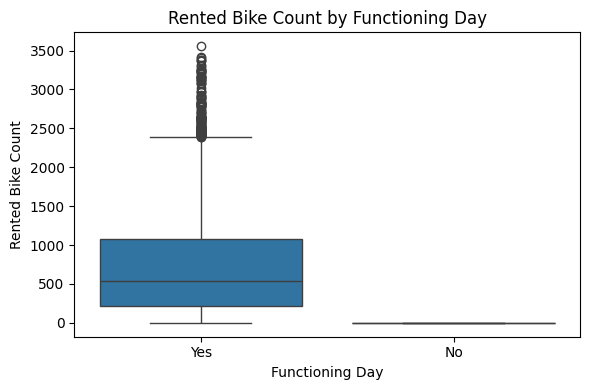

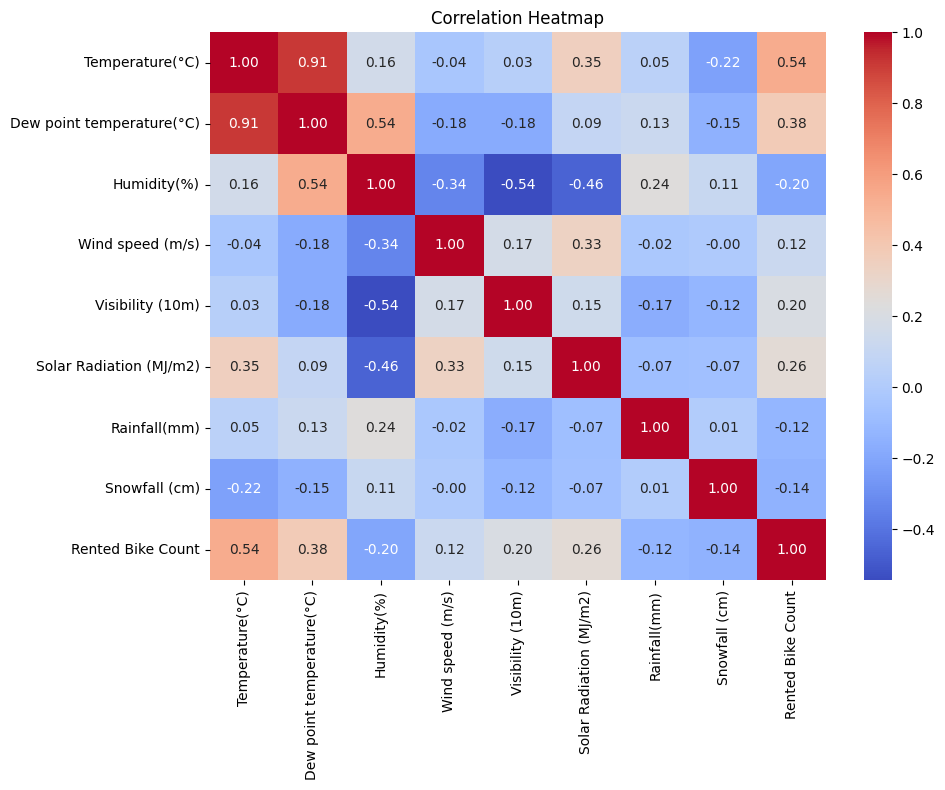

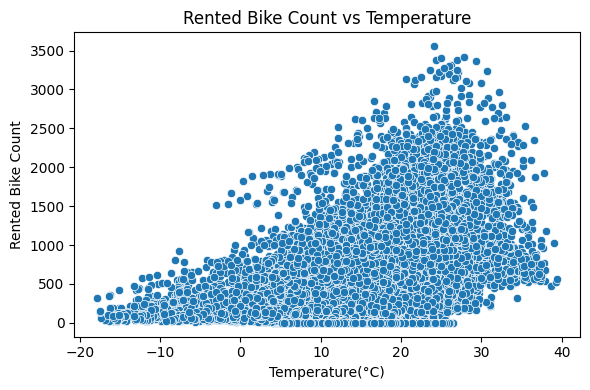

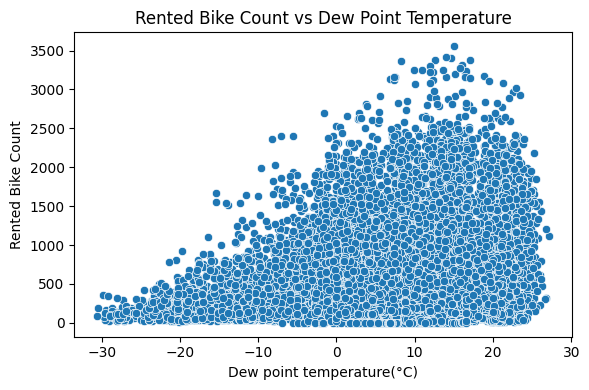

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\1077485668.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


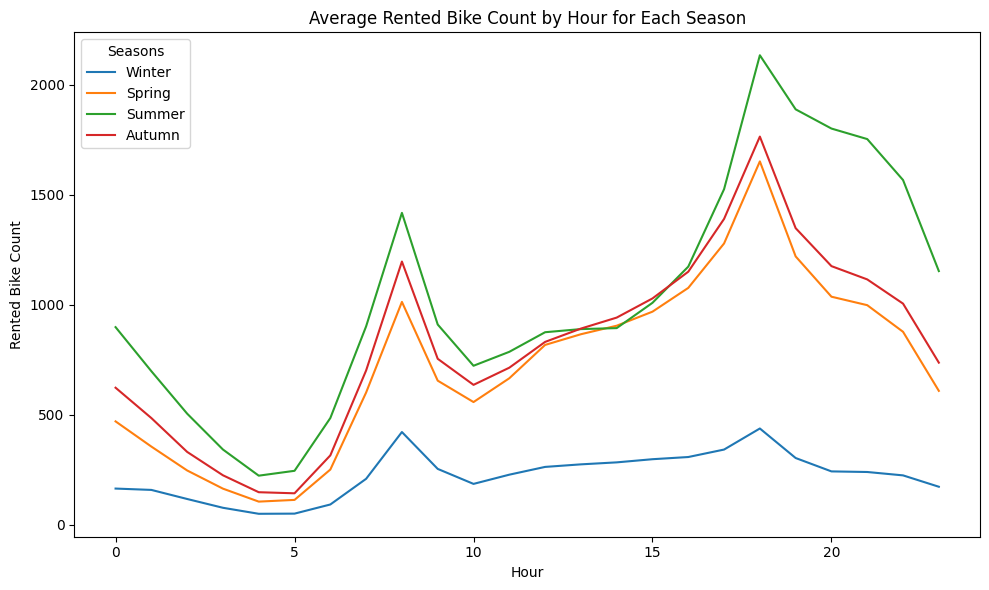

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15
Simple Deep LSTM: input_dim=15, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4053 | val 0.3857
Epoch 2/100: train 0.2166 | val 0.2796
Epoch 3/100: train 0.1730 | val 0.2063
Epoch 4/100: train 0.1489 | val 0.1784
Epoch 5/100: train 0.1359 | val 0.1559
Epoch 6/100: train 0.1167 | val 0.1726
Epoch 7/100: train 0.1022 | val 0.1385
Epoch 8/100: train 0.0901 | val 0.1056
Epoch 9/100: train 0.0706 | val 0.0819
Epoch 10/100: train 0.0593 | val 0.0709
Epoch 11/100: train 0.0543 | val 0.0649
Epoch 12/100: train 0.0497 | val 0.0629
Epoch 13/100: train 0.0445 | val 0.0607
Epoch 14/100: train 0.0426 | val 0.0549
Epoch 15/100: train 0.0399 | val 0.0573
Epoch 16/100: train 0.0397 | val 0.0515
Epoch 17/100: train 0.0368 | val 0.0522
Epoch 18/100: train 0.0380 | val 0.0510
Epoch 19/100: train 0.0371 | val 0.0517
Epoch 20/100: train 0.0343 | val 0.0480
Epoch 21/100: train 0.0338 | val 0.0464
Epoch 22/100: train 0.0325 | val 0.0476
Epoch 23/100: train 0.0331 | val 0.0523
Epoch 24/100: train 0.0331 | val 0.0531
Epoch 25/100: train 0.0319 | val 0.0454
Epoch 26/

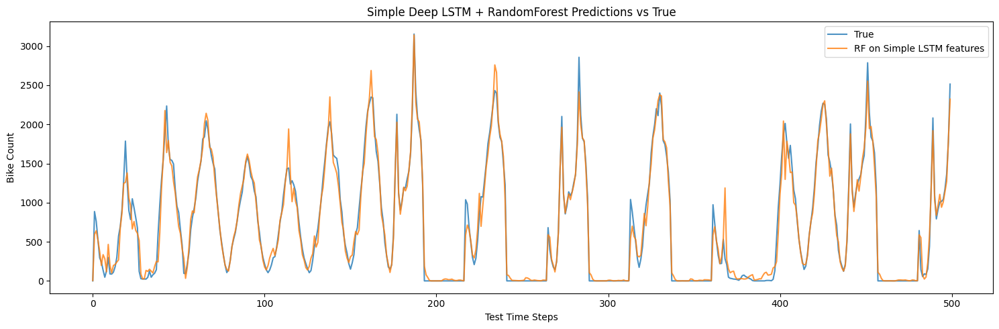

In [7]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    
    # NEW interaction features (AFTER hour_sin exists)
    df['temp_humidity_interaction'] = df['Temperature(°C)'] * df['Humidity(%)'] / 100
    df['wind_rain_interaction'] = df['Wind speed (m/s)'] * df['Rainfall(mm)']
    df['hour_temp_interaction'] = df['hour_sin'] * df['Temperature(°C)']

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour','temp_humidity_interaction', 'wind_rain_interaction','hour_temp_interaction', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):
        X_seq.append(X[i:i + seq_len])
        y_seq.append(y[i + seq_len - 1])
    return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

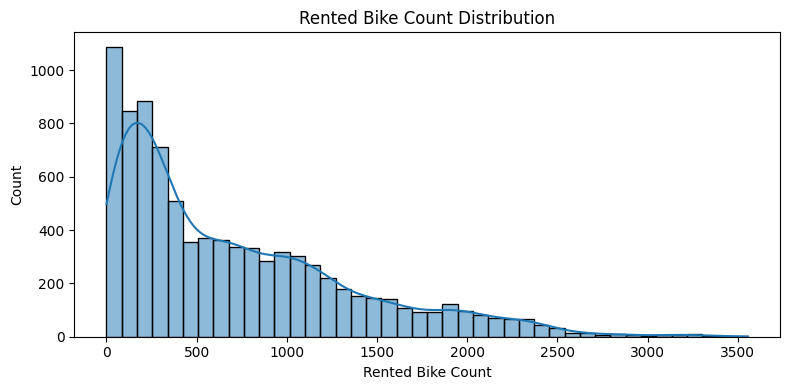

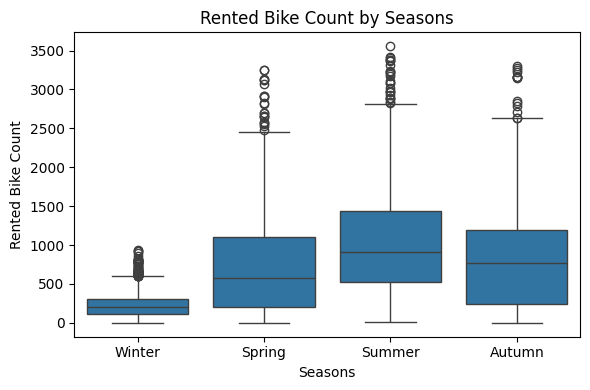

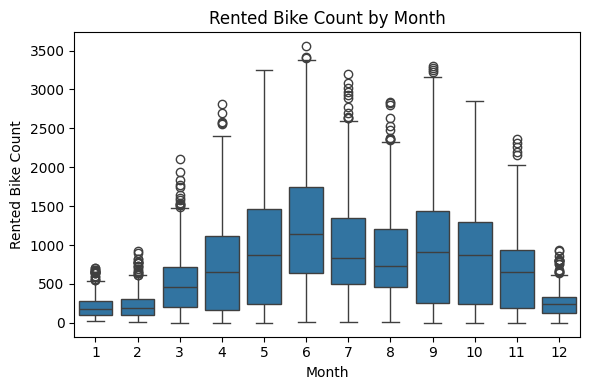

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\4089534462.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


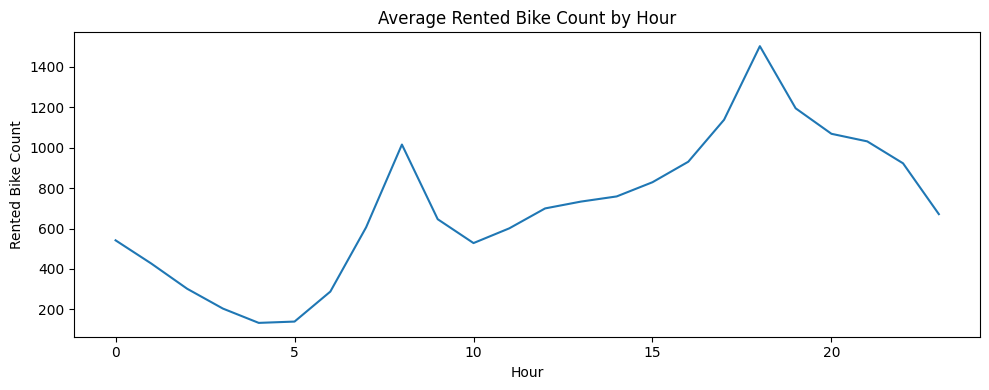

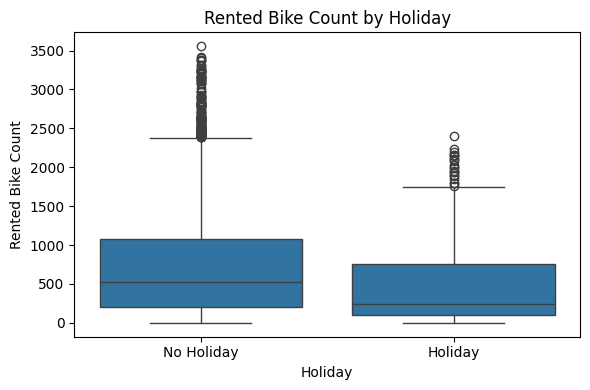

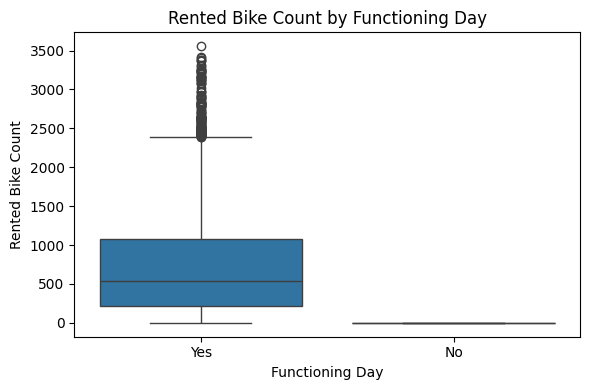

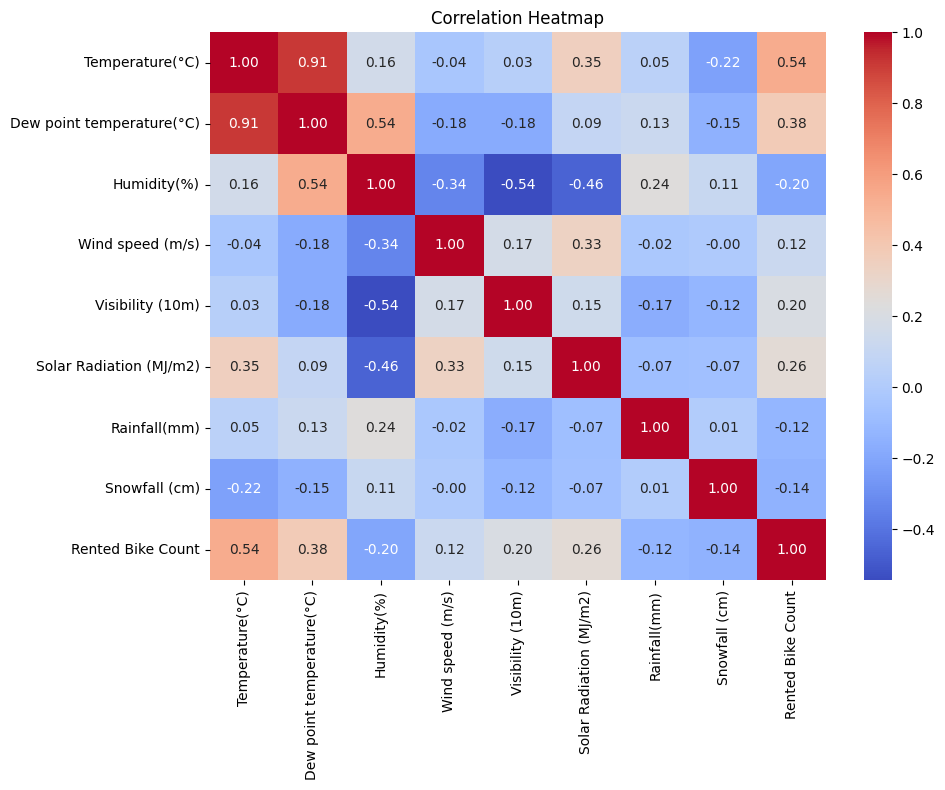

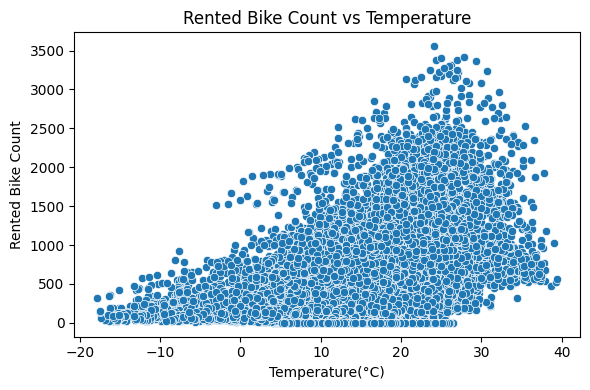

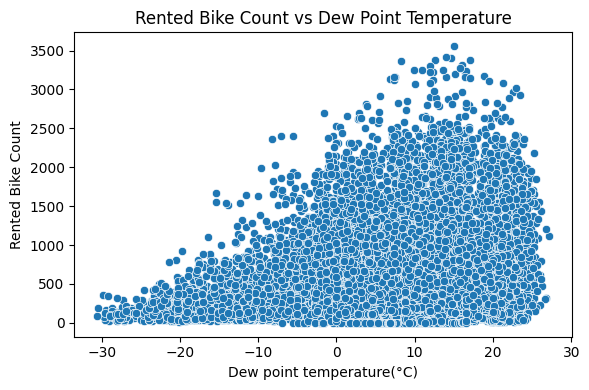

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\4089534462.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


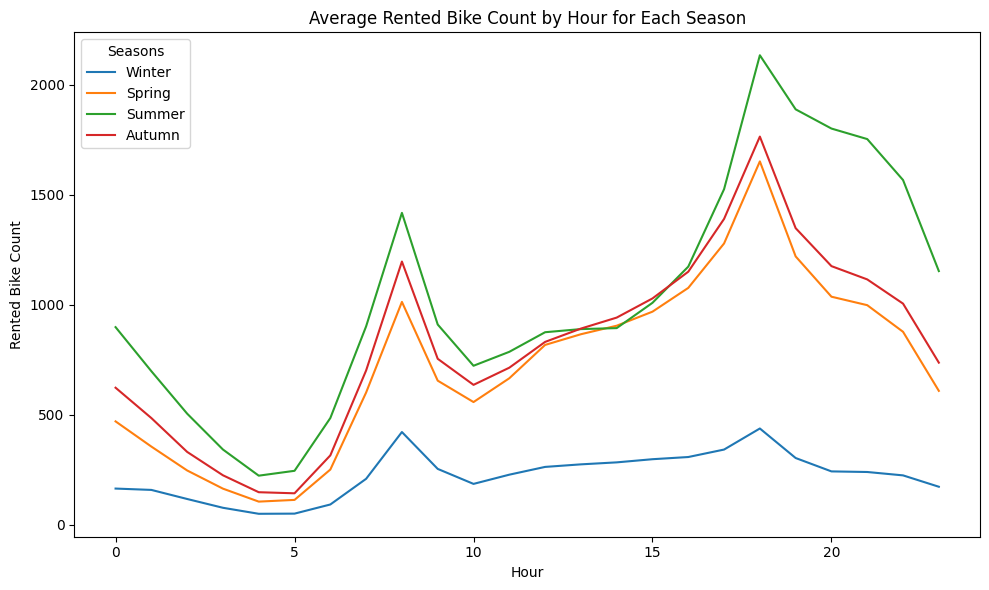

Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15
Simple Deep LSTM: input_dim=15, hidden=[256,128,64]


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4065 | val 0.4469
Epoch 2/100: train 0.2330 | val 0.3239
Epoch 3/100: train 0.1994 | val 0.2514
Epoch 4/100: train 0.1732 | val 0.2387
Epoch 5/100: train 0.1600 | val 0.3098
Epoch 6/100: train 0.1510 | val 0.2516
Epoch 7/100: train 0.1424 | val 0.2210
Epoch 8/100: train 0.1302 | val 0.2216
Epoch 9/100: train 0.1253 | val 0.1950
Epoch 10/100: train 0.1174 | val 0.1917
Epoch 11/100: train 0.1096 | val 0.1847
Epoch 12/100: train 0.0988 | val 0.1632
Epoch 13/100: train 0.0924 | val 0.1768
Epoch 14/100: train 0.0871 | val 0.1416
Epoch 15/100: train 0.0829 | val 0.1397
Epoch 16/100: train 0.0770 | val 0.1374
Epoch 17/100: train 0.0753 | val 0.1405
Epoch 18/100: train 0.0723 | val 0.1297
Epoch 19/100: train 0.0676 | val 0.1624
Epoch 20/100: train 0.0696 | val 0.1242
Epoch 21/100: train 0.0664 | val 0.1198
Epoch 22/100: train 0.0630 | val 0.1236
Epoch 23/100: train 0.0615 | val 0.1154
Epoch 24/100: train 0.0584 | val 0.1330
Epoch 25/100: train 0.0599 | val 0.1214
Epoch 26/

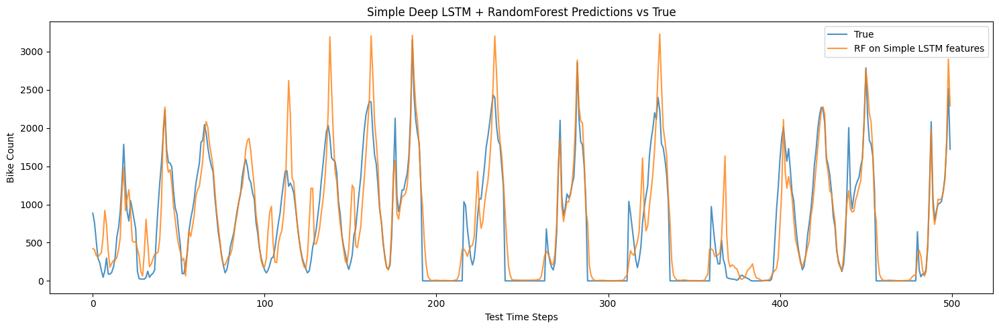

In [9]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]

# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

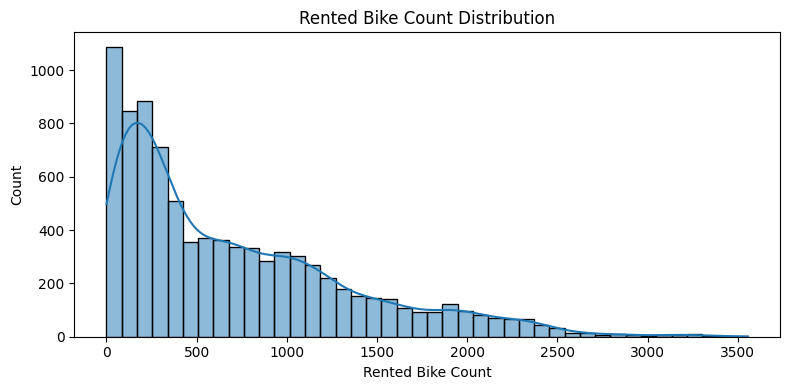

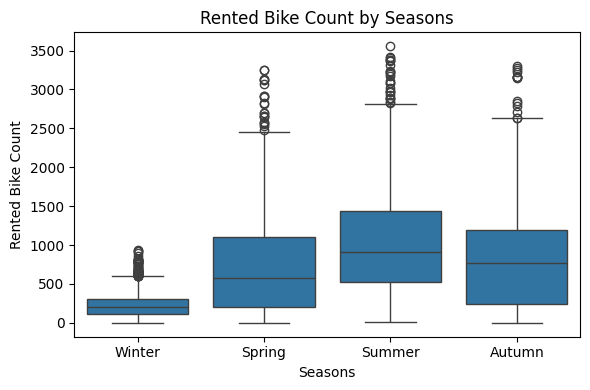

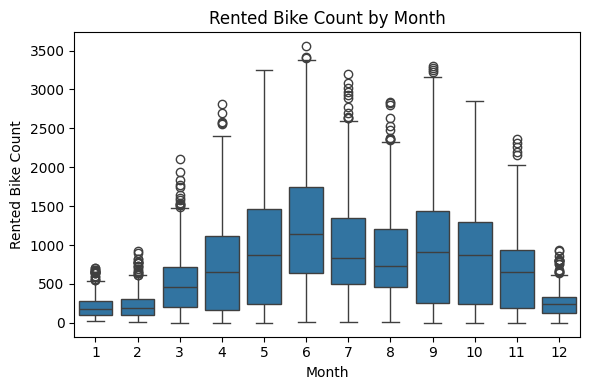

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\2337234968.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


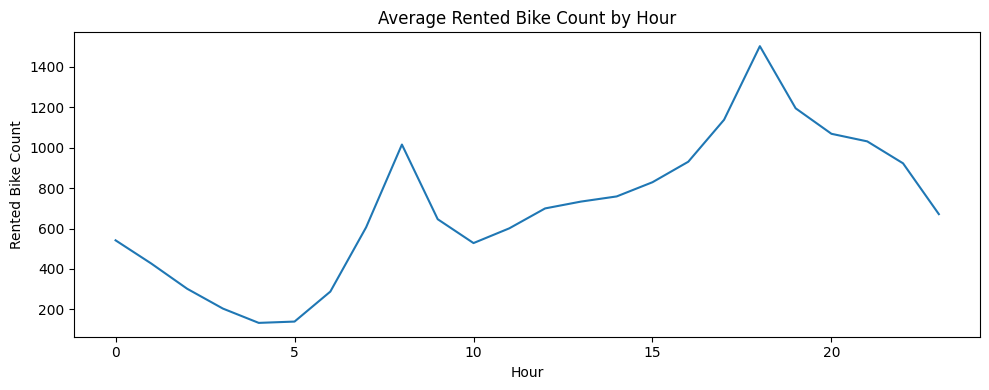

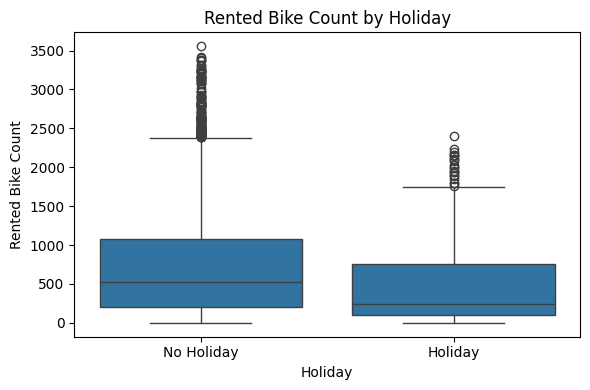

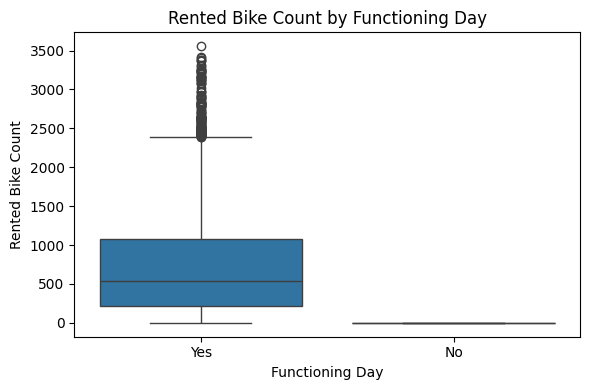

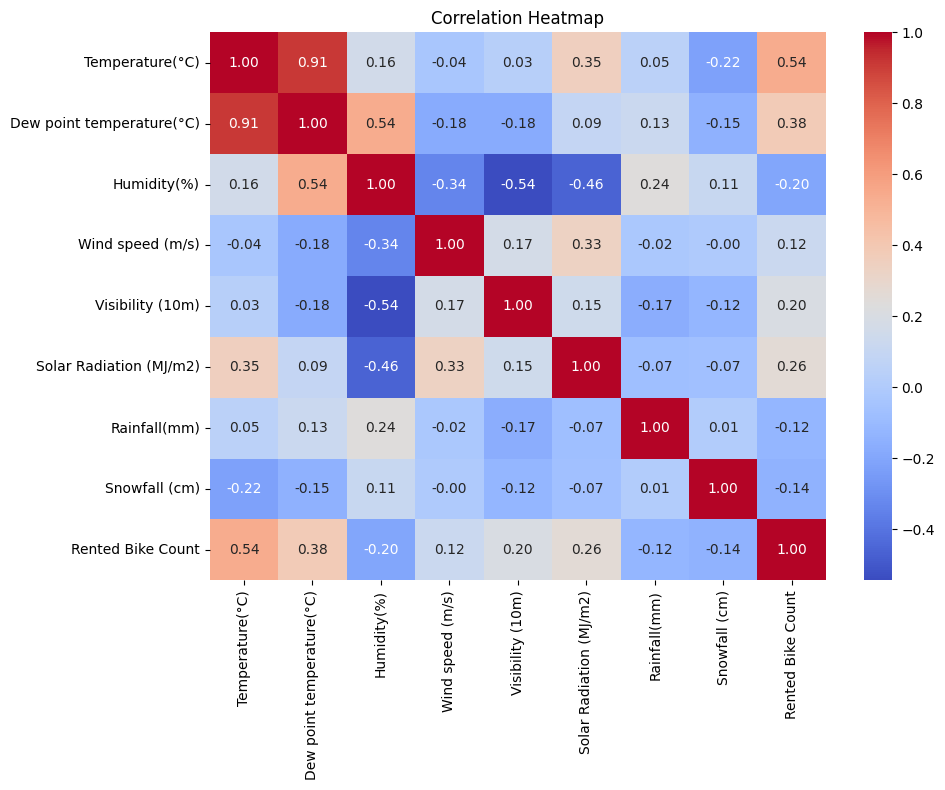

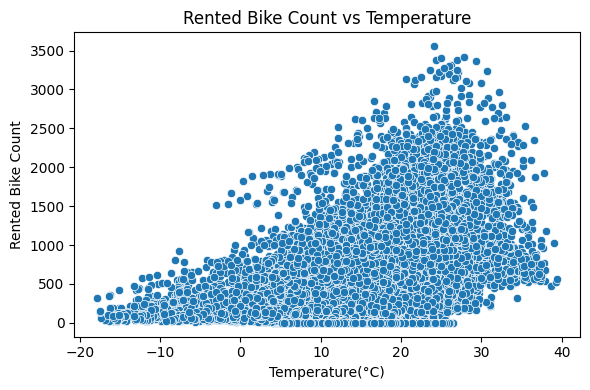

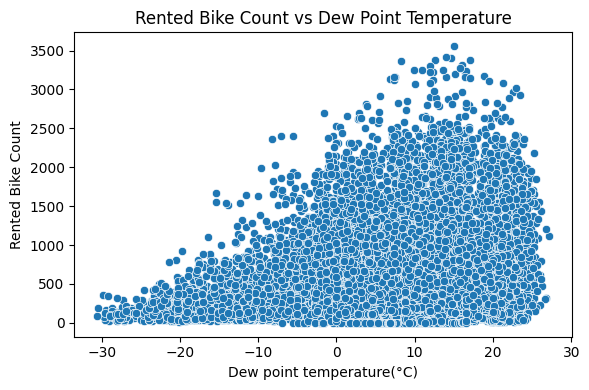

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\2337234968.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


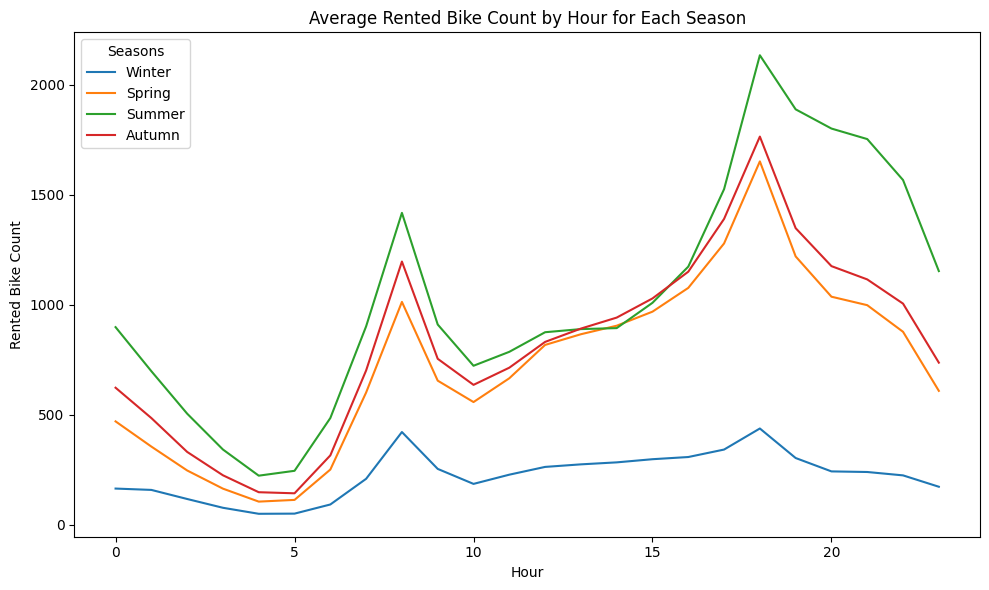

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4077 | val 0.3840
Epoch 2/100: train 0.2274 | val 0.3121
Epoch 3/100: train 0.1801 | val 0.2301
Epoch 4/100: train 0.1522 | val 0.1910
Epoch 5/100: train 0.1298 | val 0.1730
Epoch 6/100: train 0.1164 | val 0.1492
Epoch 7/100: train 0.0965 | val 0.1138
Epoch 8/100: train 0.0812 | val 0.1364
Epoch 9/100: train 0.0698 | val 0.0943
Epoch 10/100: train 0.0627 | val 0.0743
Epoch 11/100: train 0.0531 | val 0.0583
Epoch 12/100: train 0.0473 | val 0.0647
Epoch 13/100: train 0.0457 | val 0.0571
Epoch 14/100: train 0.0409 | val 0.0535
Epoch 15/100: train 0.0376 | val 0.0506
Epoch 16/100: train 0.0383 | val 0.0584
Epoch 17/100: train 0.0357 | val 0.0449
Epoch 18/100: train 0.0351 | val 0.0528
Epoch 19/100: train 0.0337 | val 0.0539
Epoch 20/100: train 0.0329 | val 0.0488
Epoch 21/100: train 0.0334 | val 0.0460
Epoch 22/100: train 0.0338 | val 0.0459
Epoch 23/100: train 0.0365 | val 0.0515
Epoch 24/100: train 0.0313 | val 0.0482
Epoch 25/100: train 0.0322 | val 0.0538
Epoch 26/

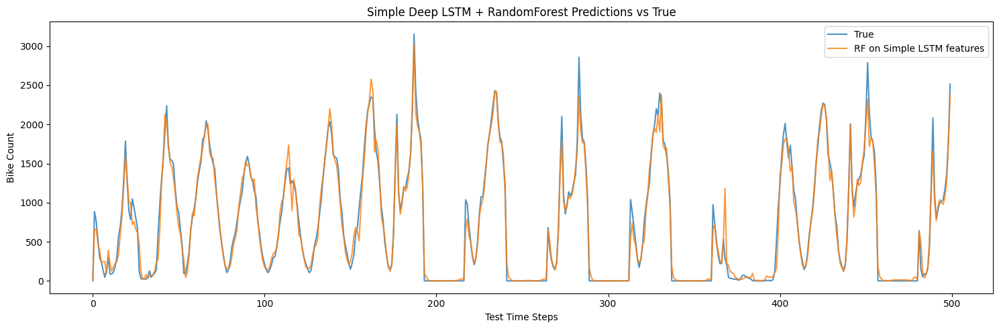

In [10]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):
        X_seq.append(X[i:i + seq_len])
        y_seq.append(y[i + seq_len - 1])
    return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):  
#         X_seq.append(X[i:i + seq_len])     # Up to t
#         y_seq.append(y[i + seq_len])       # Predict t+1
#     return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

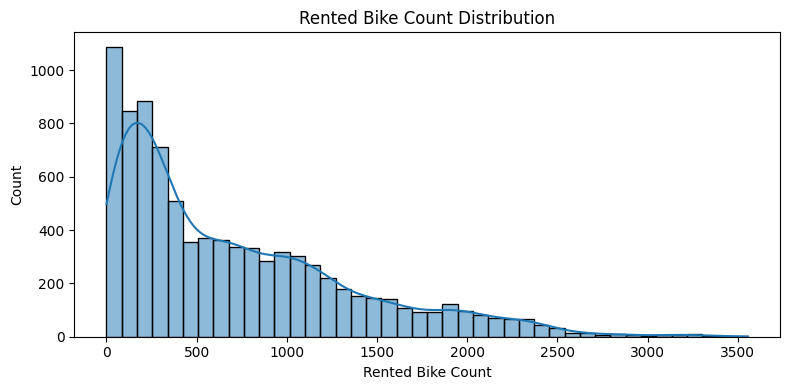

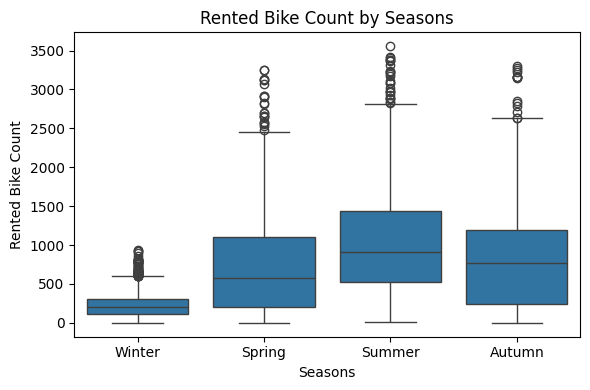

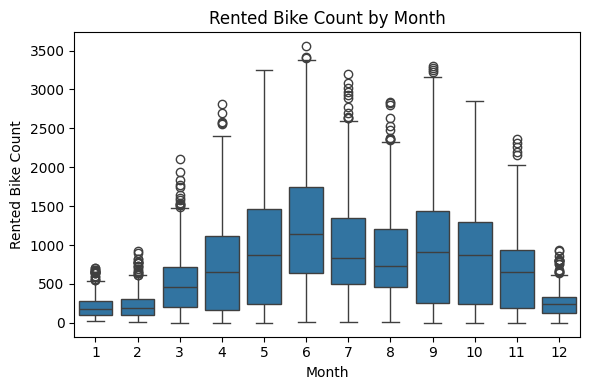

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\3138707929.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


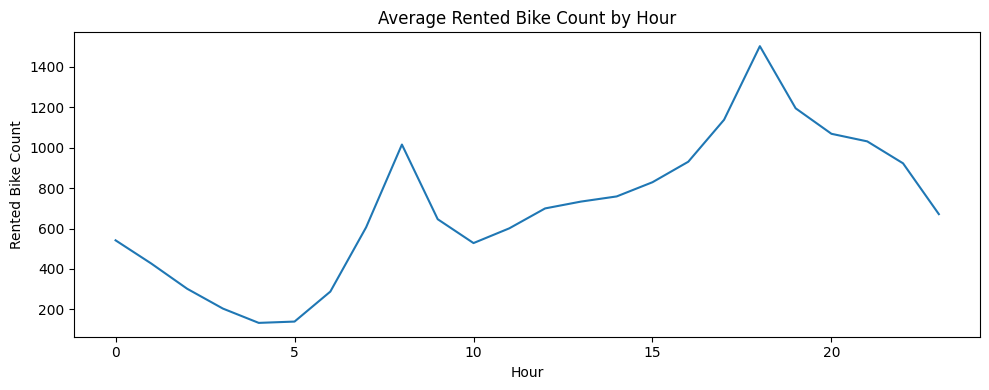

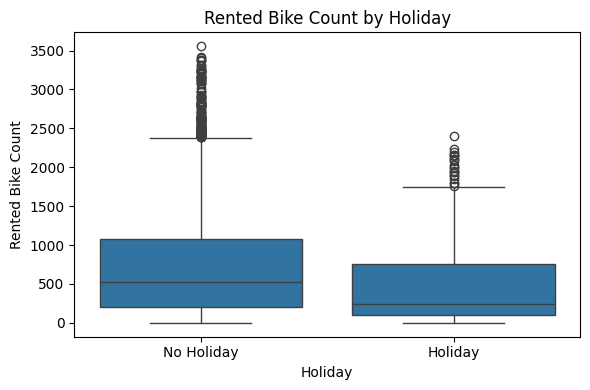

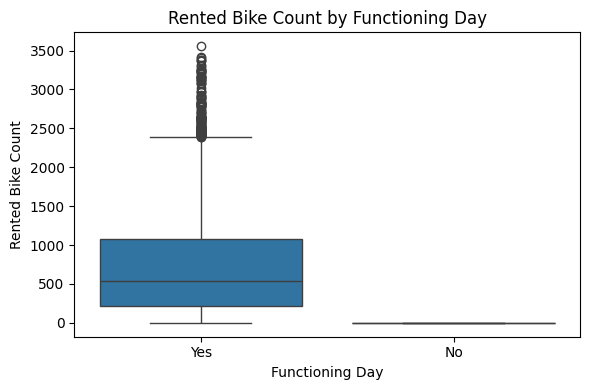

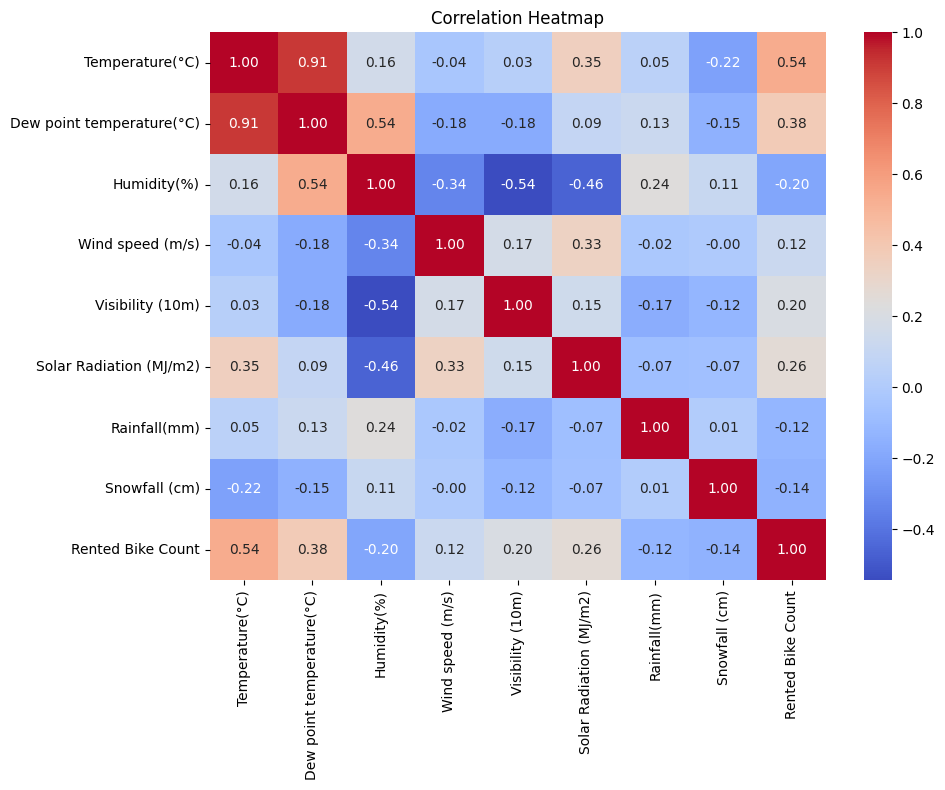

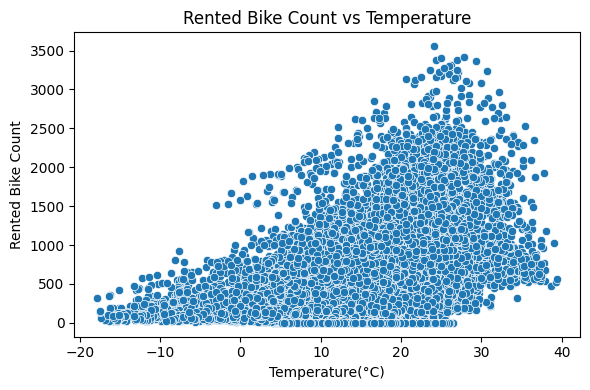

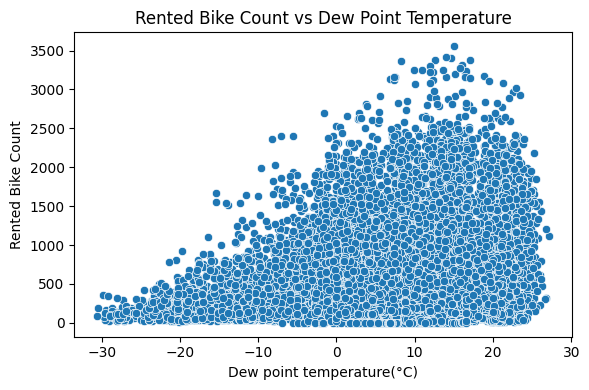

C:\Users\anavn\AppData\Local\Temp\ipykernel_28564\3138707929.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


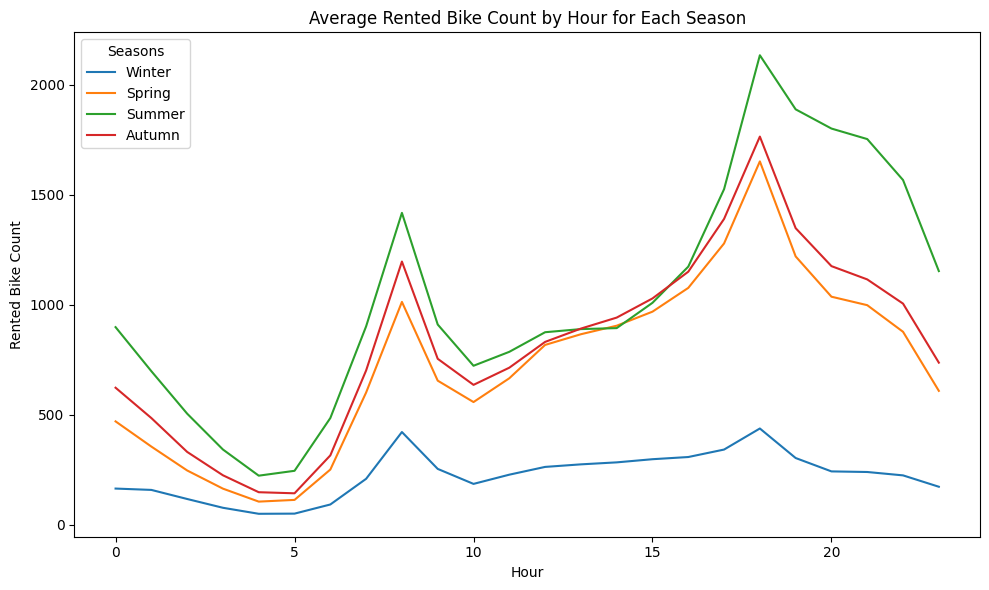

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4193 | val 0.4064
Epoch 2/100: train 0.2421 | val 0.3375
Epoch 3/100: train 0.2077 | val 0.2560
Epoch 4/100: train 0.1834 | val 0.2620
Epoch 5/100: train 0.1658 | val 0.2538
Epoch 6/100: train 0.1562 | val 0.2143
Epoch 7/100: train 0.1432 | val 0.2015
Epoch 8/100: train 0.1311 | val 0.2205
Epoch 9/100: train 0.1267 | val 0.1812
Epoch 10/100: train 0.1138 | val 0.1945
Epoch 11/100: train 0.1089 | val 0.1586
Epoch 12/100: train 0.0953 | val 0.1554
Epoch 13/100: train 0.0906 | val 0.1271
Epoch 14/100: train 0.0825 | val 0.1232
Epoch 15/100: train 0.0777 | val 0.1230
Epoch 16/100: train 0.0754 | val 0.1113
Epoch 17/100: train 0.0722 | val 0.1310
Epoch 18/100: train 0.0683 | val 0.1166
Epoch 19/100: train 0.0648 | val 0.1050
Epoch 20/100: train 0.0655 | val 0.1071
Epoch 21/100: train 0.0611 | val 0.1039
Epoch 22/100: train 0.0631 | val 0.1025
Epoch 23/100: train 0.0569 | val 0.0975
Epoch 24/100: train 0.0557 | val 0.1225
Epoch 25/100: train 0.0585 | val 0.0979
Epoch 26/

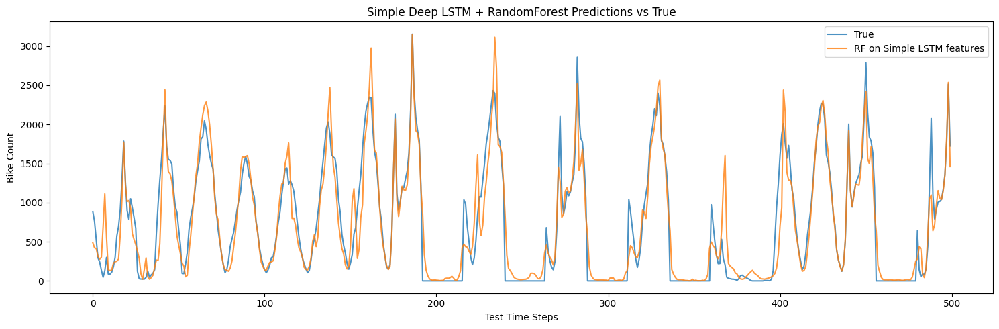

In [11]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=256, hidden_dim2=128, hidden_dim3=64, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


without xgboost

Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

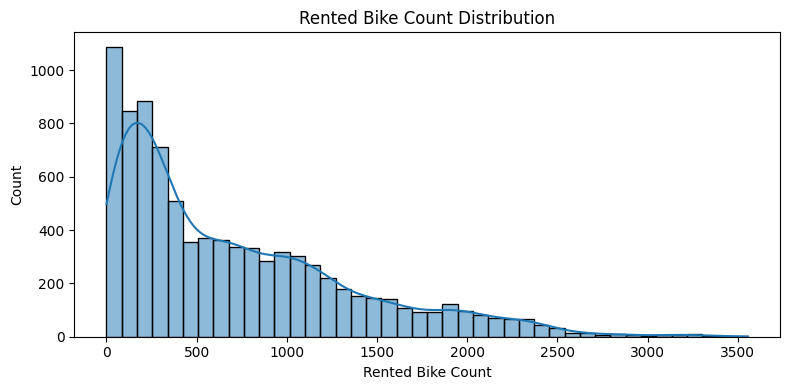

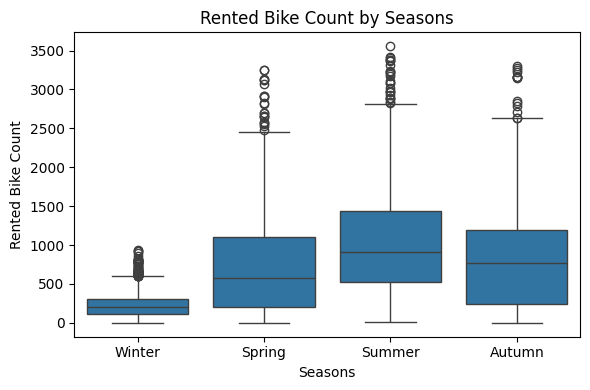

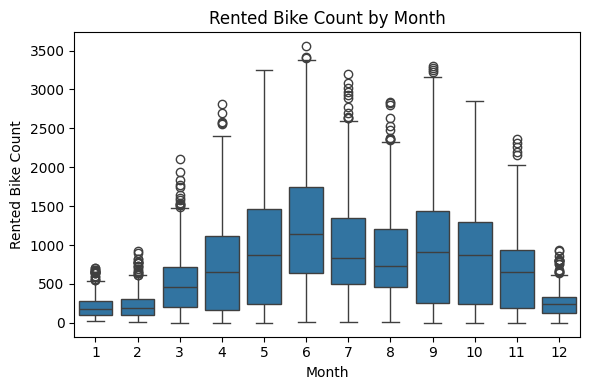

C:\Users\anavn\AppData\Local\Temp\ipykernel_24892\195713954.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


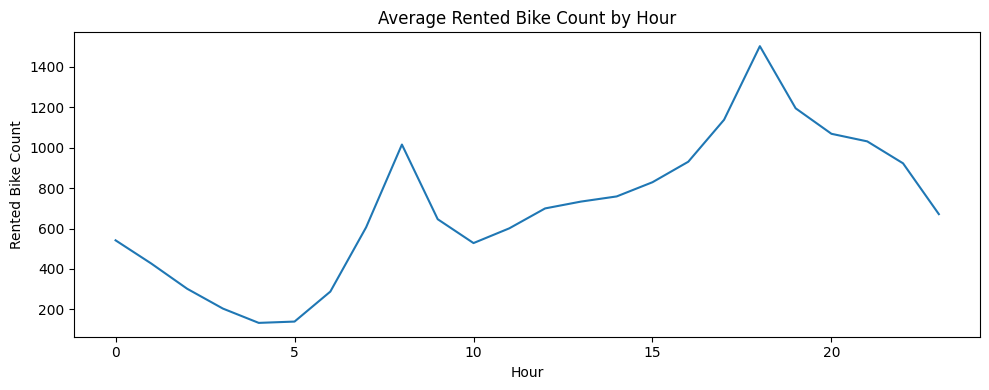

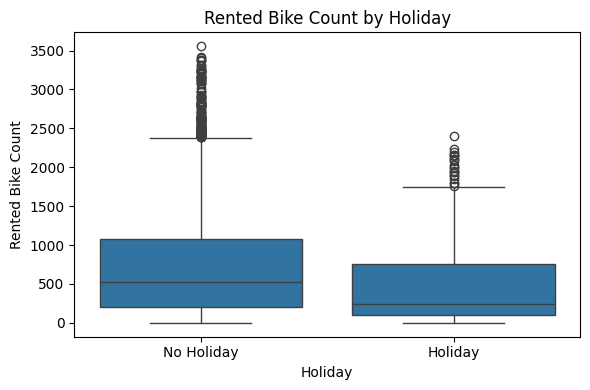

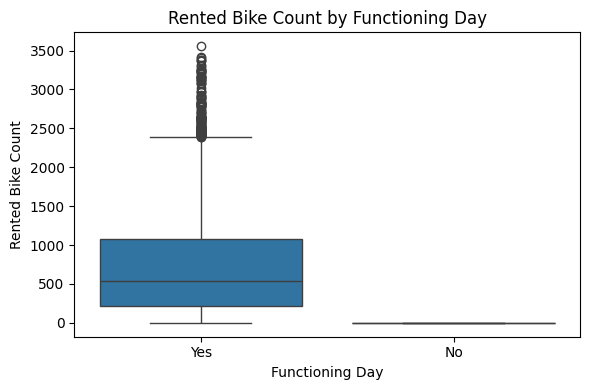

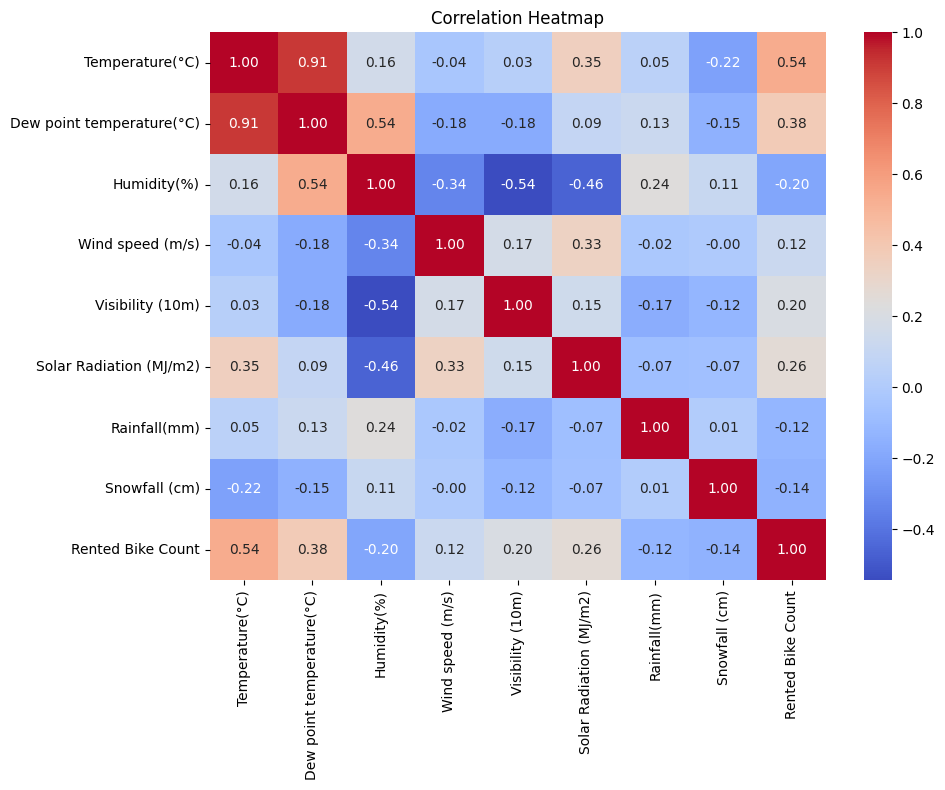

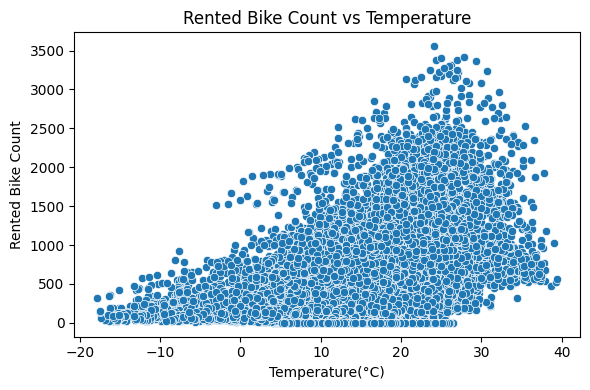

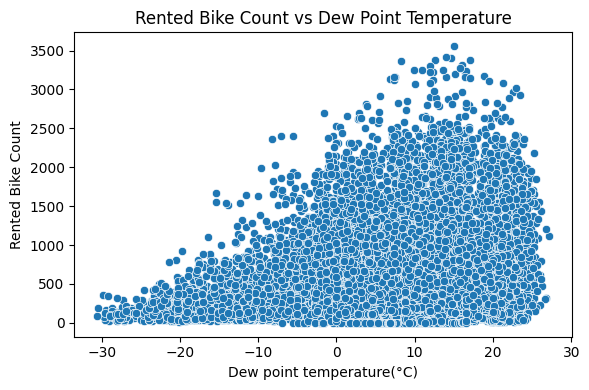

C:\Users\anavn\AppData\Local\Temp\ipykernel_24892\195713954.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


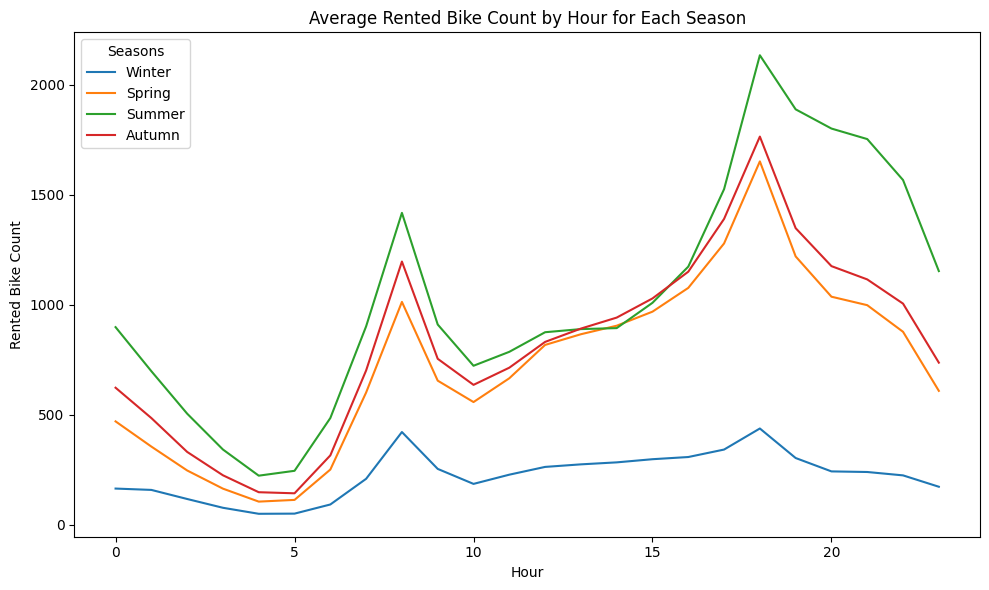

d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 28), features: 28
Epoch 1/100: train 0.5041 | val 0.4862
Epoch 2/100: train 0.2421 | val 0.3411
Epoch 3/100: train 0.1867 | val 0.2864
Epoch 4/100: train 0.1502 | val 0.2328
Epoch 5/100: train 0.1230 | val 0.2413
Epoch 6/100: train 0.1116 | val 0.2766
Epoch 7/100: train 0.1031 | val 0.2002
Epoch 8/100: train 0.0927 | val 0.1782
Epoch 9/100: train 0.0853 | val 0.1733
Epoch 10/100: train 0.0789 | val 0.1750
Epoch 11/100: train 0.0735 | val 0.1527
Epoch 12/100: train 0.0689 | val 0.1359
Epoch 13/100: train 0.0614 | val 0.1378
Epoch 14/100: train 0.0564 | val 0.1354
Epoch 15/100: train 0.0539 | val 0.1329
Epoch 16/100: train 0.0528 | val 0.1408
Epoch 17/100: train 0.0478 | val 0.1451
Epoch 18/100: train 0.0467 | val 0.1163
Epoch 19/100: train 0.0438 | val 0.1142
Epoch 20/100: train 0.0446 | val 0.1020
Epoch 21/100: train 0.0408 | val 0.0970
Epo

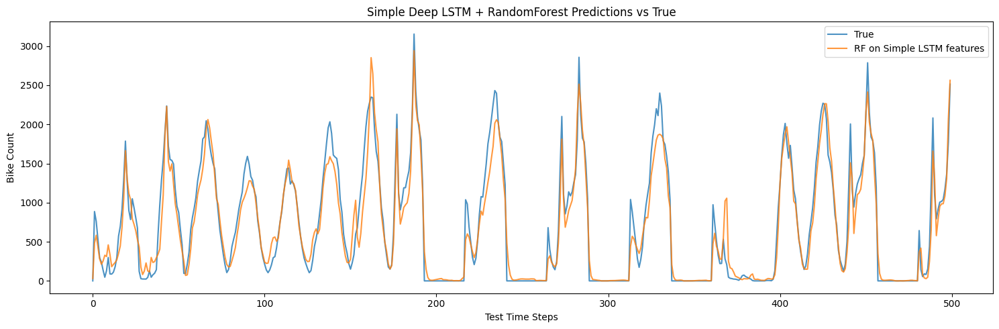

In [4]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42)
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)


scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len - 1])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

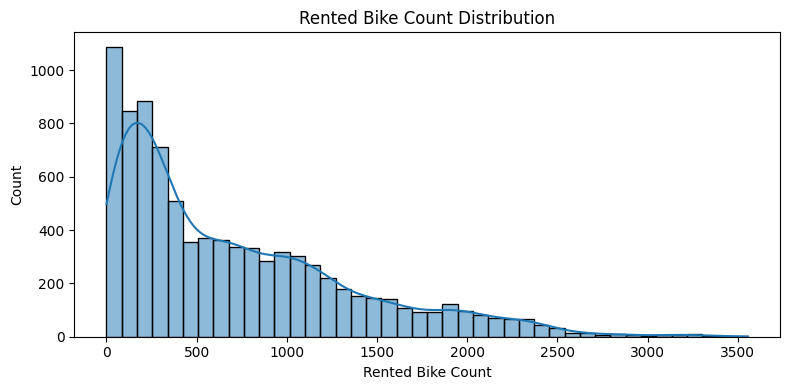

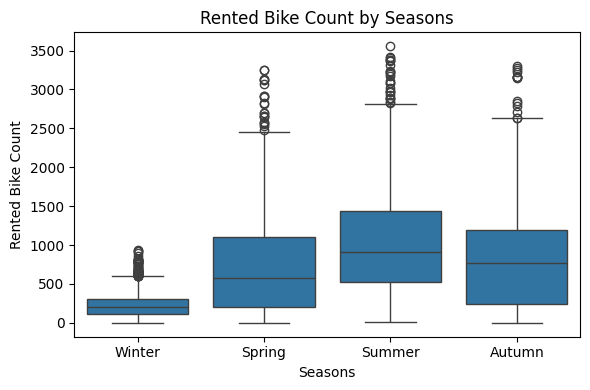

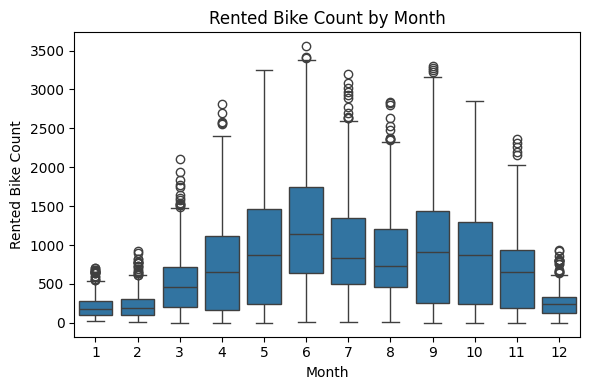

C:\Users\anavn\AppData\Local\Temp\ipykernel_24892\2748746048.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


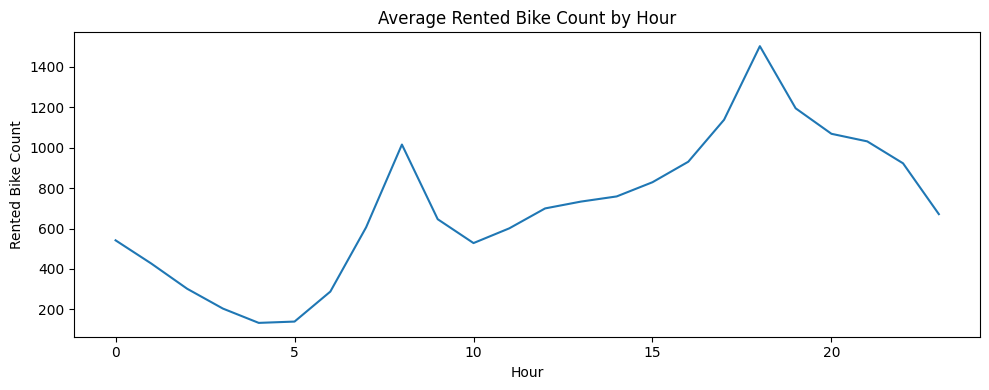

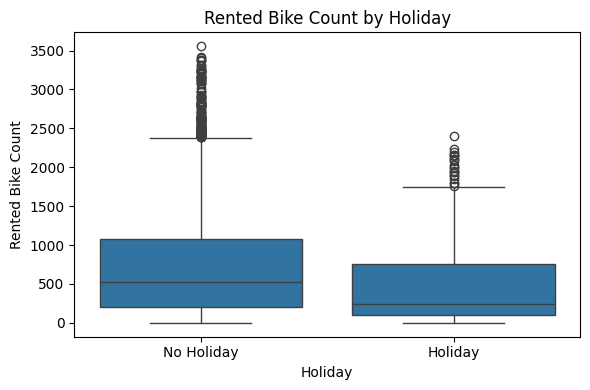

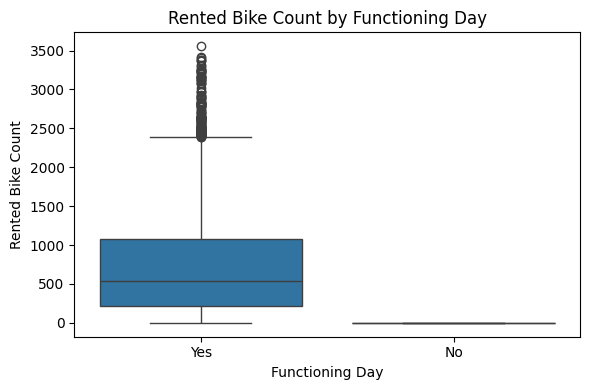

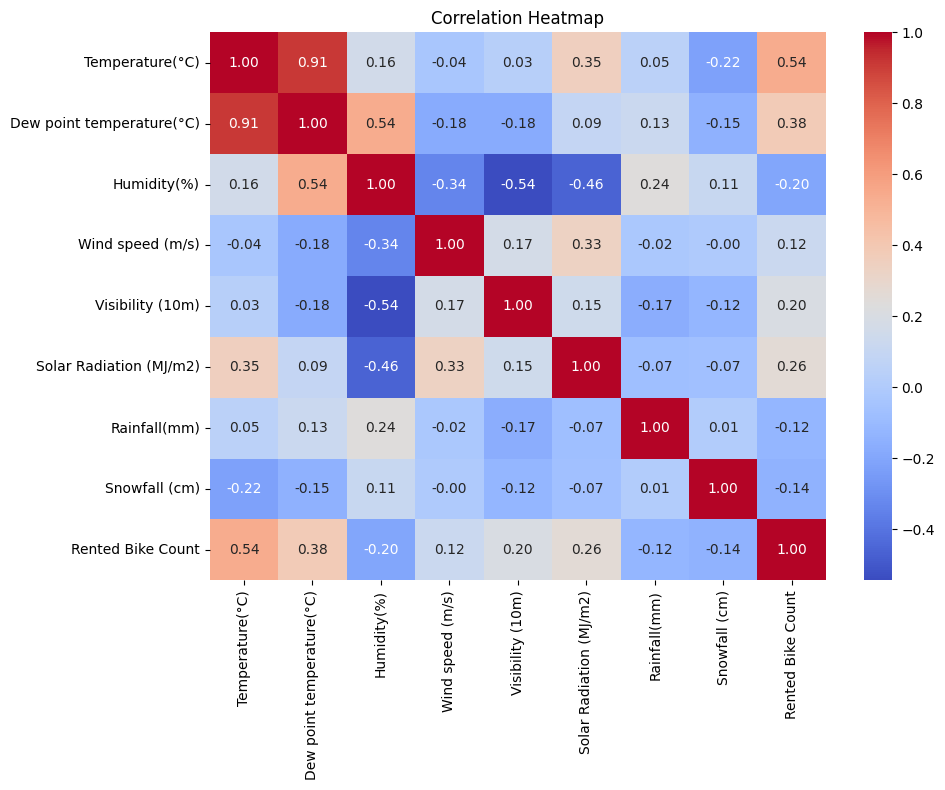

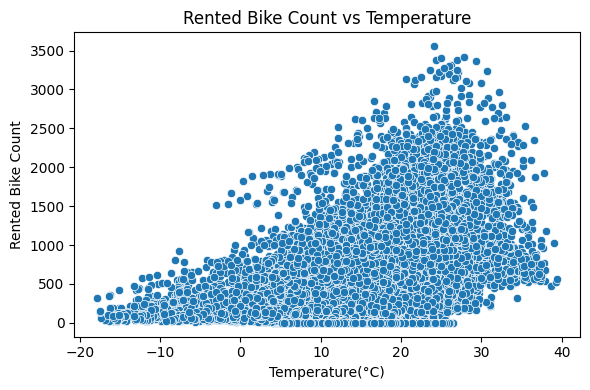

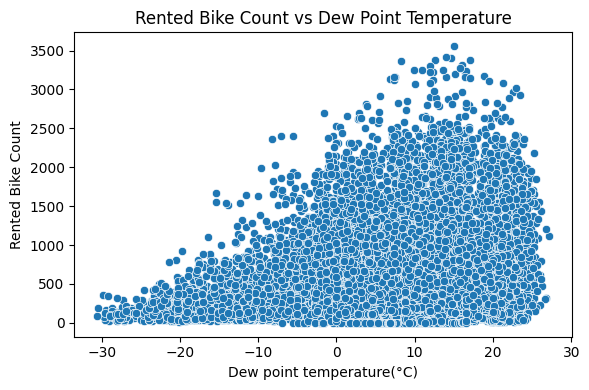

C:\Users\anavn\AppData\Local\Temp\ipykernel_24892\2748746048.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


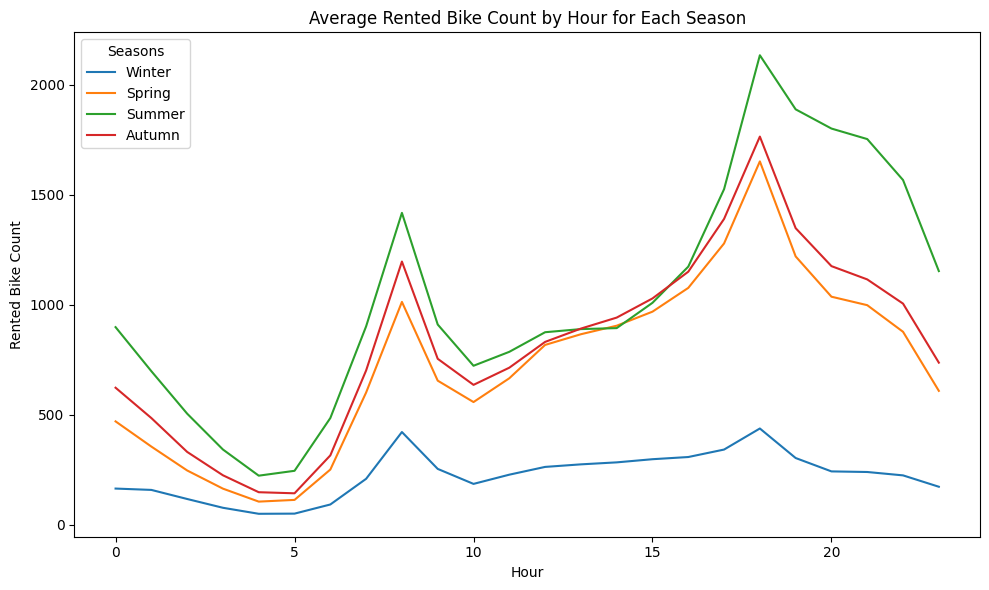

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 28), features: 28


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.5122 | val 0.4911
Epoch 2/100: train 0.2528 | val 0.3580
Epoch 3/100: train 0.2038 | val 0.3452
Epoch 4/100: train 0.1654 | val 0.3126
Epoch 5/100: train 0.1473 | val 0.2811
Epoch 6/100: train 0.1311 | val 0.2944
Epoch 7/100: train 0.1187 | val 0.2658
Epoch 8/100: train 0.1128 | val 0.2609
Epoch 9/100: train 0.1063 | val 0.2356
Epoch 10/100: train 0.1025 | val 0.2649
Epoch 11/100: train 0.0943 | val 0.2146
Epoch 12/100: train 0.0880 | val 0.2295
Epoch 13/100: train 0.0852 | val 0.2284
Epoch 14/100: train 0.0779 | val 0.2109
Epoch 15/100: train 0.0758 | val 0.2297
Epoch 16/100: train 0.0709 | val 0.2177
Epoch 17/100: train 0.0669 | val 0.1969
Epoch 18/100: train 0.0638 | val 0.2203
Epoch 19/100: train 0.0600 | val 0.1970
Epoch 20/100: train 0.0542 | val 0.1941
Epoch 21/100: train 0.0566 | val 0.1979
Epoch 22/100: train 0.0529 | val 0.1943
Epoch 23/100: train 0.0504 | val 0.2112
Epoch 24/100: train 0.0497 | val 0.1803
Epoch 25/100: train 0.0474 | val 0.1896
Epoch 26/

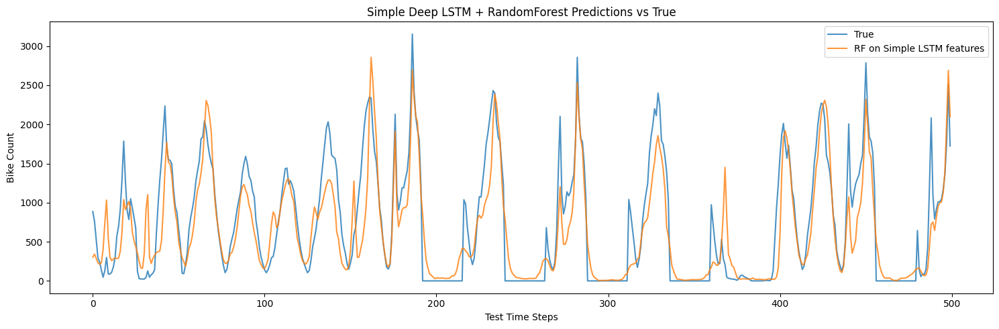

In [5]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42)
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)


scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


this is giving lesser accuracy

Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

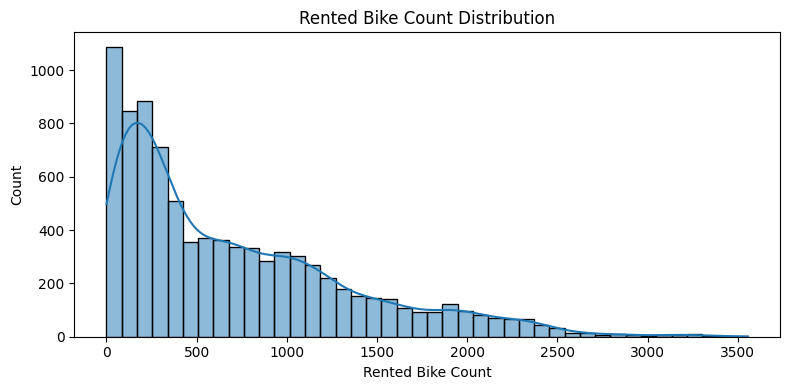

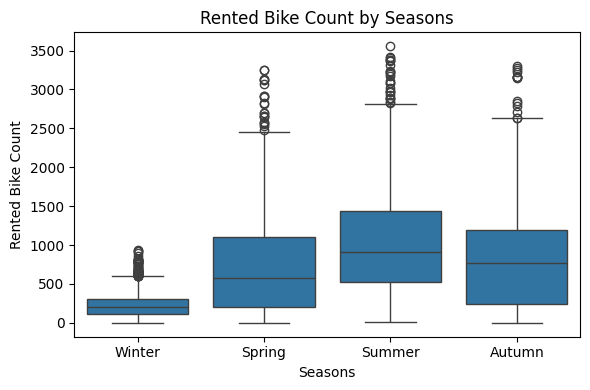

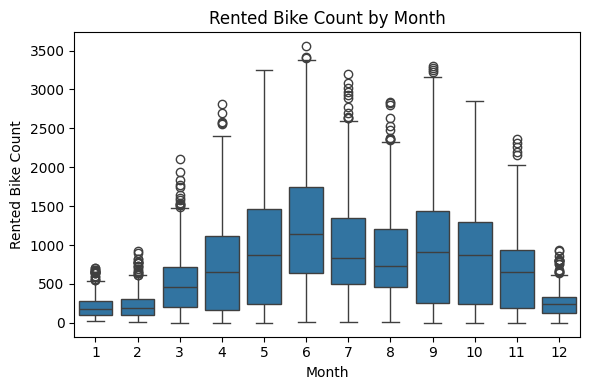

C:\Users\anavn\AppData\Local\Temp\ipykernel_24892\72823913.py:86: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


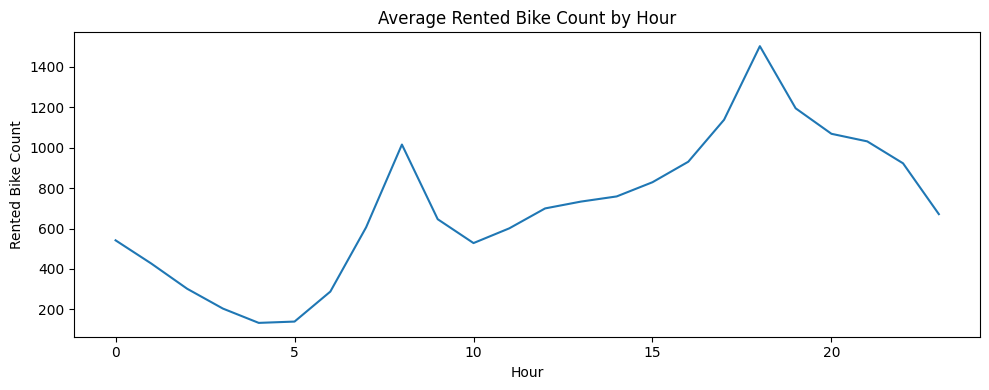

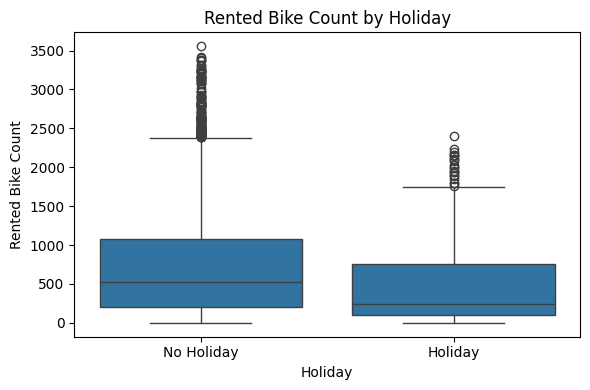

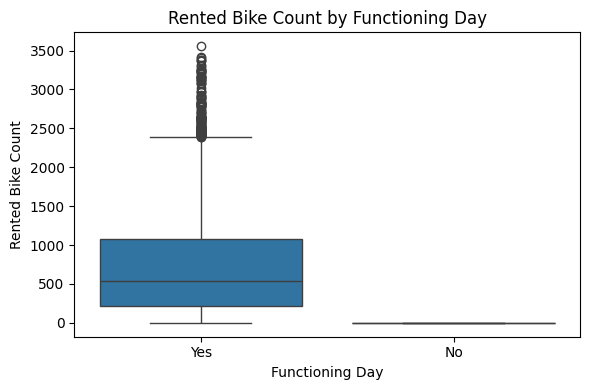

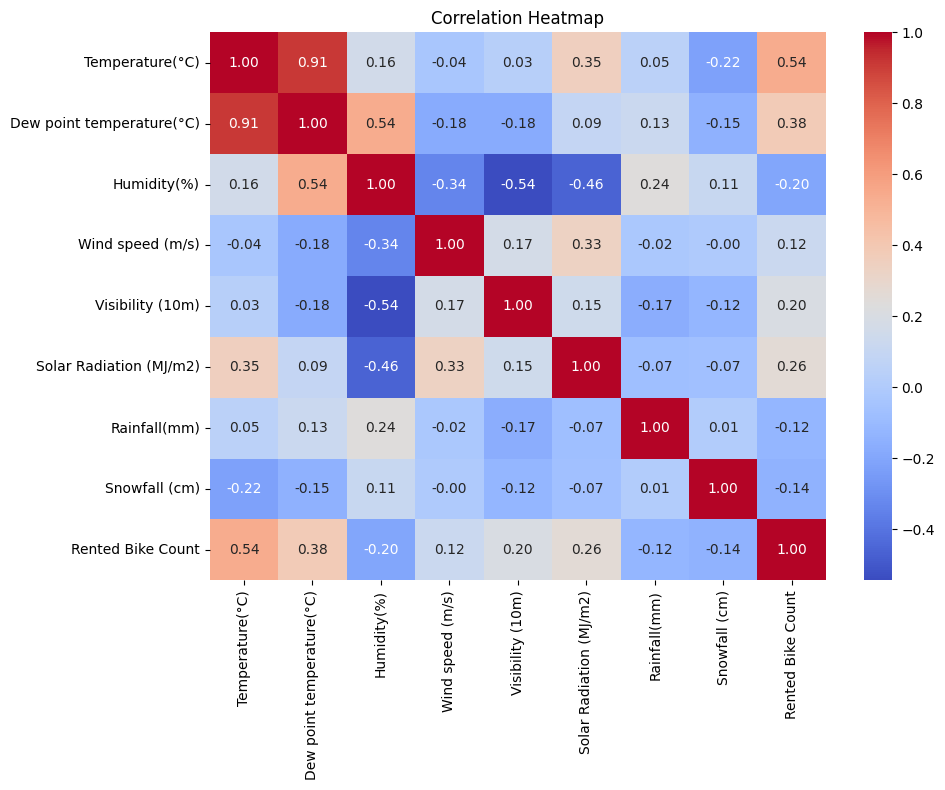

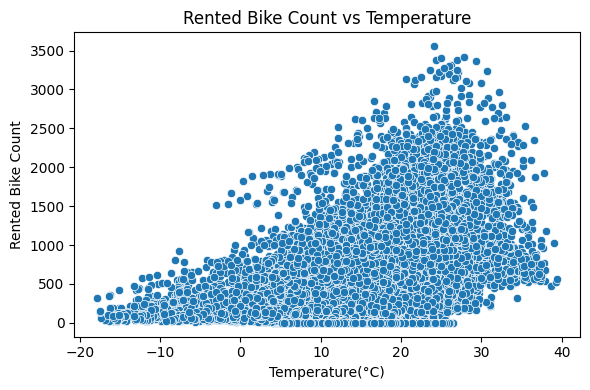

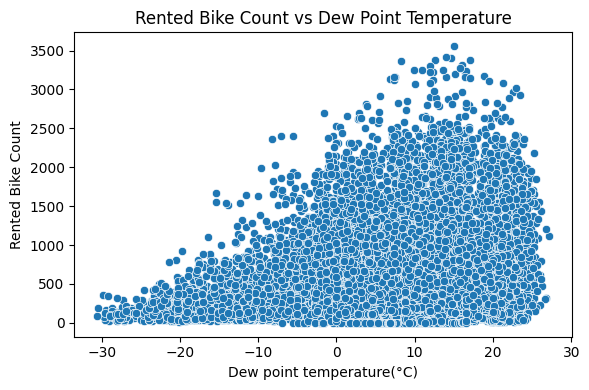

C:\Users\anavn\AppData\Local\Temp\ipykernel_24892\72823913.py:134: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


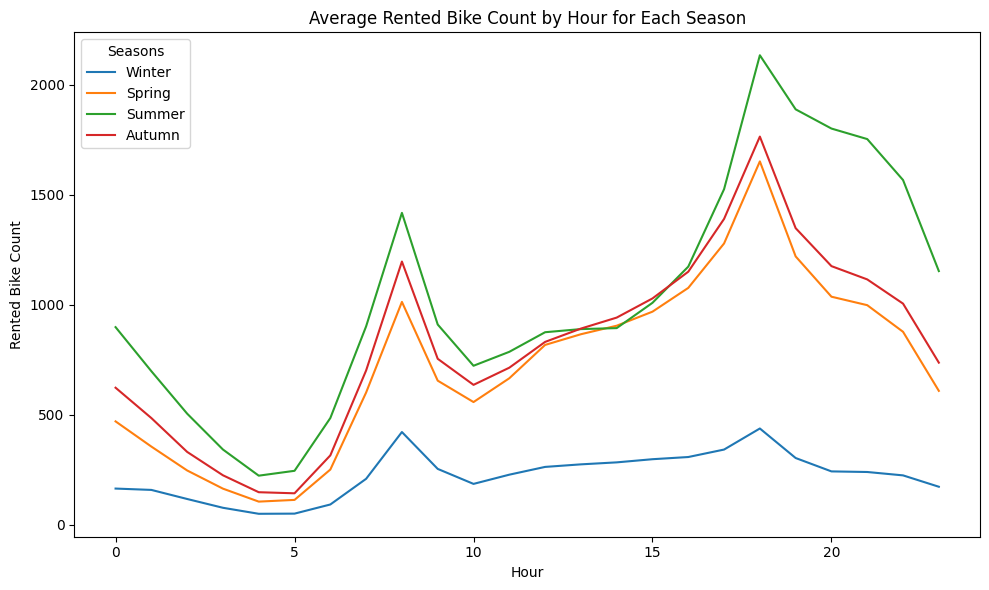

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.5257 | val 0.4905
Epoch 2/100: train 0.2697 | val 0.4113
Epoch 3/100: train 0.2326 | val 0.3193
Epoch 4/100: train 0.2065 | val 0.2880
Epoch 5/100: train 0.1889 | val 0.2553
Epoch 6/100: train 0.1759 | val 0.2556
Epoch 7/100: train 0.1661 | val 0.2173
Epoch 8/100: train 0.1564 | val 0.2167
Epoch 9/100: train 0.1454 | val 0.1963
Epoch 10/100: train 0.1351 | val 0.1835
Epoch 11/100: train 0.1312 | val 0.1824
Epoch 12/100: train 0.1247 | val 0.1783
Epoch 13/100: train 0.1160 | val 0.1814
Epoch 14/100: train 0.1134 | val 0.1676
Epoch 15/100: train 0.1088 | val 0.1772
Epoch 16/100: train 0.1043 | val 0.1685
Epoch 17/100: train 0.1006 | val 0.1513
Epoch 18/100: train 0.0945 | val 0.1511
Epoch 19/100: train 0.0897 | val 0.1540
Epoch 20/100: train 0.0906 | val 0.1353
Epoch 21/100: train 0.0811 | val 0.1413
Epoch 22/100: train 0.0798 | val 0.1397
Epoch 23/100: train 0.0792 | val 0.1252
Epoch 24/100: train 0.0761 | val 0.1588
Epoch 25/100: train 0.0759 | val 0.1124
Epoch 26/

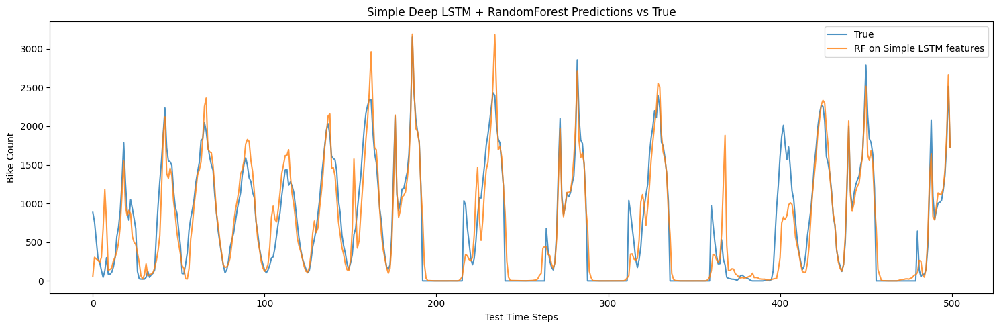

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
from xgboost import XGBRegressor
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42)
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

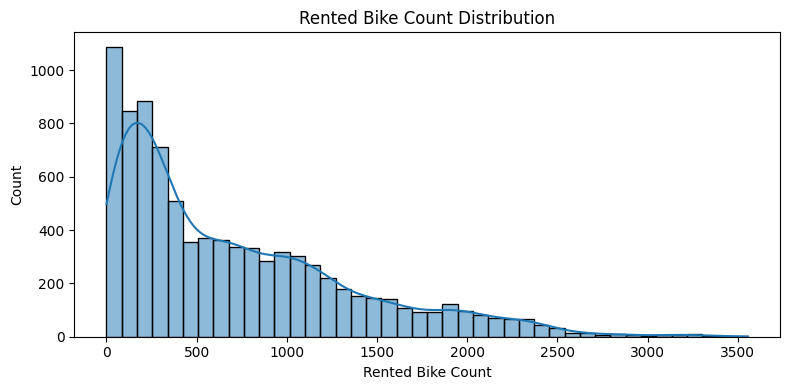

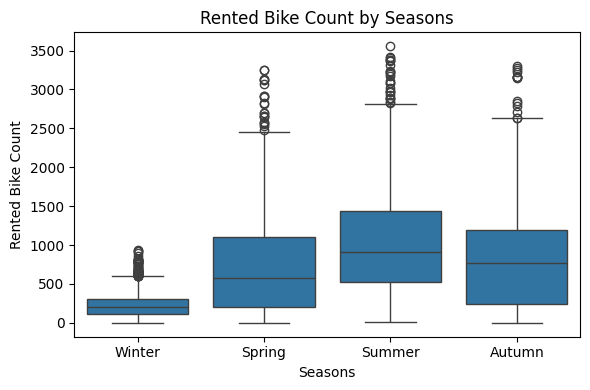

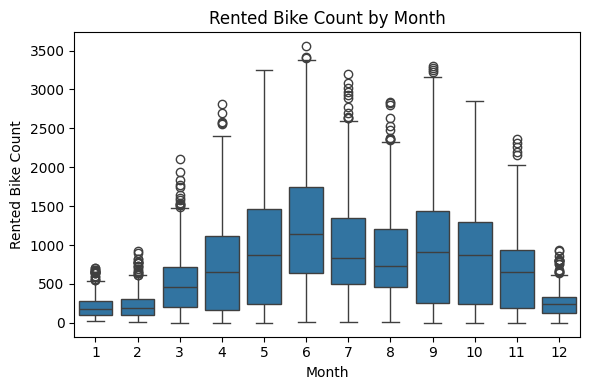

C:\Users\anavn\AppData\Local\Temp\ipykernel_33004\3411066209.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


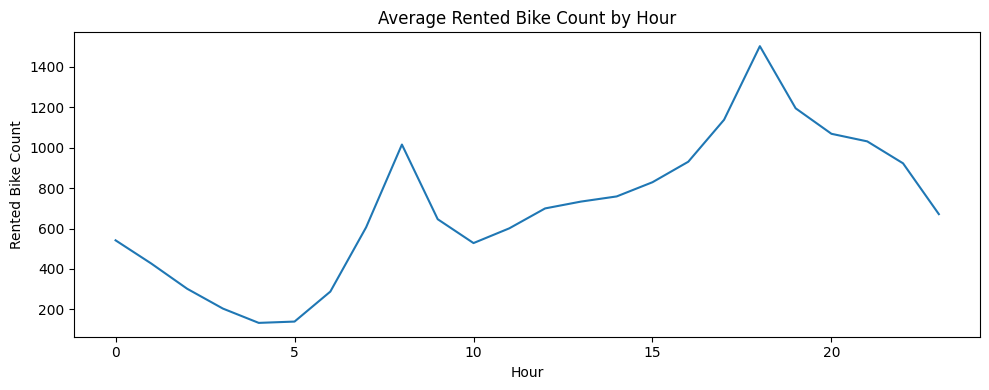

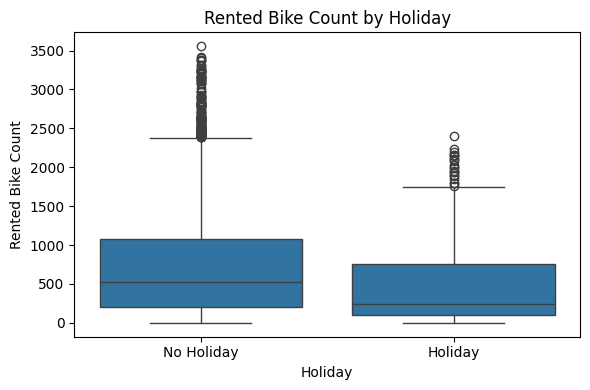

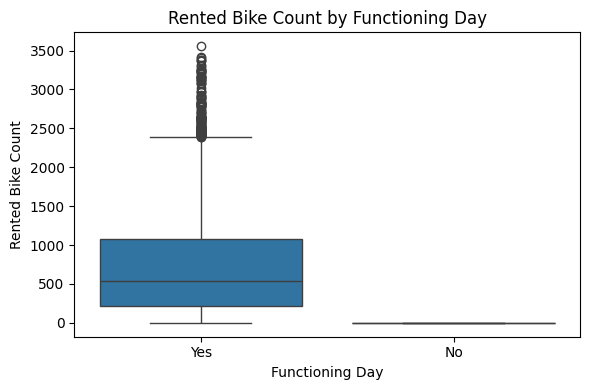

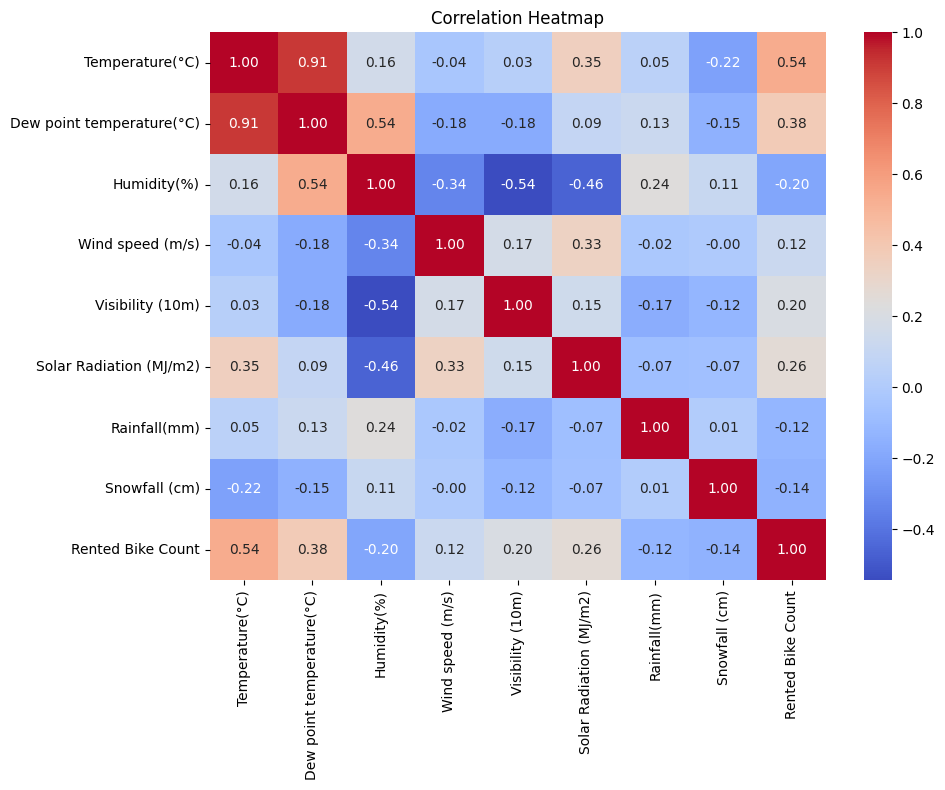

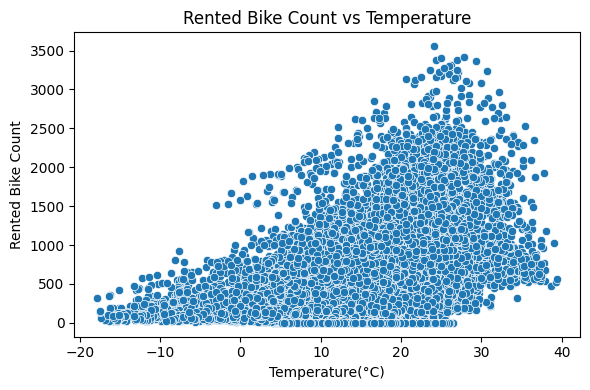

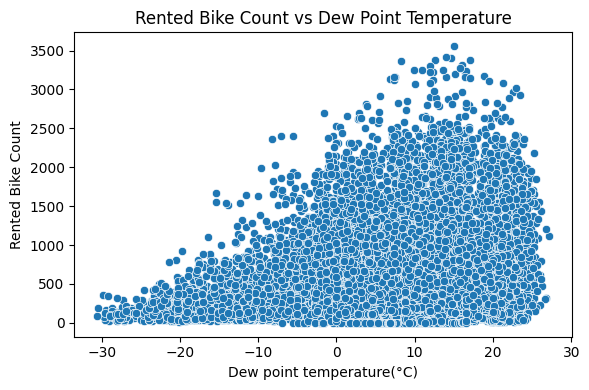

C:\Users\anavn\AppData\Local\Temp\ipykernel_33004\3411066209.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


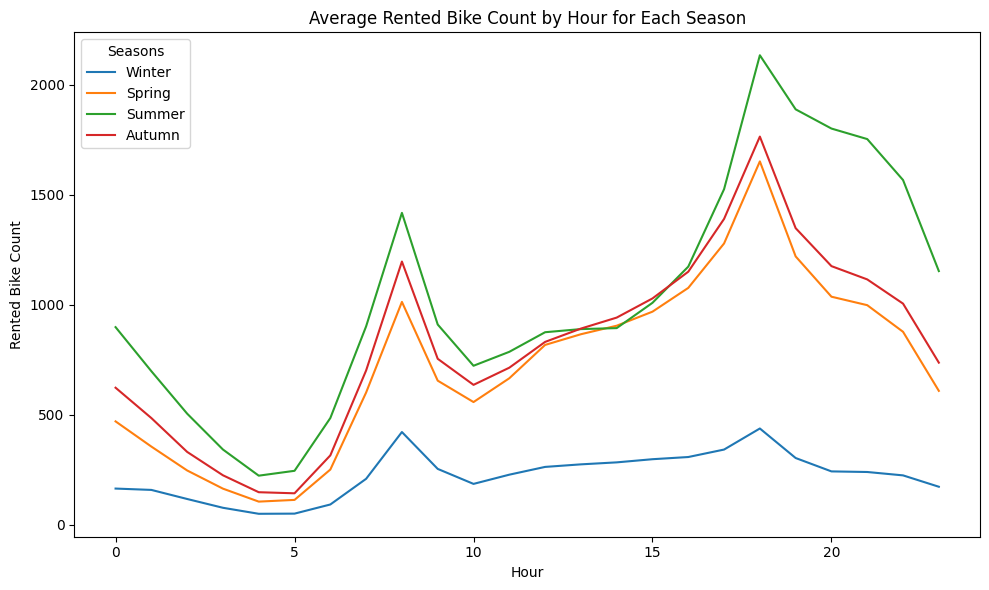

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.5257 | val 0.4905
Epoch 2/100: train 0.2697 | val 0.4113
Epoch 3/100: train 0.2326 | val 0.3193
Epoch 4/100: train 0.2065 | val 0.2880
Epoch 5/100: train 0.1889 | val 0.2553
Epoch 6/100: train 0.1759 | val 0.2556
Epoch 7/100: train 0.1661 | val 0.2173
Epoch 8/100: train 0.1564 | val 0.2167
Epoch 9/100: train 0.1454 | val 0.1963
Epoch 10/100: train 0.1351 | val 0.1835
Epoch 11/100: train 0.1312 | val 0.1824
Epoch 12/100: train 0.1247 | val 0.1783
Epoch 13/100: train 0.1160 | val 0.1814
Epoch 14/100: train 0.1134 | val 0.1676
Epoch 15/100: train 0.1088 | val 0.1772
Epoch 16/100: train 0.1043 | val 0.1685
Epoch 17/100: train 0.1006 | val 0.1513
Epoch 18/100: train 0.0945 | val 0.1511
Epoch 19/100: train 0.0897 | val 0.1540
Epoch 20/100: train 0.0906 | val 0.1353
Epoch 21/100: train 0.0811 | val 0.1413
Epoch 22/100: train 0.0798 | val 0.1397
Epoch 23/100: train 0.0792 | val 0.1252
Epoch 24/100: train 0.0761 | val 0.1588
Epoch 25/100: train 0.0759 | val 0.1124
Epoch 26/

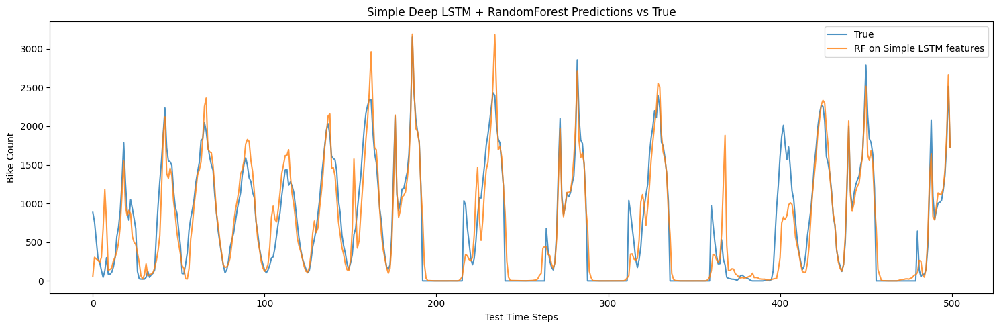

In [3]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42)
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

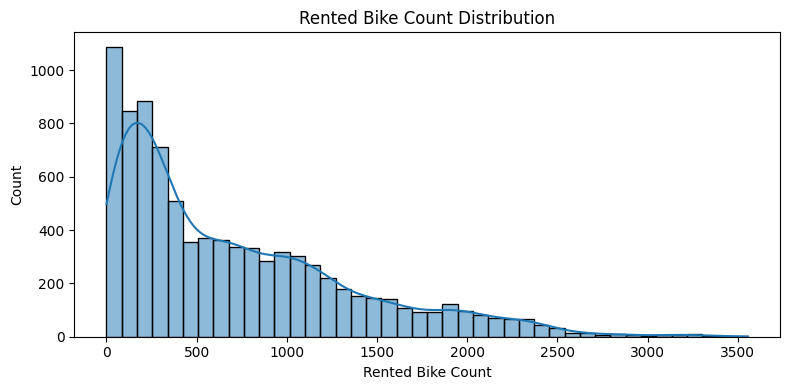

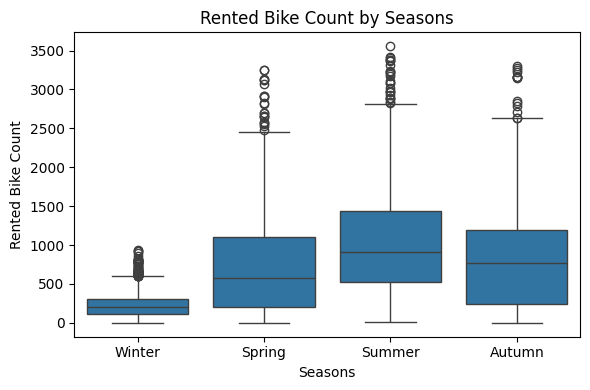

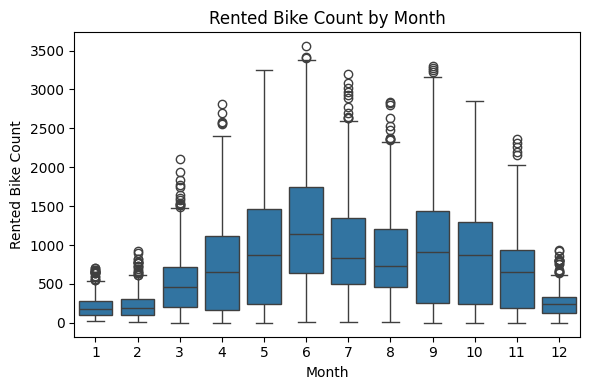

C:\Users\anavn\AppData\Local\Temp\ipykernel_33004\699707399.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


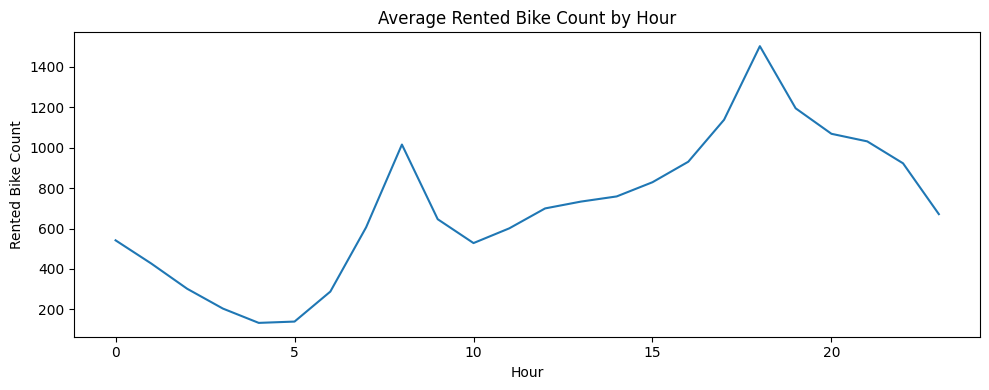

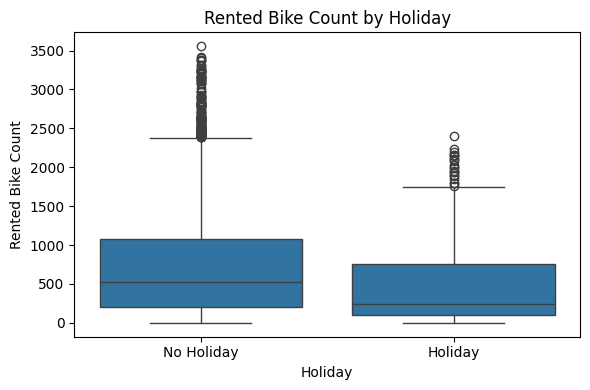

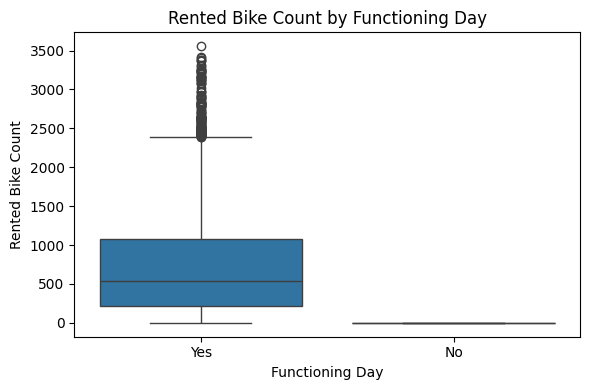

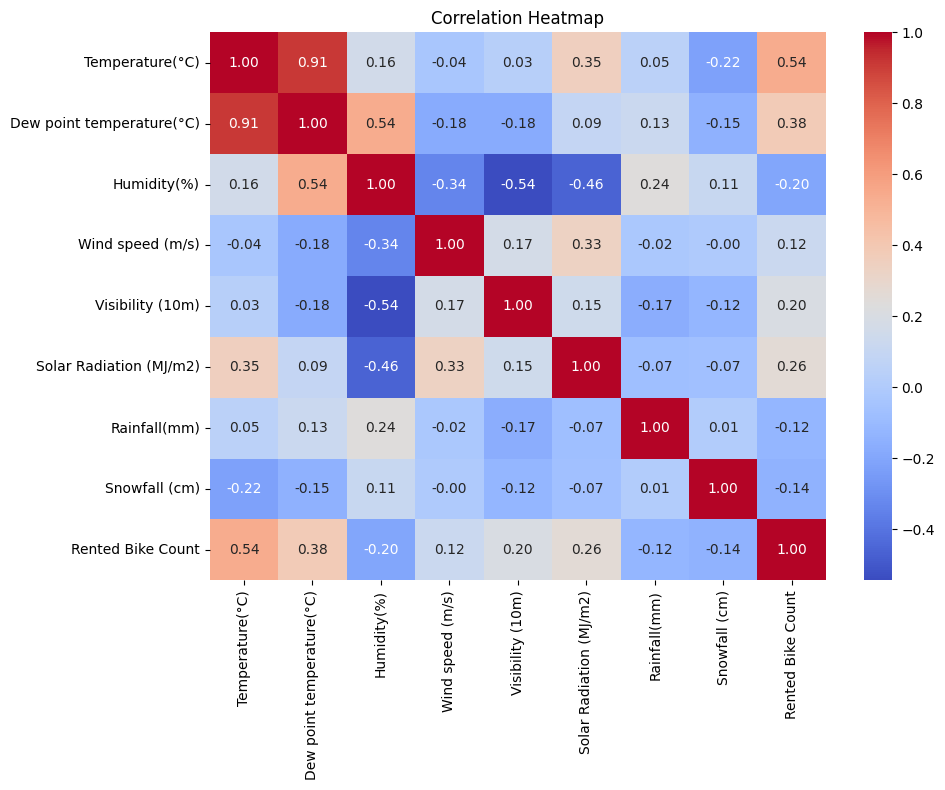

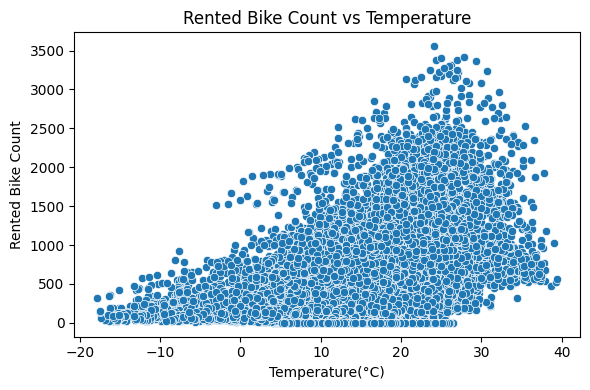

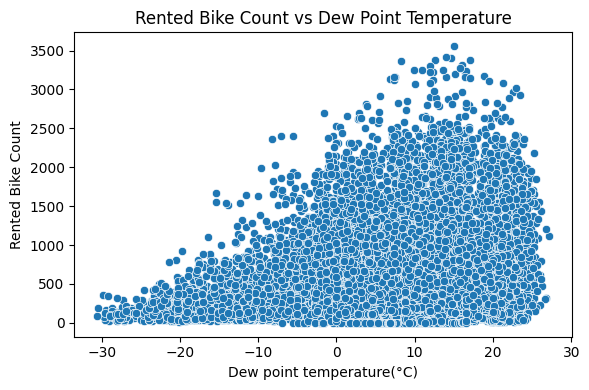

C:\Users\anavn\AppData\Local\Temp\ipykernel_33004\699707399.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


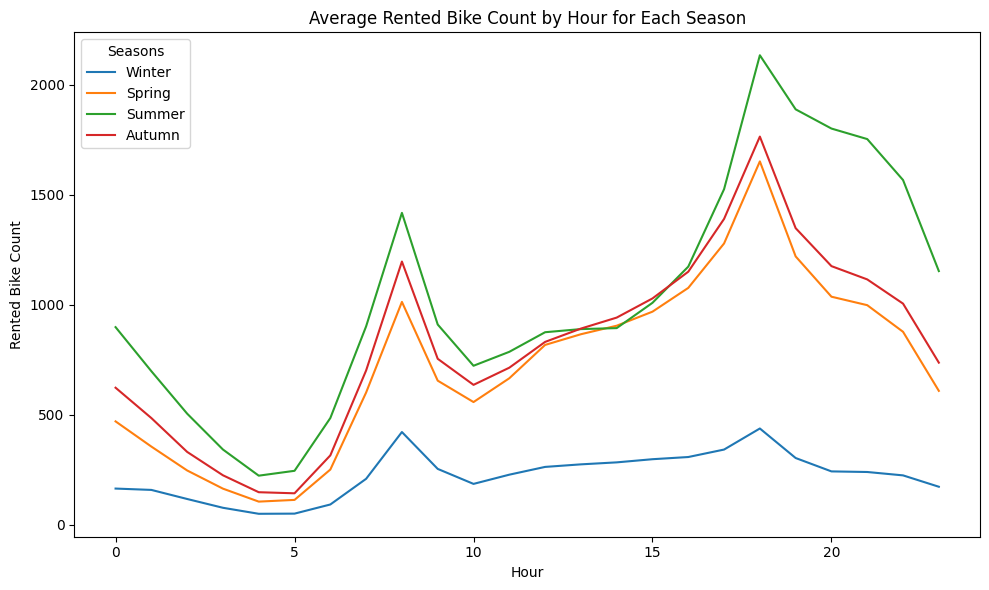

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.5257 | val 0.4905
Epoch 2/100: train 0.2697 | val 0.4113
Epoch 3/100: train 0.2326 | val 0.3193
Epoch 4/100: train 0.2065 | val 0.2880
Epoch 5/100: train 0.1889 | val 0.2553
Epoch 6/100: train 0.1759 | val 0.2556
Epoch 7/100: train 0.1661 | val 0.2173
Epoch 8/100: train 0.1564 | val 0.2167
Epoch 9/100: train 0.1454 | val 0.1963
Epoch 10/100: train 0.1351 | val 0.1835
Epoch 11/100: train 0.1312 | val 0.1824
Epoch 12/100: train 0.1247 | val 0.1783
Epoch 13/100: train 0.1160 | val 0.1814
Epoch 14/100: train 0.1134 | val 0.1676
Epoch 15/100: train 0.1088 | val 0.1772
Epoch 16/100: train 0.1043 | val 0.1685
Epoch 17/100: train 0.1006 | val 0.1513
Epoch 18/100: train 0.0945 | val 0.1511
Epoch 19/100: train 0.0897 | val 0.1540
Epoch 20/100: train 0.0906 | val 0.1353
Epoch 21/100: train 0.0811 | val 0.1413
Epoch 22/100: train 0.0798 | val 0.1397
Epoch 23/100: train 0.0792 | val 0.1252
Epoch 24/100: train 0.0761 | val 0.1588
Epoch 25/100: train 0.0759 | val 0.1124
Epoch 26/

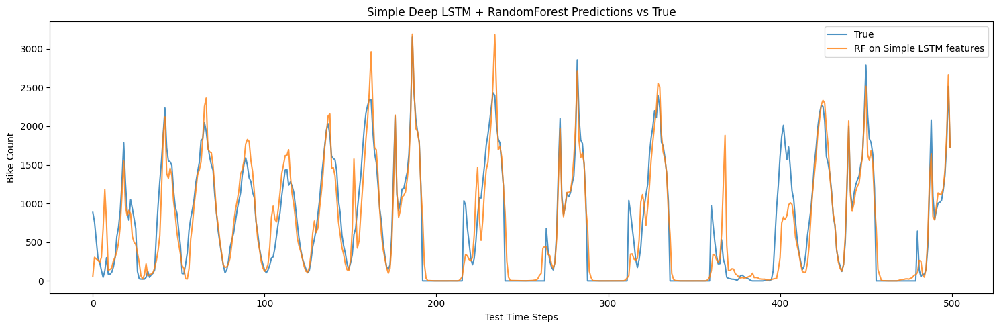

In [4]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42); torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

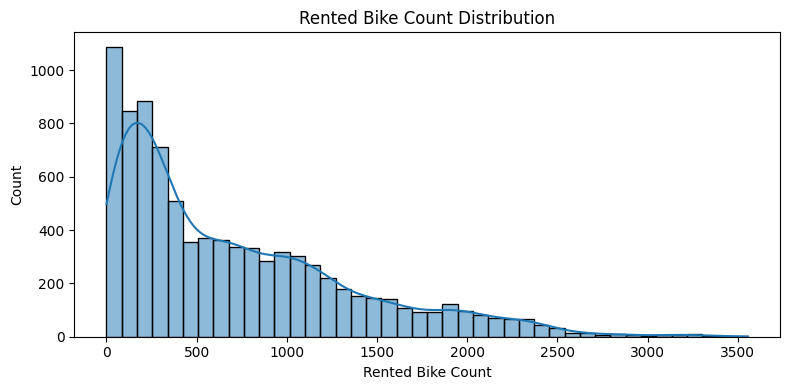

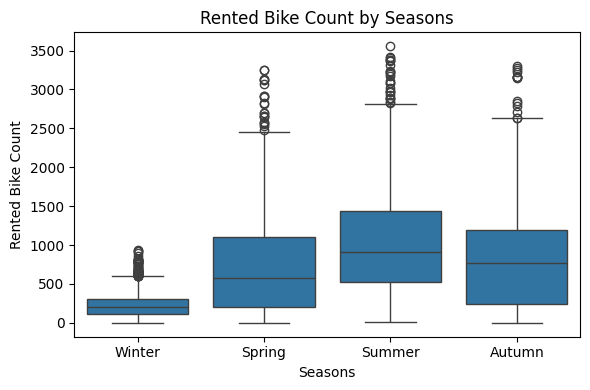

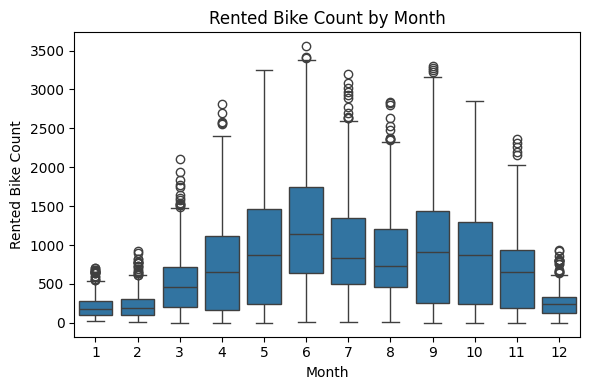

C:\Users\anavn\AppData\Local\Temp\ipykernel_33004\3758544605.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


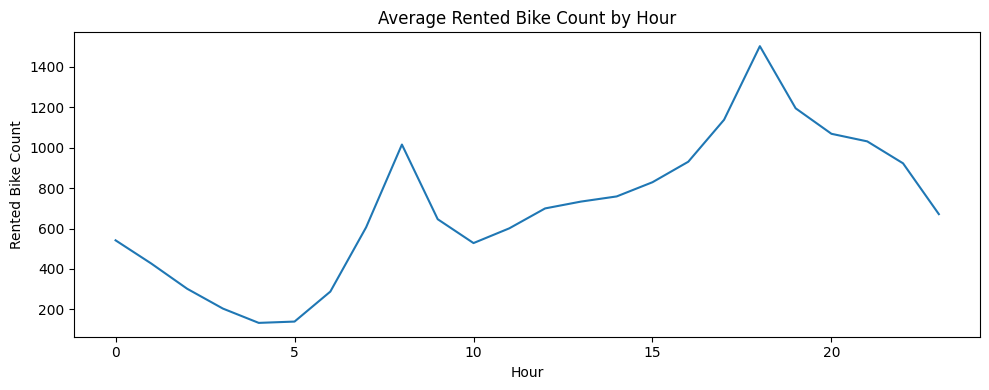

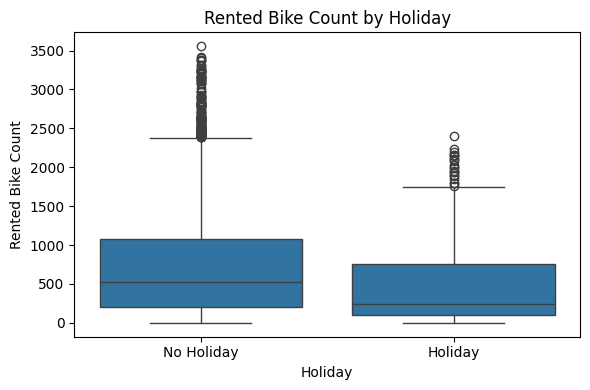

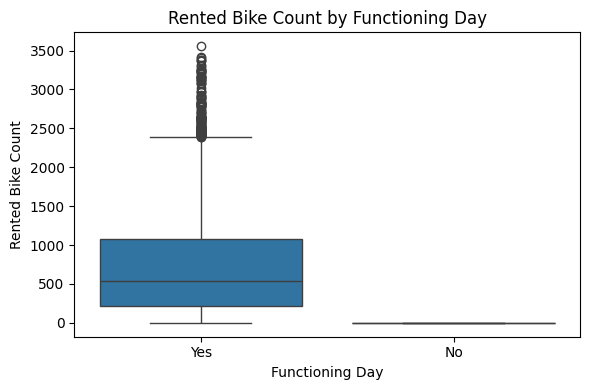

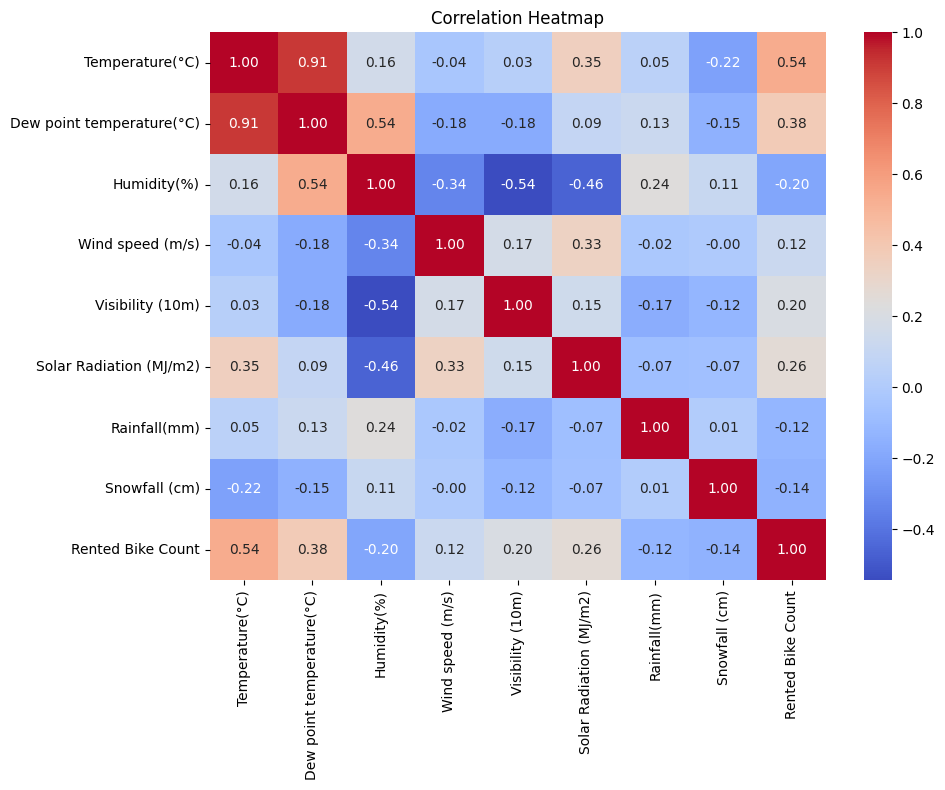

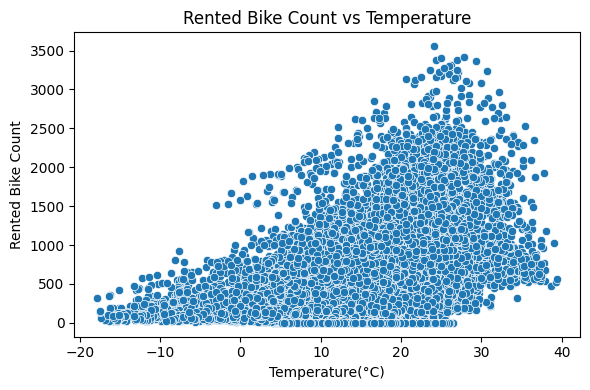

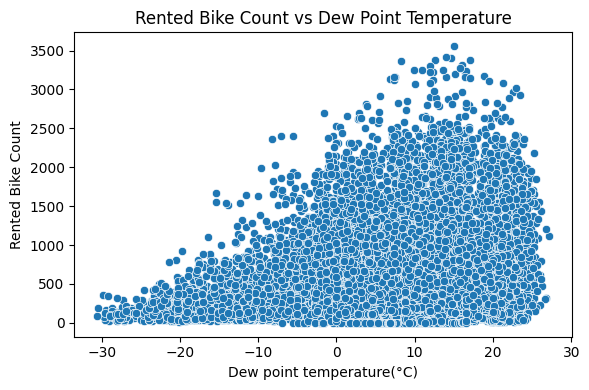

C:\Users\anavn\AppData\Local\Temp\ipykernel_33004\3758544605.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


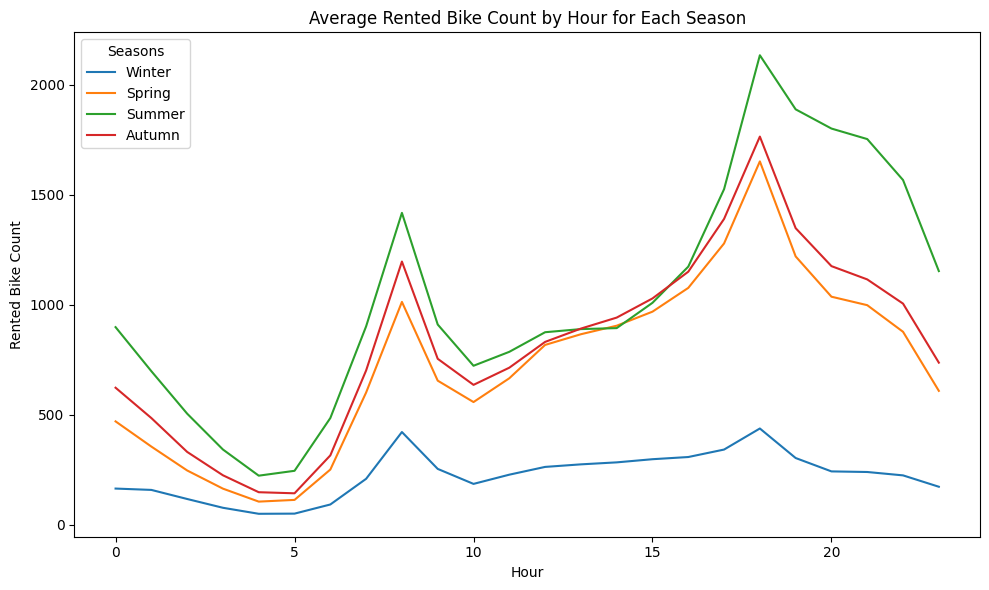

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.5197 | val 0.4696
Epoch 2/100: train 0.2564 | val 0.3682
Epoch 3/100: train 0.2150 | val 0.2980
Epoch 4/100: train 0.1843 | val 0.2722
Epoch 5/100: train 0.1643 | val 0.2210
Epoch 6/100: train 0.1472 | val 0.2077
Epoch 7/100: train 0.1333 | val 0.1732
Epoch 8/100: train 0.1226 | val 0.1571
Epoch 9/100: train 0.1121 | val 0.1334
Epoch 10/100: train 0.1001 | val 0.1297
Epoch 11/100: train 0.0892 | val 0.1045
Epoch 12/100: train 0.0782 | val 0.0972
Epoch 13/100: train 0.0727 | val 0.0855
Epoch 14/100: train 0.0653 | val 0.0942
Epoch 15/100: train 0.0600 | val 0.0761
Epoch 16/100: train 0.0572 | val 0.0772
Epoch 17/100: train 0.0540 | val 0.0617
Epoch 18/100: train 0.0511 | val 0.0645
Epoch 19/100: train 0.0481 | val 0.0578
Epoch 20/100: train 0.0456 | val 0.0579
Epoch 21/100: train 0.0443 | val 0.0577
Epoch 22/100: train 0.0441 | val 0.0521
Epoch 23/100: train 0.0404 | val 0.0551
Epoch 24/100: train 0.0401 | val 0.0571
Epoch 25/100: train 0.0407 | val 0.0510
Epoch 26/

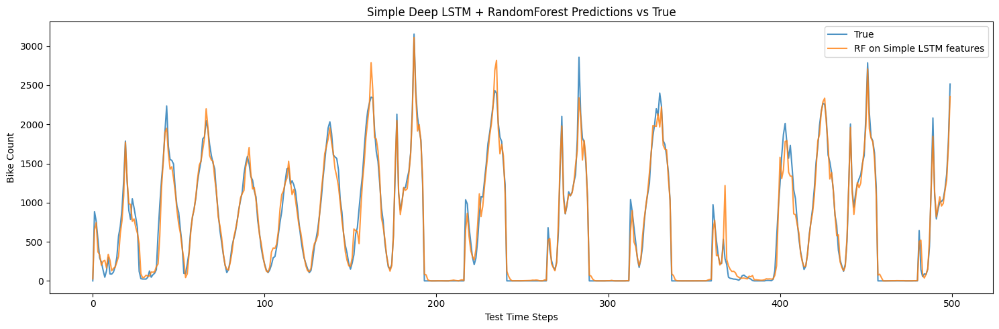

In [5]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42); torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len - 1])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

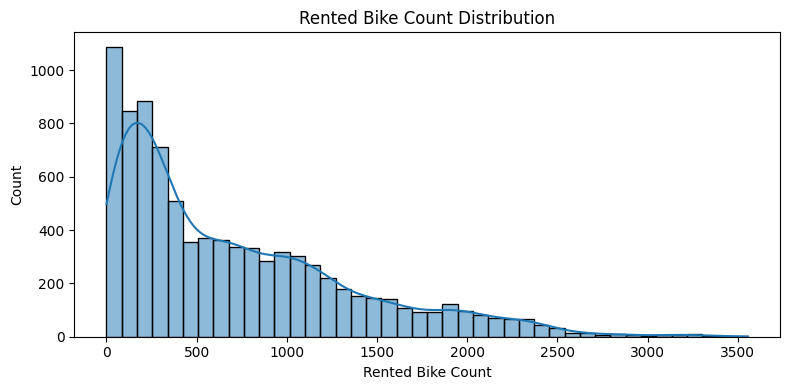

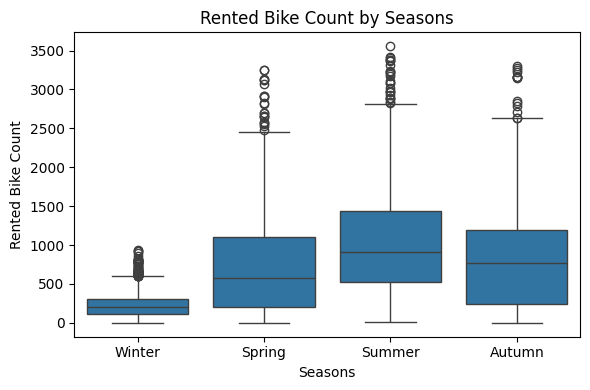

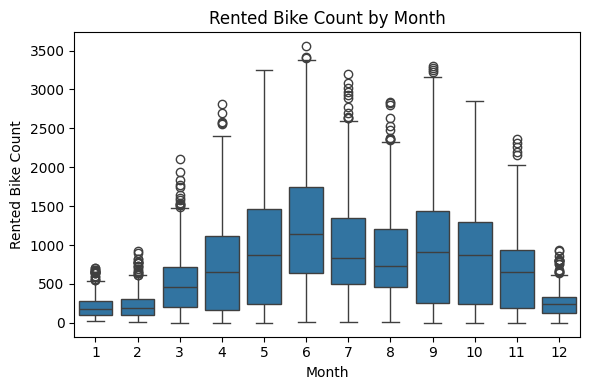

C:\Users\anavn\AppData\Local\Temp\ipykernel_44904\1158702567.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


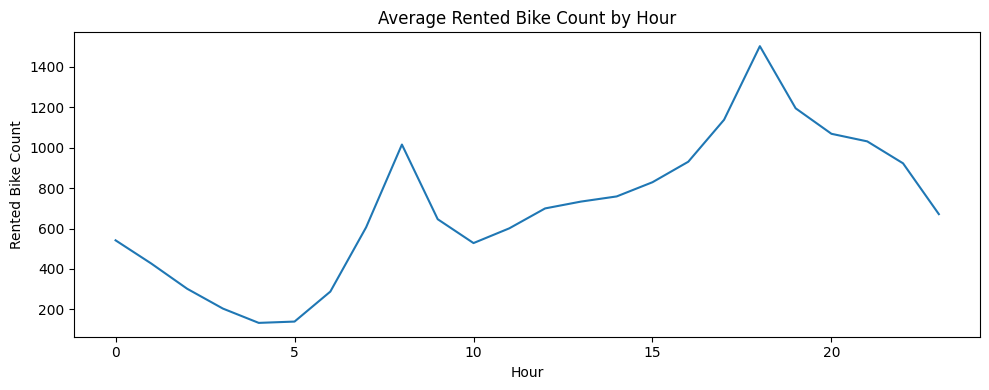

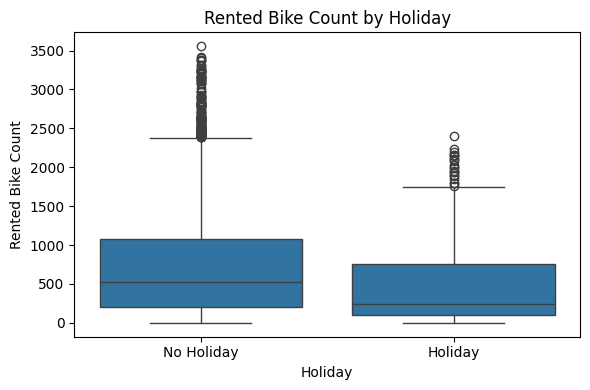

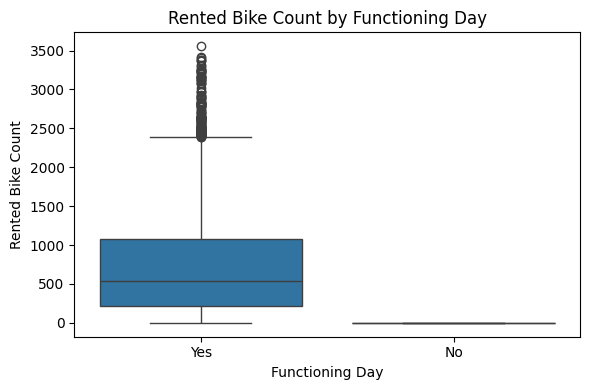

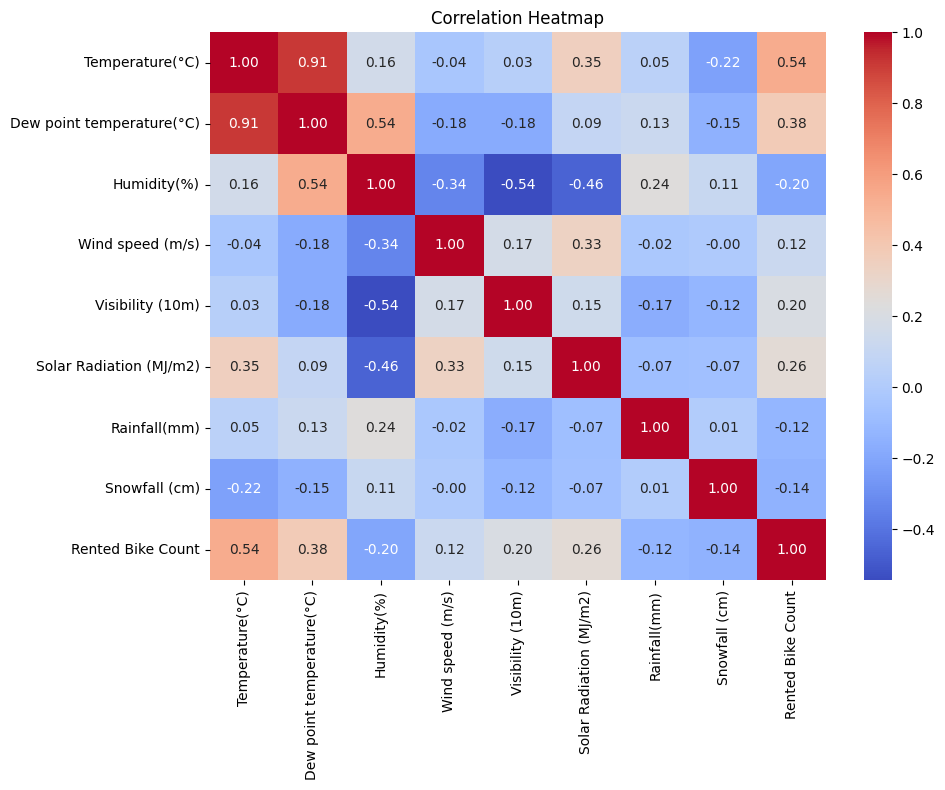

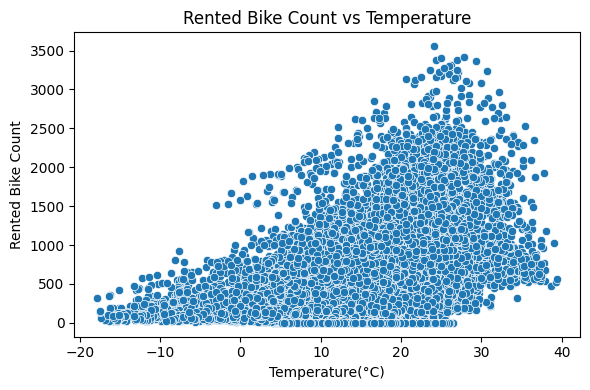

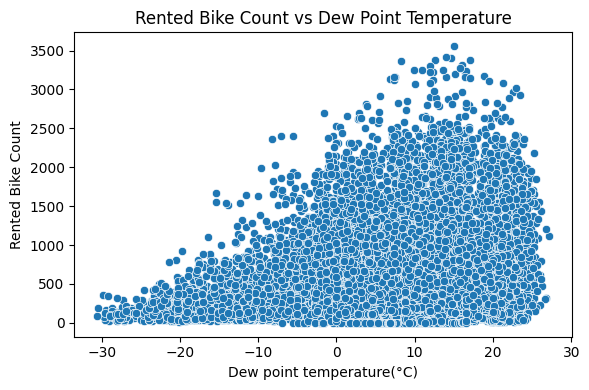

C:\Users\anavn\AppData\Local\Temp\ipykernel_44904\1158702567.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


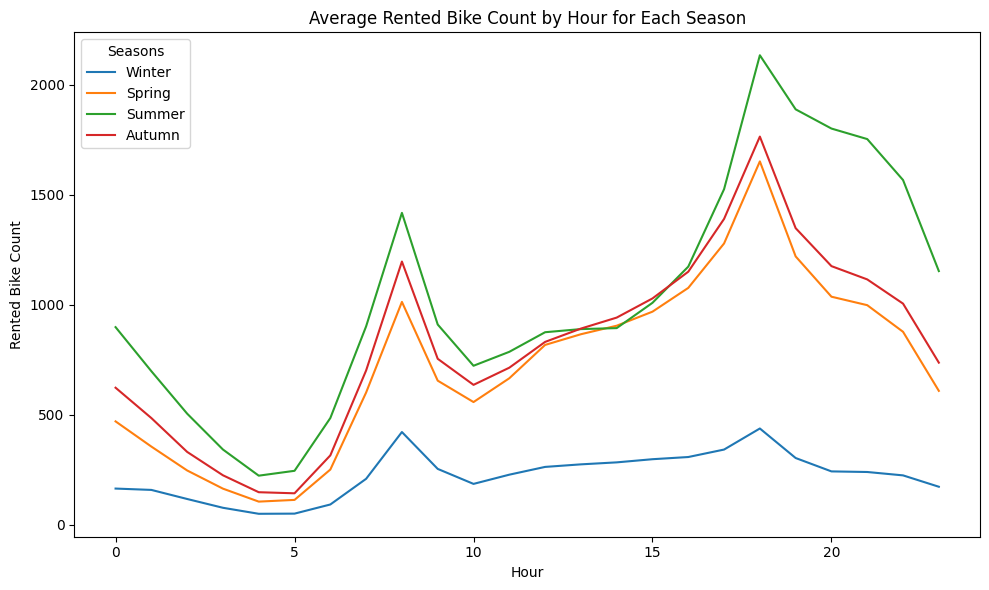

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.4854 | val 0.4797
Epoch 2/100: train 0.2605 | val 0.3831
Epoch 3/100: train 0.2260 | val 0.3157
Epoch 4/100: train 0.2016 | val 0.2650
Epoch 5/100: train 0.1827 | val 0.2509
Epoch 6/100: train 0.1683 | val 0.2260
Epoch 7/100: train 0.1613 | val 0.2259
Epoch 8/100: train 0.1502 | val 0.1945
Epoch 9/100: train 0.1476 | val 0.2070
Epoch 10/100: train 0.1361 | val 0.1904
Epoch 11/100: train 0.1287 | val 0.2052
Epoch 12/100: train 0.1210 | val 0.1829
Epoch 13/100: train 0.1175 | val 0.1843
Epoch 14/100: train 0.1133 | val 0.1708
Epoch 15/100: train 0.1063 | val 0.1599
Epoch 16/100: train 0.1045 | val 0.1672
Epoch 17/100: train 0.0993 | val 0.1564
Epoch 18/100: train 0.0933 | val 0.1457
Epoch 19/100: train 0.0896 | val 0.1434
Epoch 20/100: train 0.0854 | val 0.1379
Epoch 21/100: train 0.0807 | val 0.1425
Epoch 22/100: train 0.0831 | val 0.1480
Epoch 23/100: train 0.0745 | val 0.1324
Epoch 24/100: train 0.0735 | val 0.1187
Epoch 25/100: train 0.0702 | val 0.1249
Epoch 26/

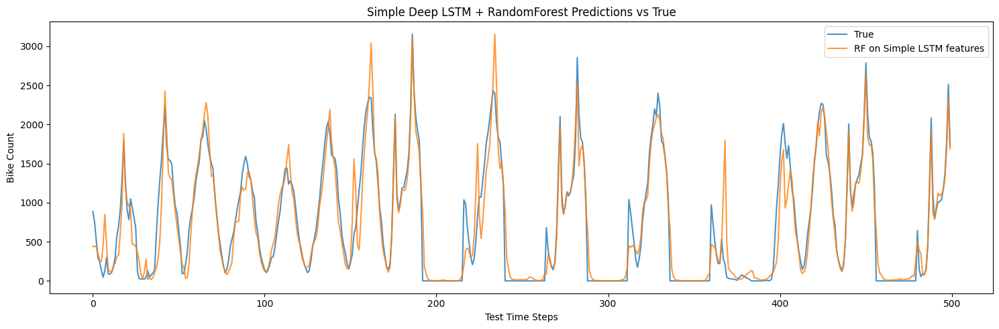

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42); torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=32, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()


Shape: (8760, 14)
Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
dtype: object
                                Date  Rented Bike Count         Hour  \
count                           8760        8760.000000  8760.000000   
mean   2018-05-31 23:59:59.999999744         704.602055    11.500000   
min              2017-12-01 00:00:00           0.000000     0.000000   
25%              2018-03-02 00:00:00         191.000000     5.75

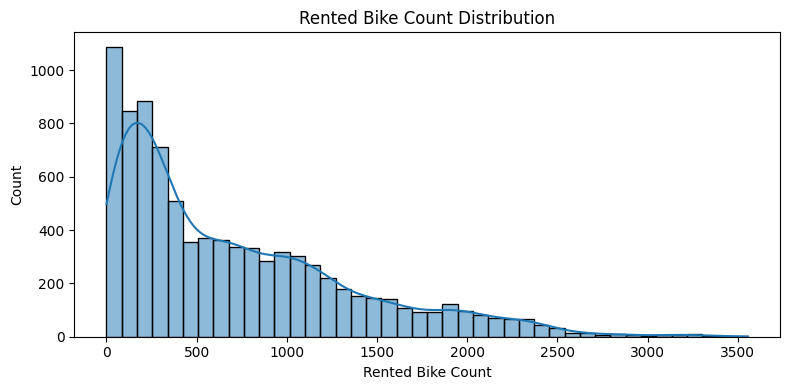

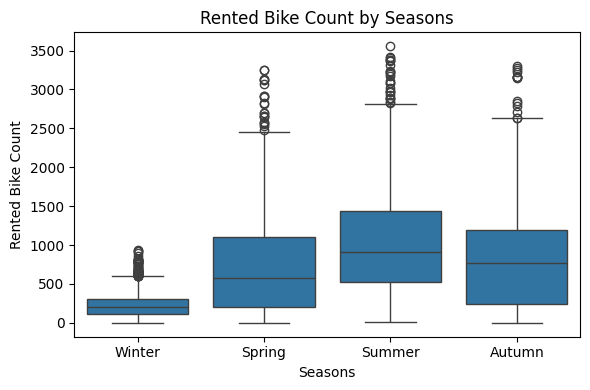

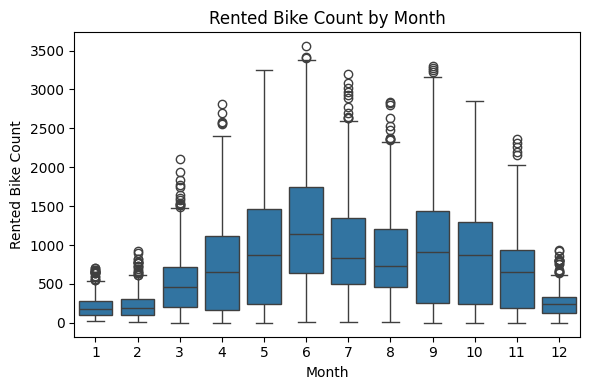

C:\Users\anavn\AppData\Local\Temp\ipykernel_44904\699707399.py:85: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)


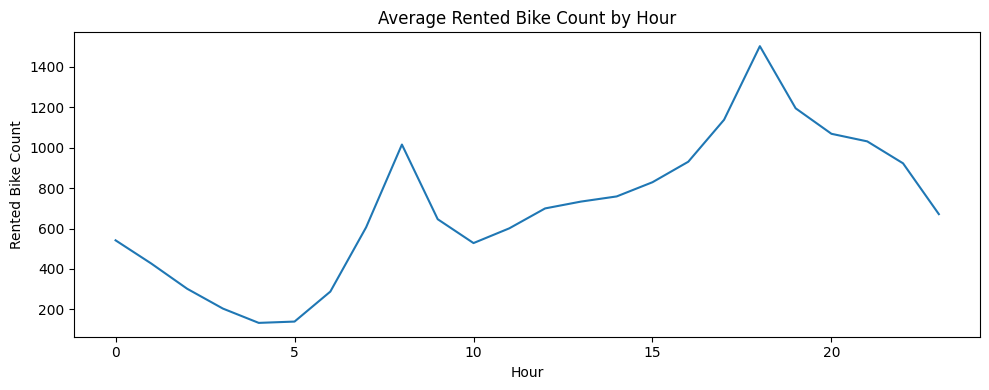

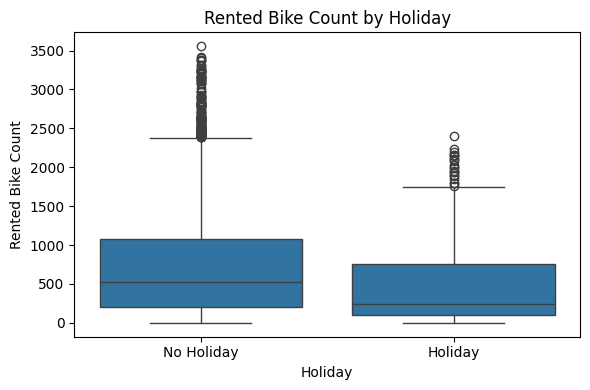

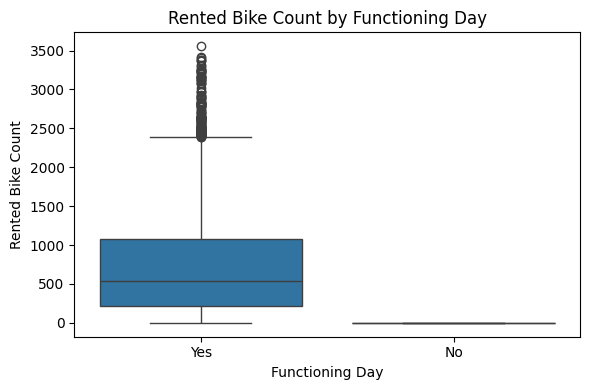

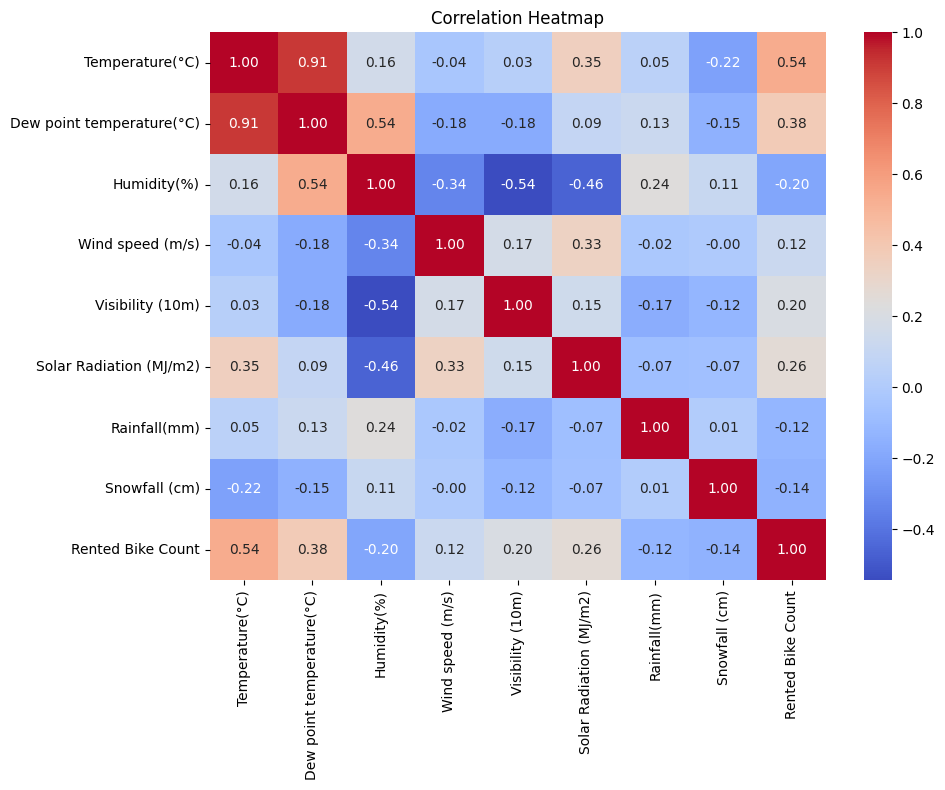

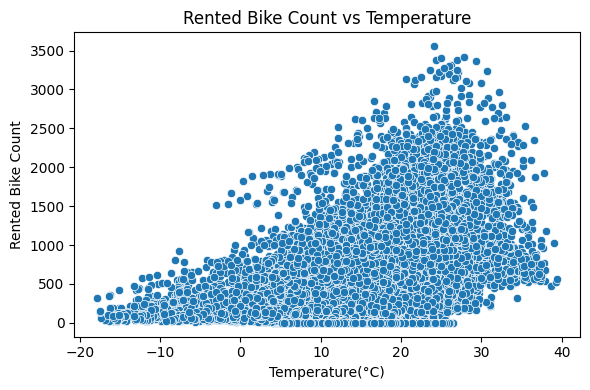

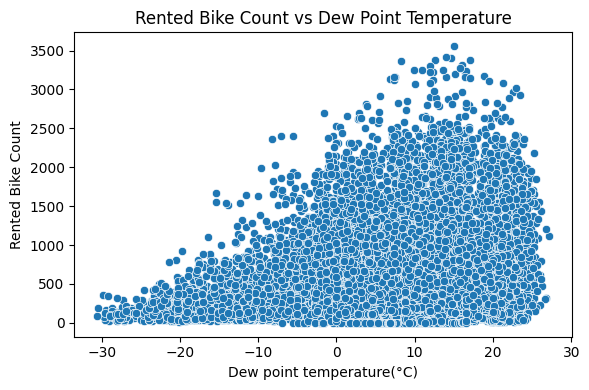

C:\Users\anavn\AppData\Local\Temp\ipykernel_44904\699707399.py:133: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


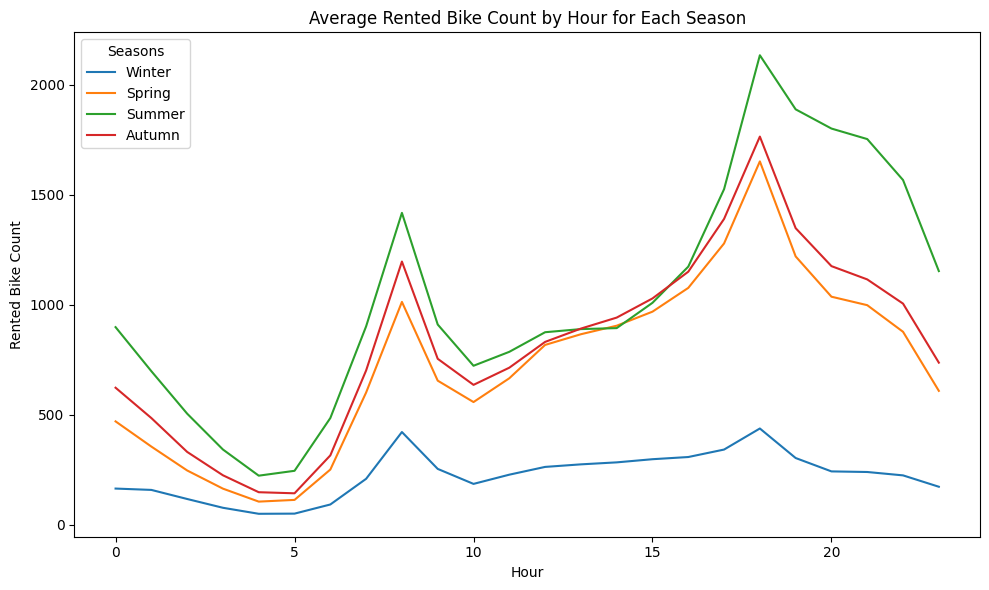

Features after manual removal: 30
Features after manual removal: 28
Training on 5934 train sequences, 1047 val sequences
Sequence shape: (5934, 24, 15), features: 15


d:\SRH\Github\Improving-Forecasting-Accuracy-in-Bike-Rental-Demand-through-Advanced-Deep-Learning-Models\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1
  warnings.warn(


Epoch 1/100: train 0.5257 | val 0.4905
Epoch 2/100: train 0.2697 | val 0.4113
Epoch 3/100: train 0.2326 | val 0.3193
Epoch 4/100: train 0.2065 | val 0.2880
Epoch 5/100: train 0.1889 | val 0.2553
Epoch 6/100: train 0.1759 | val 0.2556
Epoch 7/100: train 0.1661 | val 0.2173
Epoch 8/100: train 0.1564 | val 0.2167
Epoch 9/100: train 0.1454 | val 0.1963
Epoch 10/100: train 0.1351 | val 0.1835
Epoch 11/100: train 0.1312 | val 0.1824
Epoch 12/100: train 0.1247 | val 0.1783
Epoch 13/100: train 0.1160 | val 0.1814
Epoch 14/100: train 0.1134 | val 0.1676
Epoch 15/100: train 0.1088 | val 0.1772
Epoch 16/100: train 0.1043 | val 0.1685
Epoch 17/100: train 0.1006 | val 0.1513
Epoch 18/100: train 0.0945 | val 0.1511
Epoch 19/100: train 0.0897 | val 0.1540
Epoch 20/100: train 0.0906 | val 0.1353
Epoch 21/100: train 0.0811 | val 0.1413
Epoch 22/100: train 0.0798 | val 0.1397
Epoch 23/100: train 0.0792 | val 0.1252
Epoch 24/100: train 0.0761 | val 0.1588
Epoch 25/100: train 0.0759 | val 0.1124
Epoch 26/

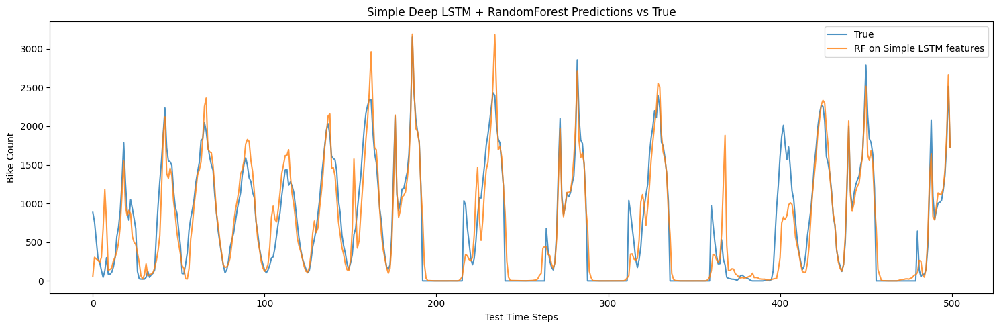

In [3]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random ; random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42); torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False
# ---------------- Early stopping helper ----------------
class EarlyStopper:
    def __init__(self, patience=10, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float('inf')
        self.counter = 0

    def step(self, val_loss):
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            return self.counter >= self.patience

def evaluate_loss(model, loader, criterion, device):
    model.eval()
    losses = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            losses.append(loss.item())
    return np.mean(losses)

# ---------------- 1. Load data ----------------
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')

# Basic cleaning: convert Date to datetime, sort
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df = df.sort_values(['Date', 'Hour']).reset_index(drop=True)

target_col = 'Rented Bike Count'

# ---------------- 2. EDA (same as your script) ----------------
print("Shape:", df.shape)
print(df.dtypes)
print(df.describe())
print("Duplicated rows:", df.duplicated().sum())
print("Missing values:\n", df.isna().sum())

# Target distribution
plt.figure(figsize=(8, 4))
sns.histplot(df[target_col], kde=True)
plt.title('Rented Bike Count Distribution')
plt.tight_layout()
plt.show()

# Month, DayOfWeek, Weekend
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Rented Bike Count by Seasons
plt.figure(figsize=(6, 4))
sns.boxplot(x='Seasons', y=target_col, data=df)
plt.title('Rented Bike Count by Seasons')
plt.tight_layout()
plt.show()

# By Month
plt.figure(figsize=(6, 4))
sns.boxplot(x='Month', y=target_col, data=df)
plt.title('Rented Bike Count by Month')
plt.tight_layout()
plt.show()

# By Hour
plt.figure(figsize=(10, 4))
sns.lineplot(x='Hour', y=target_col, data=df, estimator='mean', ci=None)
plt.title('Average Rented Bike Count by Hour')
plt.tight_layout()
plt.show()

# By Holiday
plt.figure(figsize=(6, 4))
sns.boxplot(x='Holiday', y=target_col, data=df)
plt.title('Rented Bike Count by Holiday')
plt.tight_layout()
plt.show()

# By Functioning Day
plt.figure(figsize=(6, 4))
sns.boxplot(x='Functioning Day', y=target_col, data=df)
plt.title('Rented Bike Count by Functioning Day')
plt.tight_layout()
plt.show()

# Correlation heatmap
num_cols = [
    'Temperature(°C)', 'Dew point temperature(°C)', 'Humidity(%)',
    'Wind speed (m/s)', 'Visibility (10m)',
    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
    target_col
]
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

# Scatter vs Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Temperature')
plt.tight_layout()
plt.show()

# Scatter vs Dew Point Temperature
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Dew point temperature(°C)', y=target_col, data=df)
plt.title('Rented Bike Count vs Dew Point Temperature')
plt.tight_layout()
plt.show()

# Hourly pattern by season
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df,
    x='Hour',
    y=target_col,
    hue='Seasons',
    estimator='mean',
    ci=None
)
plt.title('Average Rented Bike Count by Hour for Each Season')
plt.tight_layout()
plt.show()

# ---------------- 3. Feature engineering ----------------
def add_engineered_features(df, max_lag=3):
    df = df.copy()
    df['Day'] = df['Date'].dt.day
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    # Cyclical encoding FIRST (before using hour_sin)
    df['hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
    df['day_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
    df['day_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)

    # Basic features
    df['feels_like_temp'] = df['Temperature(°C)'] - (0.1 * df['Humidity(%)'])
    df['is_weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
    df['is_morning_peak'] = df['Hour'].isin([7, 8, 9, 10]).astype(int)
    df['is_evening_peak'] = df['Hour'].isin([17, 18, 19, 20]).astype(int)
    df['is_low_demand_hour'] = df['Hour'].between(0, 5).astype(int)
    

    # Categorical encoding
    df['Holiday'] = df['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
    df['Functioning Day'] = df['Functioning Day'].map({'Yes': 1, 'No': 0})

    # Lags
    for lag in range(1, max_lag + 1):
        df[f'lag_{lag}'] = df[target_col].shift(lag)

    # Season dummies
    if 'Seasons' in df.columns:
        df = pd.get_dummies(df, columns=['Seasons'], drop_first=True)

    df = df.dropna().reset_index(drop=True)
    return df

df = add_engineered_features(df)

feature_cols = [
    'Hour', 'Day', 'Month', 'DayOfWeek', 'WeekOfYear',
    'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
    'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
    'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 'Functioning Day',
    'feels_like_temp', 'is_weekend', 'is_morning_peak', 'is_evening_peak',
    'is_low_demand_hour',
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos','lag_1', 'lag_2', 'lag_3'
]
feature_cols += [col for col in df.columns if col.startswith('Seasons_')]
print(f"Features after manual removal: {len(feature_cols)}")
# drop_these = ['lag_3', 'Dew point temperature(°C)', 'WeekOfYear']
drop_these = ['WeekOfYear', 'feels_like_temp']
feature_cols = [col for col in feature_cols if col not in drop_these]
print(f"Features after manual removal: {len(feature_cols)}")  
# ---------------- 4. Chronological train / test split ----------------
unique_dates = df['Date'].dt.date.unique()
split_index = int(len(unique_dates) * 0.8)
train_dates = unique_dates[:split_index]
test_dates = unique_dates[split_index:]

train_df = df[df['Date'].dt.date.isin(train_dates)].reset_index(drop=True)
test_df = df[df['Date'].dt.date.isin(test_dates)].reset_index(drop=True)

X_train = train_df[feature_cols].values.astype(np.float32)
y_train = train_df[target_col].values.astype(np.float32)
X_test = test_df[feature_cols].values.astype(np.float32)
y_test = test_df[target_col].values.astype(np.float32)

# ---------------- 5. Feature selection with XGBoost ----------------
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
importances = xgb_model.feature_importances_
feat_imp_df = pd.DataFrame({'feature': feature_cols, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values('importance', ascending=False)

top_n = 15
selected_features = feat_imp_df['feature'].iloc[:top_n].tolist()
X_train_sel = train_df[selected_features].values.astype(np.float32)
X_test_sel = test_df[selected_features].values.astype(np.float32)

# ---------------- 6. Scaling ----------------
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train_sel)
X_test_scaled = scaler_X.transform(X_test_sel)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# ---------------- 7. Sequence creation ----------------
# def create_sequences(X, y, seq_len=24):
#     X_seq, y_seq = [], []
#     for i in range(len(X) - seq_len):
#         X_seq.append(X[i:i + seq_len])
#         y_seq.append(y[i + seq_len - 1])
#     return np.array(X_seq, dtype=np.float32), np.array(y_seq, dtype=np.float32)

def create_sequences(X, y, seq_len=24):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_len):  
        X_seq.append(X[i:i + seq_len])     # Up to t
        y_seq.append(y[i + seq_len])       # Predict t+1
    return np.array(X_seq), np.array(y_seq)


seq_len = 24
X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, seq_len)
X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, seq_len)

n_features = X_train_seq.shape[2]
X_test_torch = torch.from_numpy(X_test_seq)
y_test_torch = torch.from_numpy(y_test_seq).unsqueeze(1)

# Train/val split from training sequences (time-based, end part as val)
val_ratio = 0.15
val_size = int(len(X_train_seq) * val_ratio)

X_tr_seq = X_train_seq[:-val_size]
y_tr_seq = y_train_seq[:-val_size]
X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]

X_tr_torch = torch.from_numpy(X_tr_seq)
y_tr_torch = torch.from_numpy(y_tr_seq).unsqueeze(1)
X_val_torch = torch.from_numpy(X_val_seq)
y_val_torch = torch.from_numpy(y_val_seq).unsqueeze(1)

train_dataset = TensorDataset(X_tr_torch, y_tr_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print(f"Training on {X_tr_seq.shape[0]} train sequences, {X_val_seq.shape[0]} val sequences")
print(f"Sequence shape: {X_tr_seq.shape}, features: {n_features}")

# ---------------- 8. Simple Deep LSTM Model ----------------
class SimpleDeepLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim1=128, hidden_dim2=64, hidden_dim3=34, dropout=0.3):
        super().__init__()
        self.lstm1 = nn.LSTM(input_dim, hidden_dim1, batch_first=True, dropout=dropout)
        self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, batch_first=True, dropout=dropout)
        self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim3, 1)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out, _ = self.lstm2(out)
        out, _ = self.lstm3(out)
        # Use last timestep output
        out = out[:, -1, :]
        out = self.dropout(out)
        output = self.fc(out)
        return output

# Create model
input_dim = n_features
model = SimpleDeepLSTM(input_dim=input_dim, dropout=0.25)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# print(f"Simple Deep LSTM: input_dim={input_dim}, hidden=[256,128,64]")

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)
criterion = nn.MSELoss()
epochs = 100
early_stopper = EarlyStopper(patience=10, min_delta=1e-4)

# ---------------- 9. Training with early stopping ----------------
for epoch in range(epochs):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = evaluate_loss(model, val_loader, criterion, device)
    print(f"Epoch {epoch + 1}/{epochs}: train {train_loss:.4f} | val {val_loss:.4f}")

    if early_stopper.step(val_loss):
        print(f"Early stopping at epoch {epoch + 1}")
        break

# ---------------- 10. Extract LSTM features for RF ----------------
def extract_features(model, loader, device):
    model.eval()
    all_feats = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            # Extract features from final LSTM layer (last timestep)
            out, _ = model.lstm1(xb)
            out, _ = model.lstm2(out)
            out, _ = model.lstm3(out)
            feats = out[:, -1, :]  # [B, hidden_dim3=64]
            all_feats.append(feats.cpu().numpy())
            all_targets.append(yb.numpy())
    all_feats = np.concatenate(all_feats, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    return all_feats, all_targets

train_loader_full = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader_full = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

train_feats, train_targets_scaled = extract_features(model, train_loader_full, device)
test_feats, test_targets_scaled = extract_features(model, test_loader_full, device)

# Inverse-scale targets back to original scale
train_targets = scaler_y.inverse_transform(train_targets_scaled)
test_targets = scaler_y.inverse_transform(test_targets_scaled)

# ---------------- 11. RandomForest on LSTM features ----------------
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(train_feats, train_targets.ravel())
rf_preds = rf.predict(test_feats)

# ---------------- TRAIN Evaluation (original scale) ----------------
rf_train_preds = rf.predict(train_feats)

y_true_train_orig = train_targets
y_pred_train_orig = rf_train_preds.reshape(-1, 1)

train_mse = np.mean((y_true_train_orig - y_pred_train_orig) ** 2)
train_rmse = np.sqrt(train_mse)
train_mae = np.mean(np.abs(y_true_train_orig - y_pred_train_orig))

safe_idx_train = y_true_train_orig > 10
train_mape = np.mean(
    np.abs((y_true_train_orig[safe_idx_train] - y_pred_train_orig[safe_idx_train]) /
           y_true_train_orig[safe_idx_train])
) * 100

train_smape = np.mean(
    2 * np.abs(y_pred_train_orig - y_true_train_orig) /
    (np.abs(y_true_train_orig) + np.abs(y_pred_train_orig) + 1e-8)
) * 100

train_r2 = r2_score(y_true_train_orig, y_pred_train_orig)

print("\n=== Simple Deep LSTM features + RandomForest TRAIN Results ===")
print(f"Train MSE: {train_mse:.4f}")
print(f"Train RMSE: {train_rmse:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Train MAPE: {train_mape:.2f}%")
print(f"Train SMAPE: {train_smape:.2f}%")
print(f"Train R2: {train_r2:.4f}")


# ---------------- 12. Evaluation on TEST set (original scale) ----------------
y_true_all_orig = test_targets
y_pred_all_orig = rf_preds.reshape(-1, 1)

mse = np.mean((y_true_all_orig - y_pred_all_orig) ** 2)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_true_all_orig - y_pred_all_orig))
safe_idx = y_true_all_orig > 10
mape = np.mean(
    np.abs((y_true_all_orig[safe_idx] - y_pred_all_orig[safe_idx]) /
           y_true_all_orig[safe_idx])
) * 100
smape = np.mean(
    2 * np.abs(y_pred_all_orig - y_true_all_orig) /
    (np.abs(y_true_all_orig) + np.abs(y_pred_all_orig) + 1e-8)
) * 100
r2 = r2_score(y_true_all_orig, y_pred_all_orig)

print("\n=== Simple Deep LSTM features + RandomForest TEST Results ===")
print(f"Test MSE: {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test MAPE: {mape:.2f}%")
print(f"Test SMAPE: {smape:.2f}%")
print(f"Test R2: {r2:.4f}")

# ---------------- 13. Plot predictions ----------------
plt.figure(figsize=(15, 5))
plt.plot(y_true_all_orig[:500], label='True', alpha=0.8)
plt.plot(y_pred_all_orig[:500], label='RF on Simple LSTM features', alpha=0.8)
plt.legend()
plt.title('Simple Deep LSTM + RandomForest Predictions vs True')
plt.ylabel('Bike Count')
plt.xlabel('Test Time Steps')
plt.tight_layout()
plt.show()
